Main plotting script for Bushinsky et al. 2024 submission to GBC: "Offset between profiling float and shipboard oxygen observations at depth imparts bias on float pH and derived pCO2"


In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import glob, os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
# from datetime import datetime, date, time
# import time
from scipy import stats
import functions.carbon_utils as carbon_utils 
import PyCO2SYS as pyco2
from scipy import interpolate
from tabulate import tabulate
# import re
import matplotlib.gridspec as gridspec
import functions.pH_NO3_DIC_pCO2_impact_calcs as derived_functions
import docx
from tqdm import tqdm
import warnings


### Set directories and filenames

In [2]:
plot_ver = '_vR1'
# glodap_offsets_filename = 'glodap_offsets_100km_1450_to_2000_100m_0.005dens_0.005spice_4.nc'
# glodap_mean_offsets_filename = \
#     'glodap_offsets_100km_1450_to_2000_100m_0.005dens_0.005spice_4_floatmean_withcalibration.nc'

# glodap_offsets_filename = 'glodap_offsets_100km_1_to_50_50m_0.1dens_0.1spice_5.nc'
# glodap_mean_offsets_filename = glodap_offsets_filename[:-3] + '_floatmean_withcalibration.nc'

base_file_name = '100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_14'

code_ver = base_file_name[-3:]
print(code_ver)
# glodap_offsets_filename = 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_10_all_offsets_depth_grouped_year_filt_0_5_level_1500.nc'
# glodap_mean_offsets_filename = 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_10_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc'

glodap_offsets_filename = 'glodap_offsets_' + base_file_name + '_all_offsets_depth_grouped_year_filt_0_5_level_1500.nc'
glodap_mean_offsets_filename = 'glodap_offsets_' + base_file_name + '_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc'
# read in a user-created text file to point to local directories to avoid having to change this every time 
# we update code

lines=[]
with open('path_file.txt') as f:
    lines = f.readlines()
    
count = 0
for line in lines:
    count += 1
    index = line.find("=")
    #print(f'line {count}: {line}')
    #print(index)
    #print(line[0:index])
    line = line.rstrip()
    if line[0:index].find("argo")>=0:
        argo_path=line[index+1:]
    elif line[0:index].find("liar")>=0:
        liar_dir=line[index+1:]
    elif line[0:index].find("matlab")>=0:
        matlab_dir=line[index+1:]
        
# Set the paths
# output_dir = 'output/'
# output_dir = 'output/glodap_offset_plots/grouped_plots/2024_01_02/'
output_dir =  argo_path + '../output_' + base_file_name + '/glodap_offset_plots/2024_10_22/'
data_dir = 'data/'
output_dir_figs = 'figures_o2_bias/'
manuscript_figs = '../figures/'
#check directories exist
if not os.path.isdir('figures_o2_bias'):
    os.mkdir('figures_o2_bias')

argo_path_derived = argo_path+'../derived_for_crossovers_' + base_file_name + '/'
argo_path_interpolated = argo_path + '../interpolated_for_crossovers_' + base_file_name + '/'


_14


In [3]:
# to save out word documents with tables
def print_word_table(dir, filename, title, headers, data_table):
    # save the table as a word document
    doc = docx.Document()

    # Add a Title to the document 
    doc.add_heading(title, 0) 

    # Creating a table object 
    table = doc.add_table(rows=1, cols=len(headers)) 
    table.style = 'Table Grid'

    row = table.rows[0].cells 
    for r in range(0, len(headers)):
        row[r].text = headers[r]
    # row[0].text = 'Float cal. type'
    # row[1].text = 'Count'
    # row[2].text = 'Mean'
    # row[3].text = 'SD'
    # row[4].text = 'p_value'
    # row[5].text = str(CI_level*100) + '% CI low'
    # row[6].text = str(CI_level*100) + '% CI high'
    # row[7].text = 'Median'
    # row[8].text = 'Min.'
    # row[9].text = 'Max.'

    for cell in row:
        run = cell.paragraphs[0].runs[0]
        run.font.bold = True
        run.font.name = 'Arial'
            
    for idx_row, i in enumerate(data_table): # read out rows of the table
        row = table.add_row().cells 

        for idx, q in enumerate(i):
            row[idx].text = str(q)
            
            run = row[idx].paragraphs[0].runs[0]
            run.font.name = 'Times New Roman'
            if idx==0:
                run = row[idx].paragraphs[0].runs[0]
                run.font.bold = True

    doc.save(dir + filename + '.docx')

### Code for calculating sensor types, etc. Read in all float Sprof files from argo path

In [25]:
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('Sprof.nc'):
        argolist.append(file)

last = 0
print(len(argolist))

2162


Count number of profiles of different types, deployment times, etc.

In [8]:
# count number of different types of profiles (delayed mode, real time, etc.)
parameter_counts = {}
break_all=0
oxygen_adjusted_change = []

for n in tqdm(range(len(argolist))): #ange(last, len(argolist)):
    new_float = {}

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="invalid value encountered in cast")
        argo_n = xr.load_dataset(argo_path+argolist[n])

    #Finding and removing all non-delayed mode data
        # sometimes parameters are missing from profiles - 
        # need to loop through all profiles and check which parameters are present
    parameter_array = argo_n.STATION_PARAMETERS.values.astype(str)

    # create a list of all parameters in the float:
    for idx in range(len(parameter_array)):
        prof_parameters = parameter_array[idx]
        for var in prof_parameters:
            var_str = var.strip()
            if var_str not in new_float:
                new_float[var_str] = 1

            # initialize parameter_counts with variables if they don't exist
            if var_str not in parameter_counts: # if variable is new, create first profile record
                parameter_counts[var_str]={}
                parameter_counts[var_str]['Total_Floats'] = 0
                parameter_counts[var_str]['Total_Profiles'] = 0
                
                parameter_counts[var_str]['Real_Time_Mode_Profiles'] = 0
                parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] = 0

                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] = 0
                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] = 0

                parameter_counts[var_str]['Delayed_Mode_Profiles'] = 0
                parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] = 0
    var_list = list(argo_n.data_vars) 

    # loop through profiles
    for idx in range(len(parameter_array)):
        # print(prof_parameters)

        # loop through each paramter in the profile, count numbers of: X profiles, X profiles with data, X profiles with adjusted data, X profiles with adjusted, delayed mode data
        for var in prof_parameters:
            
            var_str = var.strip()
            if len(var_str)==0: # only proceed if the variable exists 
                continue

            if new_float[var_str]==1:
                parameter_counts[var_str]['Total_Floats'] = parameter_counts[var_str]['Total_Floats'] + 1
                new_float[var_str]=0

            parameter_counts[var_str]['Total_Profiles'] = parameter_counts[var_str]['Total_Profiles'] + 1

            var_ind = [idx for idx, s in enumerate(prof_parameters) if s.strip()== var_str]
            # print(var_ind)

            # get parameter data mode values for that profile / variable
            var_data_mode = argo_n.PARAMETER_DATA_MODE[idx,var_ind].values
            # print(var_data_mode)

            decoded_arr = np.array([elem.decode() if isinstance(elem, bytes) else np.nan for elem in var_data_mode.flatten()])
            # print(decoded_arr)
            if decoded_arr == 'R':
                parameter_counts[var_str]['Real_Time_Mode_Profiles'] = parameter_counts[var_str]['Real_Time_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] + 1
            elif decoded_arr=='A':
                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] = parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] + 1
            elif decoded_arr =='D':
                parameter_counts[var_str]['Delayed_Mode_Profiles'] = parameter_counts[var_str]['Delayed_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] + 1
                        if var_str=='DOXY':
                            # print('y')
                            doxy_diff = argo_n['DOXY'][idx,:] - argo_n['DOXY_ADJUSTED'][idx,:]

                            if ~np.isnan(doxy_diff).all():
                                wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]
                                
                                doxy_mean = np.nanmean(doxy_diff)
                                oxygen_adjusted_change.append((wmo_n, doxy_mean))

                            
        if break_all==1:
            break
    # break
    if break_all==1:
        break

for key in parameter_counts.keys():
    print(key)
    print(parameter_counts[key])


100%|██████████| 2162/2162 [22:13<00:00,  1.62it/s] 

PRES
{'Total_Floats': 2162, 'Total_Profiles': 310451, 'Real_Time_Mode_Profiles': 35166, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1904, 'Real_Time_Adjusted_Mode_Profiles': 45925, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 45924, 'Delayed_Mode_Profiles': 229360, 'Delayed_Mode_Profiles_non_nan_adjusted': 228185}
TEMP
{'Total_Floats': 2162, 'Total_Profiles': 310451, 'Real_Time_Mode_Profiles': 35166, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1902, 'Real_Time_Adjusted_Mode_Profiles': 45925, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 45924, 'Delayed_Mode_Profiles': 229360, 'Delayed_Mode_Profiles_non_nan_adjusted': 227581}
PSAL
{'Total_Floats': 2162, 'Total_Profiles': 310451, 'Real_Time_Mode_Profiles': 35166, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1902, 'Real_Time_Adjusted_Mode_Profiles': 45925, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 45807, 'Delayed_Mode_Profiles': 229360, 'Delayed_Mode_Profiles_non_nan_adjusted': 216533}
DOXY
{'Total_Floats': 2155, 

mean:-13.352716
median: -11.439831
min: -459.2021 max: 2051.625


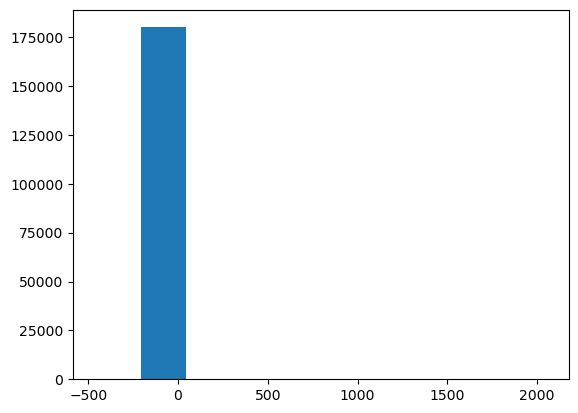

In [9]:
mean_diff_values =[item[1] for item in oxygen_adjusted_change]
plt.hist(mean_diff_values)
print('mean:' + str(np.mean(mean_diff_values)))
print('median: ' + str(np.median(mean_diff_values)))
print('min: ' + str(np.nanmin(mean_diff_values)) + ' max: ' + str(np.nanmax(mean_diff_values)))

remove?

In [11]:
# sensor types, numbers, adjusted vs not (1st attempt)

nitrate_float_count = 0
nitrate_profile_count = 0
nitrate_float_adjusted_count = 0
nitrate_profile_adjusted_count = 0

oxygen_float_count = 0
oxygen_profile_count = 0
oxygen_float_adjusted_count = 0
oxygen_profile_adjusted_count = 0.

oxygen_adjusted_change = []

pH_float_count = 0
pH_profile_count = 0
pH_float_adjusted_count = 0
pH_profile_adjusted_count = 0

first_n = 0
for n in tqdm(range(first_n, len(argolist))): #ange(last, len(argolist)):

    # print(f' {n}' ' File: ' + argolist[n]) 

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="invalid value encountered in cast")
        argo_n = xr.load_dataset(argo_path+argolist[n])
    var_list = list(argo_n.data_vars)
    #print(var_list)

    if n==first_n:
        min_float_dep_date = min(argo_n['JULD']).values
        max_float_dep_date = min(argo_n['JULD']).values
    else:   
        if min(argo_n['JULD']).values > max_float_dep_date:
            max_float_dep_date = min(argo_n['JULD']).values
        
        if min(argo_n['JULD']).values < min_float_dep_date:
            min_float_dep_date = min(argo_n['JULD']).values
      
            
    if "NITRATE" in var_list:
        nitrate_float_count = nitrate_float_count+1
        var_n = argo_n['NITRATE']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        nitrate_profile_count = nitrate_profile_count + len(var_n['N_PROF'])

        if "NITRATE_ADJUSTED" in var_list:
            nitrate_float_adjusted_count = nitrate_float_adjusted_count+1
            var_n = argo_n['NITRATE_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            nitrate_profile_adjusted_count = nitrate_profile_adjusted_count + len(var_n['N_PROF'])

        
    if "DOXY" in var_list:
        oxygen_float_count = oxygen_float_count+1
        var_n = argo_n['DOXY']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        oxygen_profile_count = oxygen_profile_count + len(var_n['N_PROF'])
        
        if "DOXY_ADJUSTED" in var_list:
            oxygen_float_adjusted_count = oxygen_float_adjusted_count+1
            var_n = argo_n['DOXY_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            oxygen_profile_adjusted_count = oxygen_profile_adjusted_count + len(var_n['N_PROF'])
        
            # look at impact of original oxygen adjustments
            doxy_diff = (argo_n['DOXY'] - argo_n['DOXY_ADJUSTED'])

            if ~np.isnan(doxy_diff).all():
                wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]
                
                doxy_mean = np.nanmean(doxy_diff)
                oxygen_adjusted_change.append((wmo_n, doxy_mean))
            
    if "PH_IN_SITU_TOTAL" in var_list:
        pH_float_count = pH_float_count+1
        var_n = argo_n['PH_IN_SITU_TOTAL']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        pH_profile_count = pH_profile_count + len(var_n['N_PROF'])
       
        if "PH_IN_SITU_TOTAL_ADJUSTED" in var_list:
            pH_float_adjusted_count = pH_float_adjusted_count+1
            var_n = argo_n['PH_IN_SITU_TOTAL_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            pH_profile_adjusted_count = pH_profile_adjusted_count + len(var_n['N_PROF'])
    
    
print('Nitrate Float Count ' + str(nitrate_float_count))
print('Nitrate Profile Count ' + str(nitrate_profile_count))

print('Nitrate Float ADJUSTED Count ' + str(nitrate_float_adjusted_count))
print('Nitrate Profile ADJUSTED Count ' + str(nitrate_profile_adjusted_count))

print('Oxygen Float Count ' + str(oxygen_float_count))
print('Oxygen Profile Count ' + str(oxygen_profile_count))
print('Oxygen Float ADJUSTED Count ' + str(oxygen_float_adjusted_count))
print('Oxygen Profile ADJUSTED Count ' + str(oxygen_profile_adjusted_count))

print('pH Float Count ' + str(pH_float_count))
print('pH Profile Count ' + str(pH_profile_count))
print('pH Float ADJUSTED Count ' + str(pH_float_adjusted_count))
print('pH Profile ADJUSTED Count ' + str(pH_profile_adjusted_count))

print('First deployment date: ' + str(min_float_dep_date))
print('Last deployment date: ' + str(max_float_dep_date))

  3%|▎         | 68/2162 [00:49<25:31,  1.37it/s]  


KeyboardInterrupt: 

mean:-12.322795
median: -10.997482
min: -229.63948 max: 136.58412


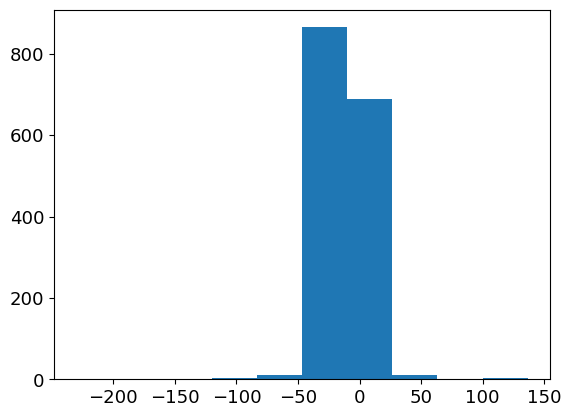

In [135]:
mean_diff_values =[item[1] for item in oxygen_adjusted_change]
plt.hist(mean_diff_values)
print('mean:' + str(np.mean(mean_diff_values)))
print('median: ' + str(np.median(mean_diff_values)))
print('min: ' + str(np.nanmin(mean_diff_values)) + ' max: ' + str(np.nanmax(mean_diff_values)))


Read in sprof and meta files to extract calibration and sensor information that I can then pair with floats/profiles 

### Figure 1 - get oxygen profiles and sensor type

In [90]:
# Step 1 - load float meta data, match sensor / cal type to wmo number and save out in "sensor_table"
import re

# want to load the sensor type (currently only have it per float mean, not attached to every profile)
# so that I have a record of what sensor type, what calibration approach (only focusing on air)
# for each profile. Then I can do area curves of number of oxygen profiles per year in different databases
# because I already am reading in calibration info in the cal_comment file, perhaps it makes sense to do this calculation there? I would like to have all plotting
# together in one file, but maybe not necessary
# Just do it here, no harm in multiple iterations of the same code (??)
# get list of argo meta files
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('meta.nc'):
        argolist.append(file)

print(len(argolist))

# make a list or list of lists w/ wmo and sensor model, then can match profiles to this 
# also need to get air cal info 
sensor_table = pd.DataFrame(columns=['wmo','o2_sensor_type'])
# temp_list = ['5904485_meta.nc']

air_cal_list = ['in air', 'in-air']
confusing_air_cal_list = ['no in air', 'no in-air']

for n, file in enumerate(tqdm(argolist)):
    wmo_n = int((re.search(r'\d+', file)).group())

    # load sensor information from meta file
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="invalid value encountered in cast")
        meta_n = xr.open_dataset(argo_path + file)
    
    # check whether the float has oxygen
    parameters_n = meta_n.PARAMETER.values
    contains_doxy = any(parameter.decode('utf-8').strip() == 'DOXY' for parameter in parameters_n)
    if contains_doxy is False:
        continue

    sensors = meta_n.SENSOR.values
    sind = [idx for idx, s in enumerate(sensors) if 'DOXY' in s.decode("utf-8")] 
    # #grab sensor model for index
    data_frame_n = []
    if len(sind):
        o2_sensor = meta_n.SENSOR_MODEL.values[sind[0]].decode("utf-8")
    else:
        o2_sensor = 'not listed'

    # load calibration information from Sprof file 
    try:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", message="invalid value encountered in cast")
            sprof_n = xr.open_dataset(argo_path + str(wmo_n) + '_Sprof.nc')
    except:
        print('problem loading sprof file: ' + str(wmo_n) + '_Sprof.nc')
        continue
    n_prof = sprof_n.dims['N_PROF']
    # gets order of sensors to extract calibration comments
    # some profiles might be missing sensor name (not sure why) so loop through looking
    o2_ind_all = np.full(n_prof, np.nan)
    # finds where o2 calibration comment is in each profile (at least for one float it changes from the first profile to the rest)
    for p in range(0, n_prof):
        cal_str = sprof_n.STATION_PARAMETERS.values.astype(str)[p]
        # print(cal_str)
        for i, param in enumerate(cal_str):
            if 'DOXY' in param:
                o2_ind_all[p] = i
                break
    o2_cal_full = []
    for idx, o2_ind in enumerate(o2_ind_all):
        if ~np.isnan(o2_ind):
            o2_cal_full.append(sprof_n.SCIENTIFIC_CALIB_COMMENT.values[idx,-1,np.int32(o2_ind)])

    data_comment_eq = pd.DataFrame({'o2_cal_full': o2_cal_full})
    # Drop duplicate comments
    unique_comments = data_comment_eq.drop_duplicates()
    # Create an empty list to store DataFrames
    data_frames = []
    # print(o2_cal_unique)
    # might have multiple unique comments, so save out each one:
    for i in unique_comments.index:
        o2_cal_i = unique_comments.o2_cal_full[i].decode("utf-8")

        # print(o2_cal_i)
        # save with wmo only for now
        new_data_cal_info = pd.DataFrame({'wmo': [wmo_n],
                                        'o2_cal_comment': [o2_cal_i]})
        # Append the new_data_cal_info DataFrame to the list
        data_frames.append(new_data_cal_info)

    cal_type = 'not_air'
    # assume if there are any air calibration comments for a float then I can label the entire float as "air_cal"
    for d in range(len(data_frames)):
        for air_str in air_cal_list:
            air_test = (data_frames[d].o2_cal_comment.str.contains(air_str))
            for conf_str in confusing_air_cal_list:
                confusing_test = (data_frames[d].o2_cal_comment.str.contains(conf_str))
            if air_test[0] and not confusing_test[0]:
                cal_type = 'air_cal'
                break

    # search data_frames o2_cal_comment to see if it is an air-calibrated float
    new_data_sensor_info = pd.DataFrame({'wmo': [wmo_n],
                                            'o2_sensor_type': [o2_sensor],
                                            'cal_type': [cal_type]})
            # Append the new_data_cal_info DataFrame to the list
    data_frame_n.append(new_data_sensor_info)

    sensor_table = pd.concat([sensor_table] + data_frame_n, ignore_index=True)
print(sensor_table)


2172


 16%|█▌        | 343/2172 [00:40<03:36,  8.46it/s]

problem loading sprof file: 6903081_Sprof.nc


 31%|███       | 677/2172 [01:18<01:56, 12.88it/s]

problem loading sprof file: 3902115_Sprof.nc


 38%|███▊      | 822/2172 [01:37<02:05, 10.79it/s]

problem loading sprof file: 7900586_Sprof.nc


 43%|████▎     | 943/2172 [01:52<01:58, 10.35it/s]

problem loading sprof file: 7900587_Sprof.nc


 45%|████▍     | 974/2172 [01:55<03:05,  6.46it/s]

problem loading sprof file: 6903873_Sprof.nc


 49%|████▉     | 1065/2172 [02:07<01:45, 10.52it/s]

problem loading sprof file: 3902104_Sprof.nc


 72%|███████▏  | 1554/2172 [03:04<01:06,  9.26it/s]

problem loading sprof file: 6903072_Sprof.nc


 88%|████████▊ | 1914/2172 [03:46<00:26,  9.58it/s]

problem loading sprof file: 6903071_Sprof.nc


 95%|█████████▌| 2074/2172 [04:05<00:07, 13.34it/s]

problem loading sprof file: 2902836_Sprof.nc


 98%|█████████▊| 2123/2172 [04:10<00:04, 10.52it/s]

problem loading sprof file: 6903035_Sprof.nc


100%|██████████| 2172/2172 [04:18<00:00,  8.41it/s]

          wmo                                     o2_sensor_type cal_type
0     4901216  SBE43I                                        ...  not_air
1     7901019  AANDERAA_OPTODE_4330                          ...  not_air
2     3902461  AANDERAA_OPTODE_4330                          ...  not_air
3     5904485  AANDERAA_OPTODE_4330                          ...  air_cal
4     6903878  AANDERAA_OPTODE_4330                          ...  not_air
...       ...                                                ...      ...
2151  5904848  AANDERAA_OPTODE_4330                          ...  air_cal
2152  3902608  AANDERAA_OPTODE_4330                          ...  not_air
2153  4900320  SBE43_IDO                                     ...  not_air
2154  6901490  AANDERAA_OPTODE_4330                          ...  not_air
2155  4902550  AANDERAA_OPTODE_4330                          ...  not_air

[2156 rows x 3 columns]


In [91]:
sensor_table['o2_sensor_type'] = sensor_table['o2_sensor_type'].str.strip()  # Remove leading/trailing spaces
sensor_table['o2_sensor_type'] = sensor_table['o2_sensor_type'].str.replace(r'\s+', ' ', regex=True)  # Remove extra whitespace

all_sensor_types = np.unique(sensor_table.o2_sensor_type)
for idx, type in enumerate(all_sensor_types):
    # print(str(idx))# + ' ' + type)
    print('Sensor: ' + type + ' num: ' + str(np.sum(sensor_table.o2_sensor_type==all_sensor_types[idx])))

    sum_air = np.sum(sensor_table.cal_type[sensor_table.o2_sensor_type==all_sensor_types[idx]]=='air_cal')
    sum_not_air = np.sum(sensor_table.cal_type[sensor_table.o2_sensor_type==all_sensor_types[idx]]=='not_air')
    print('num air: ' + str(sum_air) + ' num not air: ' + str(sum_not_air))


Sensor:  num: 1
num air: 0 num not air: 1
Sensor: 3830 num: 1
num air: 0 num not air: 1
Sensor: AANDERAA_OPTODE_3830 num: 299
num air: 26 num not air: 273
Sensor: AANDERAA_OPTODE_3835 num: 4
num air: 0 num not air: 4
Sensor: AANDERAA_OPTODE_4330 num: 1403
num air: 576 num not air: 827
Sensor: AANDERAA_OPTODE_4831 num: 3
num air: 0 num not air: 3
Sensor: AANDERRA_OPTODE_3830 num: 4
num air: 0 num not air: 4
Sensor: AROD_FT num: 10
num air: 0 num not air: 10
Sensor: ARO_FT num: 16
num air: 0 num not air: 16
Sensor: SBE43F_IDO num: 86
num air: 0 num not air: 86
Sensor: SBE43I num: 66
num air: 0 num not air: 66
Sensor: SBE43_IDO num: 16
num air: 0 num not air: 16
Sensor: SBE63_OPTODE num: 232
num air: 13 num not air: 219
Sensor: SBE83_OPTODE num: 15
num air: 10 num not air: 5


In [92]:
print('n Floats "not air" = ' + str(np.sum(sensor_table.cal_type=='not_air')))

print('n Floats "air" = ' + str(np.sum(sensor_table.cal_type=='air_cal')))


n Floats "not air" = 1531
n Floats "air" = 625


2. For each file, find all profiles with valid O2 data, save out lat/lon/date into an array


In [93]:
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('Sprof.nc'):
        argolist.append(file)

last = 0
print(len(argolist))

#wmo_list = list()
if 'argo_all' in locals():
    argo_all.close()
    
for n in range(0, len(argolist)):
    print(f' {n}' ' File: ' + argolist[n]) 

    #n = 0
    argo_n = xr.load_dataset(argo_path+argolist[n])
    argo_n = argo_n.set_coords(('PRES_ADJUSTED','LATITUDE','LONGITUDE','JULD'))
    
    var_list = list(argo_n.data_vars)
    
    if "DOXY_ADJUSTED" not in var_list:
        print('Skipping')
        continue
            
    doxy_trimmed = argo_n.DOXY_ADJUSTED.where(~np.isnan(argo_n.DOXY_ADJUSTED), drop=True)
    wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]

    prof_loc = xr.Dataset()
    prof_loc['wmo']=(['N_PROF'],np.repeat(wmo_n,len(doxy_trimmed)))

    prof_loc['LATITUDE'] = (['N_PROF'], doxy_trimmed.LATITUDE.data)
    prof_loc['LONGITUDE'] = (['N_PROF'], doxy_trimmed.LONGITUDE.data)
    prof_loc['juld'] = (['N_PROF'],doxy_trimmed.JULD.data)
    #prof_loc['profile'] = (['N_PROF'],doxy_trimmed.CYCLE_NUMBER.data)
    #argo_n
    # find o2 sensor type and add to prof_loc xarray
    sensor_type = pd.DataFrame({'sensor_type':[sensor_table.o2_sensor_type[sensor_table.wmo==wmo_n].values] * len(doxy_trimmed)})
    sensor_type_xarray = xr.DataArray(sensor_type['sensor_type'].values, dims='N_PROF', coords={'N_PROF': range(len(doxy_trimmed))})
    prof_loc['sensor_type'] = sensor_type_xarray
    # find o2 cal method and add to prof_loc xarray
    cal_type_df = pd.DataFrame({'cal_type':[sensor_table.cal_type[sensor_table.wmo==wmo_n].values] * len(doxy_trimmed)})
    cal_type_xarray = xr.DataArray(cal_type_df['cal_type'].values, dims='N_PROF', coords={'N_PROF': range(len(doxy_trimmed))})
    prof_loc['cal_type'] = cal_type_xarray
    # append all files into one long xarray

    if n == 0:
        argo_all = prof_loc
    else:
        argo_all = xr.concat([argo_all,prof_loc], 'N_PROF')

    # break
    last = n + 1
argo_all


2162
 0 File: 1901378_Sprof.nc
 1 File: 1901379_Sprof.nc
 2 File: 6902931_Sprof.nc
 3 File: 5901315_Sprof.nc
 4 File: 6901898_Sprof.nc
 5 File: 6901899_Sprof.nc
 6 File: 5901314_Sprof.nc
 7 File: 6903768_Sprof.nc
 8 File: 2900737_Sprof.nc
 9 File: 5904687_Sprof.nc
 10 File: 3900348_Sprof.nc
 11 File: 2900736_Sprof.nc
 12 File: 2903869_Sprof.nc
 13 File: 5904686_Sprof.nc
 14 File: 4903591_Sprof.nc
 15 File: 4901806_Sprof.nc
 16 File: 6901592_Sprof.nc
 17 File: 6903805_Sprof.nc
 18 File: 5905080_Sprof.nc
 19 File: 6903804_Sprof.nc
 20 File: 6901593_Sprof.nc
 21 File: 7902223_Sprof.nc
 22 File: 5906574_Sprof.nc
 23 File: 5904473_Sprof.nc
 24 File: 5904472_Sprof.nc
 25 File: 5906575_Sprof.nc
 26 File: 3900714_Sprof.nc
 27 File: 6901766_Sprof.nc
 28 File: 6901767_Sprof.nc
 29 File: 3900715_Sprof.nc
 30 File: 6903153_Sprof.nc
 31 File: 3902121_Sprof.nc
 32 File: 3902120_Sprof.nc
 33 File: 6903152_Sprof.nc
 34 File: 2903797_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 35 File: 4903499_Sprof.nc
 36 File: 5904127_Sprof.nc
 37 File: 5906246_Sprof.nc
 38 File: 4902437_Sprof.nc
 39 File: 5906020_Sprof.nc
 40 File: 5906021_Sprof.nc
 41 File: 4902650_Sprof.nc
 42 File: 5904126_Sprof.nc
 43 File: 5906247_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 44 File: 2901178_Sprof.nc
 45 File: 5906307_Sprof.nc
 46 File: 4902576_Sprof.nc
 47 File: 5902109_Sprof.nc
 48 File: 4902577_Sprof.nc
 49 File: 5906306_Sprof.nc
 50 File: 6903275_Sprof.nc
 51 File: 1902303_Sprof.nc
 52 File: 6901627_Sprof.nc
 53 File: 7902197_Sprof.nc
 54 File: 4903624_Sprof.nc
 55 File: 5907055_Sprof.nc
 56 File: 6902978_Sprof.nc
 57 File: 6901440_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 58 File: 7902196_Sprof.nc
 59 File: 5907054_Sprof.nc
 60 File: 4903625_Sprof.nc
 61 File: 6902979_Sprof.nc
 62 File: 1901157_Sprof.nc
 63 File: 5906435_Sprof.nc
 64 File: 5906434_Sprof.nc
 65 File: 1901156_Sprof.nc
 66 File: 7902105_Sprof.nc
 67 File: 5902267_Sprof.nc
 68 File: 3901669_Sprof.nc
 69 File: 2903176_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 70 File: 7902104_Sprof.nc
 71 File: 3901668_Sprof.nc
 72 File: 5902266_Sprof.nc
 73 File: 2903929_Sprof.nc
 74 File: 5900958_Sprof.nc
 75 File: 2903928_Sprof.nc
 76 File: 4900873_Sprof.nc
 77 File: 6902870_Sprof.nc
 78 File: 6902686_Sprof.nc
 79 File: 7901136_Sprof.nc
 80 File: 4900872_Sprof.nc
 81 File: 6902687_Sprof.nc
 82 File: 6902871_Sprof.nc
 83 File: 6903080_Sprof.nc
 84 File: 6900764_Sprof.nc
 85 File: 6902895_Sprof.nc
 86 File: 2903008_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 87 File: 6902894_Sprof.nc
 88 File: 4902990_Sprof.nc
 89 File: 2903009_Sprof.nc
 90 File: 6903065_Sprof.nc
 91 File: 6903203_Sprof.nc
 92 File: 2903856_Sprof.nc
 93 File: 1902374_Sprof.nc
 94 File: 1902621_Sprof.nc
 95 File: 6900499_Sprof.nc
 96 File: 6901437_Sprof.nc
 97 File: 5906442_Sprof.nc
 98 File: 5906624_Sprof.nc
 99 File: 1901347_Sprof.nc
 100 File: 5906443_Sprof.nc
 101 File: 4902409_Sprof.nc
 102 File: 1900943_Sprof.nc
 103 File: 5903887_Sprof.nc
 104 File: 6902807_Sprof.nc
 105 File: 5901045_Sprof.nc
 106 File: 6901758_Sprof.nc
 107 File: 4900494_Sprof.nc
 108 File: 6902806_Sprof.nc
 109 File: 5901044_Sprof.nc
 110 File: 6901759_Sprof.nc
 111 File: 2901553_Sprof.nc
 112 File: 2903454_Sprof.nc
 113 File: 2903455_Sprof.nc
 114 File: 2901552_Sprof.nc
 115 File: 6903578_Sprof.nc
 116 File: 2902175_Sprof.nc
 117 File: 5903264_Sprof.nc
 118 File: 6903579_Sprof.nc
 119 File: 2902174_Sprof.nc
 120 File: 7901001_Sprof.nc
 121 File: 5901450_Sprof.nc
 122 File: 5901451_Sprof.nc
 123 

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 151 File: 3902331_Sprof.nc
 152 File: 5906498_Sprof.nc
 153 File: 7900863_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 154 File: 6901022_Sprof.nc
 155 File: 5905531_Sprof.nc
 156 File: 4902626_Sprof.nc
 157 File: 6902544_Sprof.nc
 158 File: 5906230_Sprof.nc
 159 File: 4902627_Sprof.nc
 160 File: 6902545_Sprof.nc
 161 File: 3900531_Sprof.nc
 162 File: 4900879_Sprof.nc
 163 File: 1900652_Sprof.nc
 164 File: 5906537_Sprof.nc
 165 File: 6902024_Sprof.nc
 166 File: 5904657_Sprof.nc
 167 File: 5906536_Sprof.nc
 168 File: 6902025_Sprof.nc
 169 File: 4902612_Sprof.nc
 170 File: 5906205_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 171 File: 1901501_Sprof.nc
 172 File: 5906204_Sprof.nc
 173 File: 5904165_Sprof.nc
 174 File: 4902613_Sprof.nc
 175 File: 5905994_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 176 File: 5900952_Sprof.nc
 177 File: 4903273_Sprof.nc
 178 File: 5905505_Sprof.nc
 179 File: 5905995_Sprof.nc
 180 File: 4902680_Sprof.nc
 181 File: 5906297_Sprof.nc
 182 File: 6902972_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 183 File: 3901497_Sprof.nc
 184 File: 6900875_Sprof.nc
 185 File: 5902099_Sprof.nc
 186 File: 5906296_Sprof.nc
 187 File: 6900874_Sprof.nc
 188 File: 3901496_Sprof.nc
 189 File: 6902973_Sprof.nc
 190 File: 6903183_Sprof.nc
 191 File: 2903213_Sprof.nc
 192 File: 2903212_Sprof.nc
 193 File: 5901464_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 194 File: 2902885_Sprof.nc
 195 File: 5901465_Sprof.nc
 196 File: 2902884_Sprof.nc
 197 File: 2902732_Sprof.nc
 198 File: 3901082_Sprof.nc
 199 File: 5901743_Sprof.nc
 200 File: 3901083_Sprof.nc
 201 File: 2902733_Sprof.nc
 202 File: 5901742_Sprof.nc
 203 File: 6901490_Sprof.nc
 204 File: 1902686_Sprof.nc
 205 File: 2903353_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 206 File: 5904479_Sprof.nc
 207 File: 2903461_Sprof.nc
 208 File: 5904478_Sprof.nc
 209 File: 2901566_Sprof.nc
 210 File: 5901071_Sprof.nc
 211 File: 2903862_Sprof.nc
 212 File: 6903237_Sprof.nc
 213 File: 2903863_Sprof.nc
 214 File: 2902092_Sprof.nc
 215 File: 5904025_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 216 File: 5903382_Sprof.nc
 217 File: 2902093_Sprof.nc
 218 File: 5904024_Sprof.nc
 219 File: 5906476_Sprof.nc
 220 File: 5906477_Sprof.nc
 221 File: 5905111_Sprof.nc
 222 File: 5905377_Sprof.nc
 223 File: 5903218_Sprof.nc
 224 File: 5905376_Sprof.nc
 225 File: 5905110_Sprof.nc
 226 File: 5901178_Sprof.nc
 227 File: 5901734_Sprof.nc
 228 File: 6901029_Sprof.nc
 229 File: 5906493_Sprof.nc
 230 File: 5906492_Sprof.nc
 231 File: 5901735_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 232 File: 6901028_Sprof.nc
 233 File: 6903786_Sprof.nc
 234 File: 1902496_Sprof.nc
 235 File: 4901785_Sprof.nc
 236 File: 7901098_Sprof.nc
 237 File: 4901784_Sprof.nc
 238 File: 7901099_Sprof.nc
 239 File: 1902497_Sprof.nc
 240 File: 7900562_Sprof.nc
 241 File: 2903887_Sprof.nc
 242 File: 5906509_Sprof.nc
 243 File: 2902829_Sprof.nc
 244 File: 2903670_Sprof.nc
 245 File: 5906508_Sprof.nc
 246 File: 2903886_Sprof.nc
 247 File: 7900563_Sprof.nc
 248 File: 2902211_Sprof.nc
 249 File: 7901102_Sprof.nc
 250 File: 7901103_Sprof.nc
 251 File: 2902210_Sprof.nc
 252 File: 6903240_Sprof.nc
 253 File: 6903026_Sprof.nc
 254 File: 3900334_Sprof.nc
 255 File: 6903878_Sprof.nc
 256 File: 3901067_Sprof.nc
 257 File: 5904761_Sprof.nc
 258 File: 3901066_Sprof.nc
 259 File: 6903572_Sprof.nc
 260 File: 3902500_Sprof.nc
 261 File: 1902662_Sprof.nc
 262 File: 6901474_Sprof.nc
 263 File: 5901369_Sprof.nc
 264 File: 6903573_Sprof.nc
 265 File: 1902663_Sprof.nc
 266 File: 5905167_Sprof.nc
 267 File: 4903751_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 306 File: 5904179_Sprof.nc
 307 File: 5906219_Sprof.nc
 308 File: 2901755_Sprof.nc
 309 File: 2903652_Sprof.nc
 310 File: 2903653_Sprof.nc
 311 File: 6903096_Sprof.nc
 312 File: 6990528_Sprof.nc
 313 File: 6900796_Sprof.nc
 314 File: 6900797_Sprof.nc
 315 File: 7900943_Sprof.nc
 316 File: 6903263_Sprof.nc
 317 File: 5903718_Sprof.nc
 318 File: 5903719_Sprof.nc
 319 File: 6903262_Sprof.nc
 320 File: 5906310_Sprof.nc
 321 File: 5906311_Sprof.nc
 322 File: 5906645_Sprof.nc
 323 File: 6903551_Sprof.nc
 324 File: 2903394_Sprof.nc
 325 File: 6902799_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 326 File: 6900868_Sprof.nc
 327 File: 6901457_Sprof.nc
 328 File: 6903550_Sprof.nc
 329 File: 2903395_Sprof.nc
 330 File: 6901631_Sprof.nc
 331 File: 7901028_Sprof.nc
 332 File: 6900869_Sprof.nc
 333 File: 6902798_Sprof.nc
 334 File: 3902462_Sprof.nc
 335 File: 6901771_Sprof.nc
 336 File: 6901770_Sprof.nc
 337 File: 3902463_Sprof.nc
 338 File: 5904602_Sprof.nc
 339 File: 5906563_Sprof.nc
 340 File: 5904464_Sprof.nc
 341 File: 5904465_Sprof.nc
 342 File: 5906562_Sprof.nc
 343 File: 6902742_Sprof.nc
 344 File: 6902743_Sprof.nc
 345 File: 5906036_Sprof.nc
 346 File: 5906250_Sprof.nc
 347 File: 5906868_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 348 File: 2902115_Sprof.nc
 349 File: 2902114_Sprof.nc
 350 File: 5901165_Sprof.nc
 351 File: 5905096_Sprof.nc
 352 File: 6901585_Sprof.nc
 353 File: 3900791_Sprof.nc
 354 File: 4903587_Sprof.nc
 355 File: 5905097_Sprof.nc
 356 File: 6901584_Sprof.nc
 357 File: 2902441_Sprof.nc
 358 File: 3902258_Sprof.nc
 359 File: 5904690_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 360 File: 2902440_Sprof.nc
 361 File: 3902259_Sprof.nc
 362 File: 5904691_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 363 File: 6990516_Sprof.nc
 364 File: 5905073_Sprof.nc
 365 File: 5905072_Sprof.nc
 366 File: 5904675_Sprof.nc
 367 File: 1901210_Sprof.nc
 368 File: 5906514_Sprof.nc
 369 File: 2902834_Sprof.nc
 370 File: 1901211_Sprof.nc
 371 File: 5904674_Sprof.nc
 372 File: 5906515_Sprof.nc
 373 File: 5904882_Sprof.nc
 374 File: 2902835_Sprof.nc
 375 File: 4902631_Sprof.nc
 376 File: 5906040_Sprof.nc
 377 File: 5906226_Sprof.nc
 378 File: 5904147_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 379 File: 6900632_Sprof.nc
 380 File: 6902735_Sprof.nc
 381 File: 5906227_Sprof.nc
 382 File: 5904146_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 383 File: 5906041_Sprof.nc
 384 File: 4902630_Sprof.nc
 385 File: 6902734_Sprof.nc
 386 File: 7900875_Sprof.nc
 387 File: 2902758_Sprof.nc
 388 File: 7900874_Sprof.nc
 389 File: 5903272_Sprof.nc
 390 File: 6901468_Sprof.nc
 391 File: 6903708_Sprof.nc
 392 File: 6990584_Sprof.nc
 393 File: 4903797_Sprof.nc
 394 File: 6990585_Sprof.nc
 395 File: 7900344_Sprof.nc
 396 File: 5904481_Sprof.nc
 397 File: 5901447_Sprof.nc
 398 File: 2902436_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 399 File: 5901446_Sprof.nc
 400 File: 2902437_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 401 File: 2900616_Sprof.nc
 402 File: 5903891_Sprof.nc
 403 File: 5903890_Sprof.nc
 404 File: 4902678_Sprof.nc
 405 File: 5906008_Sprof.nc
 406 File: 4902679_Sprof.nc
 407 File: 6903286_Sprof.nc
 408 File: 2900124_Sprof.nc
 409 File: 6902810_Sprof.nc
 410 File: 2902245_Sprof.nc
 411 File: 4902584_Sprof.nc
 412 File: 5904094_Sprof.nc
 413 File: 4900483_Sprof.nc
 414 File: 5901052_Sprof.nc
 415 File: 2900125_Sprof.nc
 416 File: 6902811_Sprof.nc
 417 File: 2902244_Sprof.nc
 418 File: 4900482_Sprof.nc
 419 File: 5901053_Sprof.nc
 420 File: 4902585_Sprof.nc
 421 File: 6901528_Sprof.nc
 422 File: 5904095_Sprof.nc
 423 File: 6901175_Sprof.nc
 424 File: 5904858_Sprof.nc
 425 File: 4901216_Sprof.nc
 426 File: 6901174_Sprof.nc
 427 File: 5904859_Sprof.nc
 428 File: 6902882_Sprof.nc
 429 File: 4900881_Sprof.nc
 430 File: 6902883_Sprof.nc
 431 File: 4900880_Sprof.nc
 432 File: 5905132_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 433 File: 5902295_Sprof.nc
 434 File: 3902554_Sprof.nc
 435 File: 1902637_Sprof.nc
 436 File: 5905133_Sprof.nc
 437 File: 6901646_Sprof.nc
 438 File: 5904032_Sprof.nc
 439 File: 6903818_Sprof.nc
 440 File: 5904033_Sprof.nc
 441 File: 4901045_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 442 File: 5905634_Sprof.nc
 443 File: 6904187_Sprof.nc
 444 File: 5905635_Sprof.nc
 445 File: 2903874_Sprof.nc
 446 File: 7900591_Sprof.nc
 447 File: 6904186_Sprof.nc
 448 File: 5905106_Sprof.nc
 449 File: 1902602_Sprof.nc
 450 File: 5905107_Sprof.nc
 451 File: 1902603_Sprof.nc
 452 File: 1901365_Sprof.nc
 453 File: 1901364_Sprof.nc
 454 File: 5905194_Sprof.nc
 455 File: 6901487_Sprof.nc
 456 File: 6903580_Sprof.nc
 457 File: 5907092_Sprof.nc
 458 File: 4903485_Sprof.nc
 459 File: 6903581_Sprof.nc
 460 File: 6901486_Sprof.nc
 461 File: 2902271_Sprof.nc
 462 File: 2902270_Sprof.nc
 463 File: 5907108_Sprof.nc
 464 File: 6904115_Sprof.nc
 465 File: 5906569_Sprof.nc
 466 File: 5906568_Sprof.nc
 467 File: 6904114_Sprof.nc
 468 File: 6902965_Sprof.nc
 469 File: 2902156_Sprof.nc
 470 File: 7901023_Sprof.nc
 471 File: 6902964_Sprof.nc
 472 File: 5903712_Sprof.nc
 473 File: 5903713_Sprof.nc
 474 File: 6903268_Sprof.nc
 475 File: 5906520_Sprof.nc
 476 File: 5906521_Sprof.nc
 477 File: 2902238_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 486 File: 7902119_Sprof.nc
 487 File: 6902700_Sprof.nc
 488 File: 5905138_Sprof.nc
 489 File: 5901336_Sprof.nc
 490 File: 2902120_Sprof.nc
 491 File: 5905139_Sprof.nc
 492 File: 5901337_Sprof.nc
 493 File: 1902368_Sprof.nc
 494 File: 5904852_Sprof.nc
 495 File: 1902369_Sprof.nc
 496 File: 5904853_Sprof.nc
 497 File: 6902888_Sprof.nc
 498 File: 5902305_Sprof.nc
 499 File: 6903826_Sprof.nc
 500 File: 5902304_Sprof.nc
 501 File: 6902889_Sprof.nc
 502 File: 7902200_Sprof.nc
 503 File: 2903014_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 504 File: 1901468_Sprof.nc
 505 File: 2900786_Sprof.nc
 506 File: 5906557_Sprof.nc
 507 File: 2900787_Sprof.nc
 508 File: 5906556_Sprof.nc
 509 File: 5905030_Sprof.nc
 510 File: 6901523_Sprof.nc
 511 File: 4903747_Sprof.nc
 512 File: 6901522_Sprof.nc
 513 File: 6902980_Sprof.nc
 514 File: 5904104_Sprof.nc
 515 File: 4902414_Sprof.nc
 516 File: 5906003_Sprof.nc
 517 File: 6902981_Sprof.nc
 518 File: 5906002_Sprof.nc
 519 File: 5904105_Sprof.nc
 520 File: 5904223_Sprof.nc
 521 File: 4902555_Sprof.nc
 522 File: 6903699_Sprof.nc
 523 File: 2902294_Sprof.nc
 524 File: 4902554_Sprof.nc
 525 File: 2902295_Sprof.nc
 526 File: 6903031_Sprof.nc
 527 File: 6903030_Sprof.nc
 528 File: 6901604_Sprof.nc
 529 File: 6901462_Sprof.nc
 530 File: 6901463_Sprof.nc
 531 File: 5904981_Sprof.nc
 532 File: 5904980_Sprof.nc
 533 File: 5906484_Sprof.nc
 534 File: 5906485_Sprof.nc
 535 File: 2902753_Sprof.nc
 536 File: 6900954_Sprof.nc
 537 File: 5905079_Sprof.nc
 538 File: 5905078_Sprof.nc
 539 File: 2903666_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 543 File: 5900841_Sprof.nc
 544 File: 2900999_Sprof.nc
 545 File: 5906317_Sprof.nc
 546 File: 4900607_Sprof.nc
 547 File: 2903209_Sprof.nc
 548 File: 5906316_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 549 File: 2903393_Sprof.nc
 550 File: 6903556_Sprof.nc
 551 File: 5905142_Sprof.nc
 552 File: 1902646_Sprof.nc
 553 File: 4903634_Sprof.nc
 554 File: 2903392_Sprof.nc
 555 File: 6903557_Sprof.nc
 556 File: 6902969_Sprof.nc
 557 File: 5903616_Sprof.nc
 558 File: 2903167_Sprof.nc
 559 File: 2903166_Sprof.nc
 560 File: 6903090_Sprof.nc
 561 File: 2903655_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 562 File: 1902380_Sprof.nc
 563 File: 6903091_Sprof.nc
 564 File: 2903654_Sprof.nc
 565 File: 1902381_Sprof.nc
 566 File: 6900791_Sprof.nc
 567 File: 6901888_Sprof.nc
 568 File: 2902113_Sprof.nc
 569 File: 2902088_Sprof.nc
 570 File: 5905091_Sprof.nc
 571 File: 6901582_Sprof.nc
 572 File: 6901583_Sprof.nc
 573 File: 2902446_Sprof.nc
 574 File: 2900727_Sprof.nc
 575 File: 2900541_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 576 File: 5905639_Sprof.nc
 577 File: 2903878_Sprof.nc
 578 File: 2900540_Sprof.nc
 579 File: 5905638_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 580 File: 2902447_Sprof.nc
 581 File: 4902386_Sprof.nc
 582 File: 5904860_Sprof.nc
 583 File: 6902829_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 584 File: 6901776_Sprof.nc
 585 File: 6901510_Sprof.nc
 586 File: 3902465_Sprof.nc
 587 File: 6902828_Sprof.nc
 588 File: 4903774_Sprof.nc
 589 File: 3902464_Sprof.nc
 590 File: 5906564_Sprof.nc
 591 File: 6904118_Sprof.nc
 592 File: 5906565_Sprof.nc
 593 File: 6900642_Sprof.nc
 594 File: 4903489_Sprof.nc
 595 File: 5905199_Sprof.nc
 596 File: 4902641_Sprof.nc
 597 File: 5906030_Sprof.nc
 598 File: 4903488_Sprof.nc
 599 File: 4903818_Sprof.nc
 600 File: 5905198_Sprof.nc
 601 File: 6900643_Sprof.nc
 602 File: 5906031_Sprof.nc
 603 File: 4902640_Sprof.nc
 604 File: 5905557_Sprof.nc
 605 File: 4901140_Sprof.nc
 606 File: 2900449_Sprof.nc
 607 File: 3902131_Sprof.nc
 608 File: 4901141_Sprof.nc
 609 File: 2900448_Sprof.nc
 610 File: 5905556_Sprof.nc
 611 File: 2903787_Sprof.nc
 612 File: 3902130_Sprof.nc
 613 File: 5901372_Sprof.nc
 614 File: 6903568_Sprof.nc
 615 File: 6902956_Sprof.nc
 616 File: 5903274_Sprof.nc
 617 File: 6903569_Sprof.nc
 618 File: 5901373_Sprof.nc
 619 File: 6902957_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 629 File: 5904487_Sprof.nc
 630 File: 5903720_Sprof.nc
 631 File: 5906580_Sprof.nc
 632 File: 3900515_Sprof.nc
 633 File: 5905074_Sprof.nc
 634 File: 5905075_Sprof.nc
 635 File: 5906513_Sprof.nc
 636 File: 5904672_Sprof.nc
 637 File: 1901217_Sprof.nc
 638 File: 2902833_Sprof.nc
 639 File: 7900579_Sprof.nc
 640 File: 5906512_Sprof.nc
 641 File: 5904673_Sprof.nc
 642 File: 2902832_Sprof.nc
 643 File: 5906221_Sprof.nc
 644 File: 4902636_Sprof.nc
 645 File: 5906046_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 646 File: 5901187_Sprof.nc
 647 File: 4902637_Sprof.nc
 648 File: 5906220_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 649 File: 3902589_Sprof.nc
 650 File: 6902733_Sprof.nc
 651 File: 5906489_Sprof.nc
 652 File: 5903629_Sprof.nc
 653 File: 4901137_Sprof.nc
 654 File: 6901032_Sprof.nc
 655 File: 5906488_Sprof.nc
 656 File: 4901136_Sprof.nc
 657 File: 3902007_Sprof.nc
 658 File: 3902261_Sprof.nc
 659 File: 3902260_Sprof.nc
 660 File: 3902006_Sprof.nc
 661 File: 5902308_Sprof.nc
 662 File: 6902885_Sprof.nc
 663 File: 6902884_Sprof.nc
 664 File: 5906635_Sprof.nc
 665 File: 4903643_Sprof.nc
 666 File: 1902457_Sprof.nc
 667 File: 5905135_Sprof.nc
 668 File: 6990636_Sprof.nc
 669 File: 5905134_Sprof.nc
 670 File: 1902456_Sprof.nc
 671 File: 5903660_Sprof.nc
 672 File: 2900610_Sprof.nc
 673 File: 5905568_Sprof.nc
 674 File: 5904108_Sprof.nc
 675 File: 4901283_Sprof.nc
 676 File: 2902242_Sprof.nc
 677 File: 2900123_Sprof.nc
 678 File: 6901748_Sprof.nc
 679 File: 4900484_Sprof.nc
 680 File: 5904093_Sprof.nc
 681 File: 4902583_Sprof.nc
 682 File: 6902816_Sprof.nc
 683 File: 2902243_Sprof.nc
 684 File: 5904092_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 722 File: 5906526_Sprof.nc
 723 File: 3900521_Sprof.nc
 724 File: 4900869_Sprof.nc
 725 File: 5905984_Sprof.nc
 726 File: 5905985_Sprof.nc
 727 File: 5906215_Sprof.nc
 728 File: 4902602_Sprof.nc
 729 File: 5906214_Sprof.nc
 730 File: 3900281_Sprof.nc
 731 File: 6904235_Sprof.nc
 732 File: 4903458_Sprof.nc
 733 File: 6902962_Sprof.nc
 734 File: 6902963_Sprof.nc
 735 File: 4903459_Sprof.nc
 736 File: 5903714_Sprof.nc
 737 File: 2900765_Sprof.nc
 738 File: 2900993_Sprof.nc
 739 File: 5902113_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 740 File: 5902112_Sprof.nc
 741 File: 5906550_Sprof.nc
 742 File: 5901491_Sprof.nc
 743 File: 5906551_Sprof.nc
 744 File: 2900129_Sprof.nc
 745 File: 4902589_Sprof.nc
 746 File: 3900730_Sprof.nc
 747 File: 2900128_Sprof.nc
 748 File: 4903740_Sprof.nc
 749 File: 4902588_Sprof.nc
 750 File: 5906004_Sprof.nc
 751 File: 4902675_Sprof.nc
 752 File: 4902674_Sprof.nc
 753 File: 5906005_Sprof.nc
 754 File: 5902298_Sprof.nc
 755 File: 4902481_Sprof.nc
 756 File: 3902559_Sprof.nc
 757 File: 5902299_Sprof.nc
 758 File: 4902480_Sprof.nc
 759 File: 5904855_Sprof.nc
 760 File: 5904854_Sprof.nc
 761 File: 5902302_Sprof.nc
 762 File: 2903012_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 763 File: 5902303_Sprof.nc
 764 File: 2903013_Sprof.nc
 765 File: 7902121_Sprof.nc
 766 File: 6902738_Sprof.nc
 767 File: 5905382_Sprof.nc
 768 File: 6901866_Sprof.nc
 769 File: 5905383_Sprof.nc
 770 File: 6902739_Sprof.nc
 771 File: 5900345_Sprof.nc
 772 File: 5906483_Sprof.nc
 773 File: 7900878_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 774 File: 2902755_Sprof.nc
 775 File: 5906482_Sprof.nc
 776 File: 2902754_Sprof.nc
 777 File: 5903377_Sprof.nc
 778 File: 6900953_Sprof.nc
 779 File: 5905218_Sprof.nc
 780 File: 4900856_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 781 File: 7901113_Sprof.nc
 782 File: 5904678_Sprof.nc
 783 File: 5906519_Sprof.nc
 784 File: 5904679_Sprof.nc
 785 File: 5906518_Sprof.nc
 786 File: 4902552_Sprof.nc
 787 File: 6990588_Sprof.nc
 788 File: 6903869_Sprof.nc
 789 File: 4902553_Sprof.nc
 790 File: 6903036_Sprof.nc
 791 File: 6903250_Sprof.nc
 792 File: 6901465_Sprof.nc
 793 File: 6903704_Sprof.nc
 794 File: 6901603_Sprof.nc
 795 File: 4901707_Sprof.nc
 796 File: 5907071_Sprof.nc
 797 File: 6901602_Sprof.nc
 798 File: 6901464_Sprof.nc
 799 File: 5904770_Sprof.nc
 800 File: 3901077_Sprof.nc
 801 File: 3901076_Sprof.nc
 802 File: 5904474_Sprof.nc
 803 File: 5906573_Sprof.nc
 804 File: 5906572_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 805 File: 5904475_Sprof.nc
 806 File: 3902472_Sprof.nc
 807 File: 3900713_Sprof.nc
 808 File: 4903763_Sprof.nc
 809 File: 6901760_Sprof.nc
 810 File: 3902126_Sprof.nc
 811 File: 6901235_Sprof.nc
 812 File: 5903649_Sprof.nc
 813 File: 3902340_Sprof.nc
 814 File: 3902341_Sprof.nc
 815 File: 3902127_Sprof.nc
 816 File: 5906027_Sprof.nc
 817 File: 2902196_Sprof.nc
 818 File: 5907088_Sprof.nc
 819 File: 5906026_Sprof.nc
 820 File: 7900881_Sprof.nc
 821 File: 6902936_Sprof.nc
 822 File: 6902937_Sprof.nc
 823 File: 5901313_Sprof.nc
 824 File: 2900730_Sprof.nc
 825 File: 5901646_Sprof.nc
 826 File: 4902390_Sprof.nc
 827 File: 5904680_Sprof.nc
 828 File: 5903741_Sprof.nc
 829 File: 5906971_Sprof.nc
 830 File: 2900731_Sprof.nc
 831 File: 2902450_Sprof.nc
 832 File: 5906970_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 833 File: 5901647_Sprof.nc
 834 File: 4901801_Sprof.nc
 835 File: 6903802_Sprof.nc
 836 File: 6901595_Sprof.nc
 837 File: 5904028_Sprof.nc
 838 File: 5904029_Sprof.nc
 839 File: 6903803_Sprof.nc
 840 File: 5906208_Sprof.nc
 841 File: 2901211_Sprof.nc
 842 File: 2903170_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 843 File: 7902102_Sprof.nc
 844 File: 7902103_Sprof.nc
 845 File: 2901210_Sprof.nc
 846 File: 5906209_Sprof.nc
 847 File: 5904168_Sprof.nc
 848 File: 2903171_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 849 File: 5902261_Sprof.nc
 850 File: 5905998_Sprof.nc
 851 File: 2900886_Sprof.nc
 852 File: 4900874_Sprof.nc
 853 File: 6990538_Sprof.nc
 854 File: 6902877_Sprof.nc
 855 File: 6902876_Sprof.nc
 856 File: 6902680_Sprof.nc
 857 File: 6901180_Sprof.nc
 858 File: 6900348_Sprof.nc
 859 File: 2901744_Sprof.nc
 860 File: 6901181_Sprof.nc
 861 File: 6903086_Sprof.nc
 862 File: 6902028_Sprof.nc
 863 File: 4900610_Sprof.nc
 864 File: 5906300_Sprof.nc
 865 File: 4900476_Sprof.nc
 866 File: 4900477_Sprof.nc
 867 File: 4900611_Sprof.nc
 868 File: 5906301_Sprof.nc
 869 File: 6903273_Sprof.nc
 870 File: 5901468_Sprof.nc
 871 File: 1902304_Sprof.nc
 872 File: 3902533_Sprof.nc
 873 File: 7902190_Sprof.nc
 874 File: 1902651_Sprof.nc
 875 File: 5907052_Sprof.nc
 876 File: 7902191_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 877 File: 4903622_Sprof.nc
 878 File: 1902650_Sprof.nc
 879 File: 2902912_Sprof.nc
 880 File: 4900345_Sprof.nc
 881 File: 5906019_Sprof.nc
 882 File: 5906018_Sprof.nc
 883 File: 2900606_Sprof.nc
 884 File: 2900460_Sprof.nc
 885 File: 2902701_Sprof.nc
 886 File: 3902118_Sprof.nc
 887 File: 5903677_Sprof.nc
 888 File: 2900607_Sprof.nc
 889 File: 3902119_Sprof.nc
 890 File: 6902800_Sprof.nc
 891 File: 5901042_Sprof.nc
 892 File: 6902801_Sprof.nc
 893 File: 5901043_Sprof.nc
 894 File: 5900422_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 895 File: 2903453_Sprof.nc
 896 File: 2901554_Sprof.nc
 897 File: 2901555_Sprof.nc
 898 File: 6902892_Sprof.nc
 899 File: 6902893_Sprof.nc
 900 File: 6903204_Sprof.nc
 901 File: 3902010_Sprof.nc
 902 File: 5904848_Sprof.nc
 903 File: 5904849_Sprof.nc
 904 File: 3902011_Sprof.nc
 905 File: 6902908_Sprof.nc
 906 File: 6901657_Sprof.nc
 907 File: 6902909_Sprof.nc
 908 File: 6901656_Sprof.nc
 909 File: 5906623_Sprof.nc
 910 File: 5906445_Sprof.nc
 911 File: 5906444_Sprof.nc
 912 File: 5904665_Sprof.nc
 913 File: 5906994_Sprof.nc
 914 File: 5904664_Sprof.nc
 915 File: 2902825_Sprof.nc
 916 File: 1902501_Sprof.nc
 917 File: 4903714_Sprof.nc
 918 File: 1902500_Sprof.nc
 919 File: 5905062_Sprof.nc
 920 File: 5901739_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 921 File: 5904599_Sprof.nc
 922 File: 6901024_Sprof.nc
 923 File: 5900961_Sprof.nc
 924 File: 5901738_Sprof.nc
 925 File: 5904598_Sprof.nc
 926 File: 6901025_Sprof.nc
 927 File: 4903026_Sprof.nc
 928 File: 5906236_Sprof.nc
 929 File: 7901095_Sprof.nc
 930 File: 2903329_Sprof.nc
 931 File: 4902620_Sprof.nc
 932 File: 5906237_Sprof.nc
 933 File: 7900466_Sprof.nc
 934 File: 7901007_Sprof.nc
 935 File: 7901006_Sprof.nc
 936 File: 5901457_Sprof.nc
 937 File: 5906596_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 938 File: 5901456_Sprof.nc
 939 File: 5906597_Sprof.nc
 940 File: 7900133_Sprof.nc
 941 File: 6903875_Sprof.nc
 942 File: 1902593_Sprof.nc
 943 File: 6990595_Sprof.nc
 944 File: 7900354_Sprof.nc
 945 File: 6903874_Sprof.nc
 946 File: 7900132_Sprof.nc
 947 File: 5904397_Sprof.nc
 948 File: 5903256_Sprof.nc
 949 File: 4902687_Sprof.nc
 950 File: 6900872_Sprof.nc
 951 File: 5907058_Sprof.nc
 952 File: 6902975_Sprof.nc
 953 File: 5904396_Sprof.nc
 954 File: 5903257_Sprof.nc
 955 File: 4902686_Sprof.nc
 956 File: 6902974_Sprof.nc
 957 File: 6900873_Sprof.nc
 958 File: 5906438_Sprof.nc
 959 File: 5906439_Sprof.nc
 960 File: 1901668_Sprof.nc
 961 File: 5902105_Sprof.nc
 962 File: 5901463_Sprof.nc
 963 File: 2902882_Sprof.nc
 964 File: 5901462_Sprof.nc
 965 File: 2902883_Sprof.nc
 966 File: 2900514_Sprof.nc
 967 File: 5906530_Sprof.nc
 968 File: 2903648_Sprof.nc
 969 File: 5901697_Sprof.nc
 970 File: 2900917_Sprof.nc
 971 File: 5901696_Sprof.nc
 972 File: 2901528_Sprof.nc
 973 File: 5906531_S

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 982 File: 5905992_Sprof.nc
 983 File: 4903274_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 984 File: 5905442_Sprof.nc
 985 File: 7900580_Sprof.nc
 986 File: 2903865_Sprof.nc
 987 File: 6901151_Sprof.nc
 988 File: 3900345_Sprof.nc
 989 File: 2903864_Sprof.nc
 990 File: 3900344_Sprof.nc
 991 File: 6900531_Sprof.nc
 992 File: 5903385_Sprof.nc
 993 File: 5906343_Sprof.nc
 994 File: 6900530_Sprof.nc
 995 File: 5906342_Sprof.nc
 996 File: 4900652_Sprof.nc
 997 File: 5906471_Sprof.nc
 998 File: 5906470_Sprof.nc
 999 File: 4903660_Sprof.nc
 1000 File: 5905370_Sprof.nc
 1001 File: 6901895_Sprof.nc
 1002 File: 4903661_Sprof.nc
 1003 File: 5905371_Sprof.nc
 1004 File: 6903765_Sprof.nc
 1005 File: 2902735_Sprof.nc
 1006 File: 5901744_Sprof.nc
 1007 File: 3901084_Sprof.nc
 1008 File: 2902734_Sprof.nc
 1009 File: 6903590_Sprof.nc
 1010 File: 1902681_Sprof.nc
 1011 File: 6901496_Sprof.nc
 1012 File: 6903591_Sprof.nc
 1013 File: 2903354_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1014 File: 2903467_Sprof.nc
 1015 File: 5906579_Sprof.nc
 1016 File: 2901560_Sprof.nc
 1017 File: 2901561_Sprof.nc
 1018 File: 5906578_Sprof.nc
 1019 File: 2903466_Sprof.nc
 1020 File: 3900718_Sprof.nc
 1021 File: 6903247_Sprof.nc
 1022 File: 7900967_Sprof.nc
 1023 File: 6903246_Sprof.nc
 1024 File: 3900333_Sprof.nc
 1025 File: 5904767_Sprof.nc
 1026 File: 5906661_Sprof.nc
 1027 File: 5904766_Sprof.nc
 1028 File: 6990662_Sprof.nc
 1029 File: 6901472_Sprof.nc
 1030 File: 6903575_Sprof.nc
 1031 File: 2902178_Sprof.nc
 1032 File: 6903574_Sprof.nc
 1033 File: 6990663_Sprof.nc
 1034 File: 3902506_Sprof.nc
 1035 File: 6901473_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1036 File: 2902179_Sprof.nc
 1037 File: 5906494_Sprof.nc
 1038 File: 5901733_Sprof.nc
 1039 File: 5906495_Sprof.nc
 1040 File: 6903781_Sprof.nc
 1041 File: 2901043_Sprof.nc
 1042 File: 4901782_Sprof.nc
 1043 File: 5905395_Sprof.nc
 1044 File: 6900628_Sprof.nc
 1045 File: 6902549_Sprof.nc
 1046 File: 1902491_Sprof.nc
 1047 File: 2901042_Sprof.nc
 1048 File: 6900629_Sprof.nc
 1049 File: 1902490_Sprof.nc
 1050 File: 6902548_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1051 File: 2903881_Sprof.nc
 1052 File: 6900944_Sprof.nc
 1053 File: 5905069_Sprof.nc
 1054 File: 2902216_Sprof.nc
 1055 File: 2902217_Sprof.nc
 1056 File: 5905068_Sprof.nc
 1057 File: 2902131_Sprof.nc
 1058 File: 5904186_Sprof.nc
 1059 File: 2902130_Sprof.nc
 1060 File: 6900804_Sprof.nc
 1061 File: 6902903_Sprof.nc
 1062 File: 5904187_Sprof.nc
 1063 File: 5905976_Sprof.nc
 1064 File: 5905977_Sprof.nc
 1065 File: 5904842_Sprof.nc
 1066 File: 6903068_Sprof.nc
 1067 File: 6903069_Sprof.nc
 1068 File: 5904843_Sprof.nc
 1069 File: 4903756_Sprof.nc
 1070 File: 5901048_Sprof.nc
 1071 File: 6901755_Sprof.nc
 1072 File: 3900727_Sprof.nc
 1073 File: 4903757_Sprof.nc
 1074 File: 5907126_Sprof.nc
 1075 File: 5901049_Sprof.nc
 1076 File: 6901754_Sprof.nc
 1077 File: 2903459_Sprof.nc
 1078 File: 5906547_Sprof.nc
 1079 File: 2900961_Sprof.nc
 1080 File: 5906546_Sprof.nc
 1081 File: 2903458_Sprof.nc
 1082 File: 4902662_Sprof.nc
 1083 File: 6900896_Sprof.nc
 1084 File: 4902663_Sprof.nc
 1085 File: 79

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1087 File: 3902113_Sprof.nc
 1088 File: 6903777_Sprof.nc
 1089 File: 6901886_Sprof.nc
 1090 File: 5905105_Sprof.nc
 1091 File: 1902601_Sprof.nc
 1092 File: 4903672_Sprof.nc
 1093 File: 5905104_Sprof.nc
 1094 File: 5904031_Sprof.nc
 1095 File: 2902086_Sprof.nc
 1096 File: 5904030_Sprof.nc
 1097 File: 2902087_Sprof.nc
 1098 File: 6904184_Sprof.nc
 1099 File: 7900593_Sprof.nc
 1100 File: 5905637_Sprof.nc
 1101 File: 2902448_Sprof.nc
 1102 File: 7900592_Sprof.nc
 1103 File: 6903222_Sprof.nc
 1104 File: 5906969_Sprof.nc
 1105 File: 6904185_Sprof.nc
 1106 File: 2902449_Sprof.nc
 1107 File: 2900728_Sprof.nc
 1108 File: 5905636_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1109 File: 2902272_Sprof.nc
 1110 File: 2902273_Sprof.nc
 1111 File: 6904116_Sprof.nc
 1112 File: 2903474_Sprof.nc
 1113 File: 6904117_Sprof.nc
 1114 File: 2903613_Sprof.nc
 1115 File: 6901484_Sprof.nc
 1116 File: 4903487_Sprof.nc
 1117 File: 4903817_Sprof.nc
 1118 File: 5905197_Sprof.nc
 1119 File: 5907090_Sprof.nc
 1120 File: 6903582_Sprof.nc
 1121 File: 6901485_Sprof.nc
 1122 File: 5907091_Sprof.nc
 1123 File: 4903486_Sprof.nc
 1124 File: 2900447_Sprof.nc
 1125 File: 2900446_Sprof.nc
 1126 File: 5903711_Sprof.nc
 1127 File: 2900997_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1128 File: 5902117_Sprof.nc
 1129 File: 5906319_Sprof.nc
 1130 File: 4900609_Sprof.nc
 1131 File: 5902116_Sprof.nc
 1132 File: 5906318_Sprof.nc
 1133 File: 4900608_Sprof.nc
 1134 File: 6904231_Sprof.nc
 1135 File: 6903197_Sprof.nc
 1136 File: 6902966_Sprof.nc
 1137 File: 1902648_Sprof.nc
 1138 File: 6903558_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1139 File: 6902967_Sprof.nc
 1140 File: 5905980_Sprof.nc
 1141 File: 5905981_Sprof.nc
 1142 File: 2903169_Sprof.nc
 1143 File: 5906211_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1144 File: 2901208_Sprof.nc
 1145 File: 2903168_Sprof.nc
 1146 File: 2901209_Sprof.nc
 1147 File: 5906210_Sprof.nc
 1148 File: 5906523_Sprof.nc
 1149 File: 5906522_Sprof.nc
 1150 File: 5905223_Sprof.nc
 1151 File: 3900524_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1152 File: 3902009_Sprof.nc
 1153 File: 5904851_Sprof.nc
 1154 File: 5904850_Sprof.nc
 1155 File: 6903825_Sprof.nc
 1156 File: 5902306_Sprof.nc
 1157 File: 6903824_Sprof.nc
 1158 File: 7902203_Sprof.nc
 1159 File: 5902307_Sprof.nc
 1160 File: 6990638_Sprof.nc
 1161 File: 1902459_Sprof.nc
 1162 File: 1902458_Sprof.nc
 1163 File: 2902123_Sprof.nc
 1164 File: 3902101_Sprof.nc
 1165 File: 5904107_Sprof.nc
 1166 File: 5906000_Sprof.nc
 1167 File: 3901466_Sprof.nc
 1168 File: 6902983_Sprof.nc
 1169 File: 5906001_Sprof.nc
 1170 File: 5904106_Sprof.nc
 1171 File: 6902982_Sprof.nc
 1172 File: 5906554_Sprof.nc
 1173 File: 5903592_Sprof.nc
 1174 File: 2900785_Sprof.nc
 1175 File: 5903593_Sprof.nc
 1176 File: 5906555_Sprof.nc
 1177 File: 2900784_Sprof.nc
 1178 File: 6902819_Sprof.nc
 1179 File: 4903745_Sprof.nc
 1180 File: 6901521_Sprof.nc
 1181 File: 6902818_Sprof.nc
 1182 File: 4903744_Sprof.nc
 1183 File: 6902958_Sprof.nc
 1184 File: 4903462_Sprof.nc
 1185 File: 6903700_Sprof.nc
 1186 File: 69

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1213 File: 2903908_Sprof.nc
 1214 File: 1902384_Sprof.nc
 1215 File: 2903651_Sprof.nc
 1216 File: 5906529_Sprof.nc
 1217 File: 6903094_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1218 File: 1902385_Sprof.nc
 1219 File: 2903650_Sprof.nc
 1220 File: 5906528_Sprof.nc
 1221 File: 6903095_Sprof.nc
 1222 File: 4901459_Sprof.nc
 1223 File: 3901581_Sprof.nc
 1224 File: 4903739_Sprof.nc
 1225 File: 3901580_Sprof.nc
 1226 File: 5905229_Sprof.nc
 1227 File: 4901458_Sprof.nc
 1228 File: 5904924_Sprof.nc
 1229 File: 5903613_Sprof.nc
 1230 File: 2902764_Sprof.nc
 1231 File: 5903612_Sprof.nc
 1232 File: 7902111_Sprof.nc
 1233 File: 7902110_Sprof.nc
 1234 File: 4903456_Sprof.nc
 1235 File: 6903552_Sprof.nc
 1236 File: 1902643_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1237 File: 4903457_Sprof.nc
 1238 File: 6903553_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1239 File: 6901632_Sprof.nc
 1240 File: 2903396_Sprof.nc
 1241 File: 4903365_Sprof.nc
 1242 File: 5906313_Sprof.nc
 1243 File: 5906312_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1244 File: 4900524_Sprof.nc
 1245 File: 6903589_Sprof.nc
 1246 File: 5906034_Sprof.nc
 1247 File: 4902644_Sprof.nc
 1248 File: 6903588_Sprof.nc
 1249 File: 5906035_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1250 File: 5904132_Sprof.nc
 1251 File: 6902740_Sprof.nc
 1252 File: 1902698_Sprof.nc
 1253 File: 5905553_Sprof.nc
 1254 File: 2903783_Sprof.nc
 1255 File: 3902461_Sprof.nc
 1256 File: 6901514_Sprof.nc
 1257 File: 6901772_Sprof.nc
 1258 File: 2900119_Sprof.nc
 1259 File: 6901773_Sprof.nc
 1260 File: 6901515_Sprof.nc
 1261 File: 2900118_Sprof.nc
 1262 File: 5904601_Sprof.nc
 1263 File: 5906560_Sprof.nc
 1264 File: 5904467_Sprof.nc
 1265 File: 5904466_Sprof.nc
 1266 File: 5904600_Sprof.nc
 1267 File: 5906561_Sprof.nc
 1268 File: 3900792_Sprof.nc
 1269 File: 5905095_Sprof.nc
 1270 File: 6900528_Sprof.nc
 1271 File: 3900793_Sprof.nc
 1272 File: 5905094_Sprof.nc
 1273 File: 6900529_Sprof.nc
 1274 File: 4902383_Sprof.nc
 1275 File: 5904693_Sprof.nc
 1276 File: 2902442_Sprof.nc
 1277 File: 5903753_Sprof.nc
 1278 File: 5904692_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1279 File: 2902443_Sprof.nc
 1280 File: 5905369_Sprof.nc
 1281 File: 4903679_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1282 File: 5905368_Sprof.nc
 1283 File: 5906468_Sprof.nc
 1284 File: 5906469_Sprof.nc
 1285 File: 6902550_Sprof.nc
 1286 File: 6900631_Sprof.nc
 1287 File: 6902736_Sprof.nc
 1288 File: 5906043_Sprof.nc
 1289 File: 5906225_Sprof.nc
 1290 File: 6902737_Sprof.nc
 1291 File: 1902489_Sprof.nc
 1292 File: 6900630_Sprof.nc
 1293 File: 6903799_Sprof.nc
 1294 File: 5906224_Sprof.nc
 1295 File: 5904145_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1296 File: 4902633_Sprof.nc
 1297 File: 5906042_Sprof.nc
 1298 File: 6903130_Sprof.nc
 1299 File: 2903902_Sprof.nc
 1300 File: 5905070_Sprof.nc
 1301 File: 5905071_Sprof.nc
 1302 File: 6990514_Sprof.nc
 1303 File: 2903899_Sprof.nc
 1304 File: 1901213_Sprof.nc
 1305 File: 5904676_Sprof.nc
 1306 File: 5906517_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1307 File: 5904677_Sprof.nc
 1308 File: 1901212_Sprof.nc
 1309 File: 5906516_Sprof.nc
 1310 File: 2903898_Sprof.nc
 1311 File: 6990587_Sprof.nc
 1312 File: 3902484_Sprof.nc
 1313 File: 7900347_Sprof.nc
 1314 File: 6903867_Sprof.nc
 1315 File: 2902435_Sprof.nc
 1316 File: 5904482_Sprof.nc
 1317 File: 6903038_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1318 File: 5901444_Sprof.nc
 1319 File: 2902434_Sprof.nc
 1320 File: 5901445_Sprof.nc
 1321 File: 6903039_Sprof.nc
 1322 File: 5903724_Sprof.nc
 1323 File: 5904483_Sprof.nc
 1324 File: 2902161_Sprof.nc
 1325 File: 2902160_Sprof.nc
 1326 File: 6902953_Sprof.nc
 1327 File: 2902306_Sprof.nc
 1328 File: 3901079_Sprof.nc
 1329 File: 5904988_Sprof.nc
 1330 File: 3901078_Sprof.nc
 1331 File: 5904989_Sprof.nc
 1332 File: 4902587_Sprof.nc
 1333 File: 4900480_Sprof.nc
 1334 File: 5901051_Sprof.nc
 1335 File: 2900127_Sprof.nc
 1336 File: 6902813_Sprof.nc
 1337 File: 4900481_Sprof.nc
 1338 File: 5901050_Sprof.nc
 1339 File: 4902586_Sprof.nc
 1340 File: 2900126_Sprof.nc
 1341 File: 6902812_Sprof.nc
 1342 File: 5903892_Sprof.nc
 1343 File: 5903893_Sprof.nc
 1344 File: 6903178_Sprof.nc
 1345 File: 1901134_Sprof.nc
 1346 File: 4900320_Sprof.nc
 1347 File: 1901135_Sprof.nc
 1348 File: 3902557_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1349 File: 5905131_Sprof.nc
 1350 File: 1902453_Sprof.nc
 1351 File: 3902556_Sprof.nc
 1352 File: 5902297_Sprof.nc
 1353 File: 2902129_Sprof.nc
 1354 File: 5905130_Sprof.nc
 1355 File: 6903070_Sprof.nc
 1356 File: 4900882_Sprof.nc
 1357 File: 6902881_Sprof.nc
 1358 File: 4900883_Sprof.nc
 1359 File: 6902880_Sprof.nc
 1360 File: 5906206_Sprof.nc
 1361 File: 5904167_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1362 File: 5906207_Sprof.nc
 1363 File: 5904166_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1364 File: 5905997_Sprof.nc
 1365 File: 5905996_Sprof.nc
 1366 File: 6902879_Sprof.nc
 1367 File: 1900650_Sprof.nc
 1368 File: 3900532_Sprof.nc
 1369 File: 1901498_Sprof.nc
 1370 File: 6902878_Sprof.nc
 1371 File: 1900651_Sprof.nc
 1372 File: 1901499_Sprof.nc
 1373 File: 3900533_Sprof.nc
 1374 File: 6902027_Sprof.nc
 1375 File: 6900346_Sprof.nc
 1376 File: 5904655_Sprof.nc
 1377 File: 5906534_Sprof.nc
 1378 File: 6900347_Sprof.nc
 1379 File: 6903088_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1380 File: 5906535_Sprof.nc
 1381 File: 5902100_Sprof.nc
 1382 File: 2903210_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1383 File: 5902101_Sprof.nc
 1384 File: 2902886_Sprof.nc
 1385 File: 5901467_Sprof.nc
 1386 File: 5901466_Sprof.nc
 1387 File: 6902971_Sprof.nc
 1388 File: 7901037_Sprof.nc
 1389 File: 6900876_Sprof.nc
 1390 File: 6990658_Sprof.nc
 1391 File: 5906294_Sprof.nc
 1392 File: 7901036_Sprof.nc
 1393 File: 6900877_Sprof.nc
 1394 File: 6902970_Sprof.nc
 1395 File: 5906295_Sprof.nc
 1396 File: 6904226_Sprof.nc
 1397 File: 1901338_Sprof.nc
 1398 File: 6903180_Sprof.nc
 1399 File: 1901339_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1400 File: 2901564_Sprof.nc
 1401 File: 2903463_Sprof.nc
 1402 File: 2903462_Sprof.nc
 1403 File: 2901565_Sprof.nc
 1404 File: 5901072_Sprof.nc
 1405 File: 1902578_Sprof.nc
 1406 File: 5901073_Sprof.nc
 1407 File: 2902264_Sprof.nc
 1408 File: 5901740_Sprof.nc
 1409 File: 3902128_Sprof.nc
 1410 File: 5900588_Sprof.nc
 1411 File: 3901081_Sprof.nc
 1412 File: 2902731_Sprof.nc
 1413 File: 5901741_Sprof.nc
 1414 File: 3902129_Sprof.nc
 1415 File: 3901080_Sprof.nc
 1416 File: 2902199_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1417 File: 5906028_Sprof.nc
 1418 File: 5907086_Sprof.nc
 1419 File: 1902685_Sprof.nc
 1420 File: 5906475_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1421 File: 5906474_Sprof.nc
 1422 File: 5905112_Sprof.nc
 1423 File: 5905374_Sprof.nc
 1424 File: 5905375_Sprof.nc
 1425 File: 5905113_Sprof.nc
 1426 File: 5901648_Sprof.nc
 1427 File: 7900584_Sprof.nc
 1428 File: 7900915_Sprof.nc
 1429 File: 7900585_Sprof.nc
 1430 File: 2903860_Sprof.nc
 1431 File: 5904026_Sprof.nc
 1432 File: 5903381_Sprof.nc
 1433 File: 2902091_Sprof.nc
 1434 File: 5904027_Sprof.nc
 1435 File: 2902090_Sprof.nc
 1436 File: 6902019_Sprof.nc
 1437 File: 7900561_Sprof.nc
 1438 File: 2903672_Sprof.nc
 1439 File: 6902018_Sprof.nc
 1440 File: 7900560_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1441 File: 4900845_Sprof.nc
 1442 File: 2902746_Sprof.nc
 1443 File: 5901737_Sprof.nc
 1444 File: 5903630_Sprof.nc
 1445 File: 5906490_Sprof.nc
 1446 File: 2902747_Sprof.nc
 1447 File: 5906491_Sprof.nc
 1448 File: 5901736_Sprof.nc
 1449 File: 1902495_Sprof.nc
 1450 File: 4901786_Sprof.nc
 1451 File: 5906238_Sprof.nc
 1452 File: 1902494_Sprof.nc
 1453 File: 3902590_Sprof.nc
 1454 File: 5904763_Sprof.nc
 1455 File: 3901065_Sprof.nc
 1456 File: 7901009_Sprof.nc
 1457 File: 5905165_Sprof.nc
 1458 File: 6903571_Sprof.nc
 1459 File: 6901476_Sprof.nc
 1460 File: 4901715_Sprof.nc
 1461 File: 5907063_Sprof.nc
 1462 File: 6903570_Sprof.nc
 1463 File: 6903025_Sprof.nc
 1464 File: 5901459_Sprof.nc
 1465 File: 5901458_Sprof.nc
 1466 File: 6903024_Sprof.nc
 1467 File: 7900962_Sprof.nc
 1468 File: 3901530_Sprof.nc
 1469 File: 3901531_Sprof.nc
 1470 File: 3902498_Sprof.nc
 1471 File: 5903679_Sprof.nc
 1472 File: 3902116_Sprof.nc
 1473 File: 2900608_Sprof.nc
 1474 File: 3902117_Sprof.nc
 1475 File: 79

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1477 File: 2900609_Sprof.nc
 1478 File: 6901751_Sprof.nc
 1479 File: 4903752_Sprof.nc
 1480 File: 6901750_Sprof.nc
 1481 File: 2900792_Sprof.nc
 1482 File: 5906542_Sprof.nc
 1483 File: 7902215_Sprof.nc
 1484 File: 3901579_Sprof.nc
 1485 File: 3901578_Sprof.nc
 1486 File: 5904846_Sprof.nc
 1487 File: 5904847_Sprof.nc
 1488 File: 5904182_Sprof.nc
 1489 File: 4900905_Sprof.nc
 1490 File: 5903225_Sprof.nc
 1491 File: 6901659_Sprof.nc
 1492 File: 6902906_Sprof.nc
 1493 File: 6901658_Sprof.nc
 1494 File: 5904183_Sprof.nc
 1495 File: 6902907_Sprof.nc
 1496 File: 5905972_Sprof.nc
 1497 File: 5905973_Sprof.nc
 1498 File: 5904684_Sprof.nc
 1499 File: 2900734_Sprof.nc
 1500 File: 5904685_Sprof.nc
 1501 File: 2900735_Sprof.nc
 1502 File: 4901805_Sprof.nc
 1503 File: 6901900_Sprof.nc
 1504 File: 4901804_Sprof.nc
 1505 File: 5901316_Sprof.nc
 1506 File: 5901317_Sprof.nc
 1507 File: 6902933_Sprof.nc
 1508 File: 2903795_Sprof.nc
 1509 File: 3902122_Sprof.nc
 1510 File: 3902123_Sprof.nc
 1511 File: 29

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1516 File: 5904125_Sprof.nc
 1517 File: 5906244_Sprof.nc
 1518 File: 5906577_Sprof.nc
 1519 File: 5904470_Sprof.nc
 1520 File: 2903469_Sprof.nc
 1521 File: 2903468_Sprof.nc
 1522 File: 5904471_Sprof.nc
 1523 File: 5906576_Sprof.nc
 1524 File: 3900717_Sprof.nc
 1525 File: 3902476_Sprof.nc
 1526 File: 6901765_Sprof.nc
 1527 File: 4903500_Sprof.nc
 1528 File: 6901764_Sprof.nc
 1529 File: 3900716_Sprof.nc
 1530 File: 7902194_Sprof.nc
 1531 File: 5903258_Sprof.nc
 1532 File: 5903259_Sprof.nc
 1533 File: 7902195_Sprof.nc
 1534 File: 4902688_Sprof.nc
 1535 File: 1901154_Sprof.nc
 1536 File: 5906436_Sprof.nc
 1537 File: 5906437_Sprof.nc
 1538 File: 1901155_Sprof.nc
 1539 File: 5906304_Sprof.nc
 1540 File: 5906305_Sprof.nc
 1541 File: 6902873_Sprof.nc
 1542 File: 7901135_Sprof.nc
 1543 File: 4900870_Sprof.nc
 1544 File: 7901134_Sprof.nc
 1545 File: 6902872_Sprof.nc
 1546 File: 4900871_Sprof.nc
 1547 File: 2900919_Sprof.nc
 1548 File: 5901699_Sprof.nc
 1549 File: 6903083_Sprof.nc
 1550 File: 29

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1558 File: 7902107_Sprof.nc
 1559 File: 5904188_Sprof.nc
 1560 File: 6901652_Sprof.nc
 1561 File: 5906441_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1562 File: 5906440_Sprof.nc
 1563 File: 6902896_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1564 File: 6902897_Sprof.nc
 1565 File: 6900500_Sprof.nc
 1566 File: 6903066_Sprof.nc
 1567 File: 6903200_Sprof.nc
 1568 File: 2903855_Sprof.nc
 1569 File: 2903854_Sprof.nc
 1570 File: 6903067_Sprof.nc
 1571 File: 3900729_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1572 File: 5901046_Sprof.nc
 1573 File: 4900497_Sprof.nc
 1574 File: 6902804_Sprof.nc
 1575 File: 5901047_Sprof.nc
 1576 File: 3900728_Sprof.nc
 1577 File: 6902805_Sprof.nc
 1578 File: 5906549_Sprof.nc
 1579 File: 2901550_Sprof.nc
 1580 File: 2903457_Sprof.nc
 1581 File: 2903456_Sprof.nc
 1582 File: 2901551_Sprof.nc
 1583 File: 6904134_Sprof.nc
 1584 File: 5906548_Sprof.nc
 1585 File: 7902171_Sprof.nc
 1586 File: 7902170_Sprof.nc
 1587 File: 2900603_Sprof.nc
 1588 File: 6903249_Sprof.nc
 1589 File: 5901453_Sprof.nc
 1590 File: 5901452_Sprof.nc
 1591 File: 4903783_Sprof.nc
 1592 File: 6903871_Sprof.nc
 1593 File: 7900351_Sprof.nc
 1594 File: 4903782_Sprof.nc
 1595 File: 3902492_Sprof.nc
 1596 File: 6903870_Sprof.nc
 1597 File: 5904769_Sprof.nc
 1598 File: 5904768_Sprof.nc
 1599 File: 2902177_Sprof.nc
 1600 File: 5900965_Sprof.nc
 1601 File: 3902333_Sprof.nc
 1602 File: 6903127_Sprof.nc
 1603 File: 3902332_Sprof.nc
 1604 File: 6903126_Sprof.nc
 1605 File: 6901021_Sprof.nc
 1606 File: 69

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1641 File: 5903255_Sprof.nc
 1642 File: 7902199_Sprof.nc
 1643 File: 4902684_Sprof.nc
 1644 File: 6902977_Sprof.nc
 1645 File: 1902659_Sprof.nc
 1646 File: 6900870_Sprof.nc
 1647 File: 7902198_Sprof.nc
 1648 File: 6901628_Sprof.nc
 1649 File: 5904395_Sprof.nc
 1650 File: 6903549_Sprof.nc
 1651 File: 4902685_Sprof.nc
 1652 File: 1901159_Sprof.nc
 1653 File: 1901158_Sprof.nc
 1654 File: 3901667_Sprof.nc
 1655 File: 5902269_Sprof.nc
 1656 File: 5906201_Sprof.nc
 1657 File: 4902616_Sprof.nc
 1658 File: 5905991_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1659 File: 5905501_Sprof.nc
 1660 File: 6902688_Sprof.nc
 1661 File: 5905232_Sprof.nc
 1662 File: 3900534_Sprof.nc
 1663 File: 2900914_Sprof.nc
 1664 File: 6902020_Sprof.nc
 1665 File: 5906533_Sprof.nc
 1666 File: 2900915_Sprof.nc
 1667 File: 6902021_Sprof.nc
 1668 File: 7900559_Sprof.nc
 1669 File: 5906532_Sprof.nc
 1670 File: 5906472_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1671 File: 5906473_Sprof.nc
 1672 File: 6903767_Sprof.nc
 1673 File: 6901896_Sprof.nc
 1674 File: 5905373_Sprof.nc
 1675 File: 6901897_Sprof.nc
 1676 File: 4903662_Sprof.nc
 1677 File: 5905372_Sprof.nc
 1678 File: 2903866_Sprof.nc
 1679 File: 6903233_Sprof.nc
 1680 File: 7900583_Sprof.nc
 1681 File: 3900346_Sprof.nc
 1682 File: 6901152_Sprof.nc
 1683 File: 5904689_Sprof.nc
 1684 File: 5905441_Sprof.nc
 1685 File: 5904688_Sprof.nc
 1686 File: 2903867_Sprof.nc
 1687 File: 3900347_Sprof.nc
 1688 File: 5906340_Sprof.nc
 1689 File: 5904021_Sprof.nc
 1690 File: 6900532_Sprof.nc
 1691 File: 4900651_Sprof.nc
 1692 File: 2903464_Sprof.nc
 1693 File: 2901705_Sprof.nc
 1694 File: 2901563_Sprof.nc
 1695 File: 2901562_Sprof.nc
 1696 File: 2903465_Sprof.nc
 1697 File: 6901768_Sprof.nc
 1698 File: 6901769_Sprof.nc
 1699 File: 2902263_Sprof.nc
 1700 File: 2902736_Sprof.nc
 1701 File: 5906248_Sprof.nc
 1702 File: 1902683_Sprof.nc
 1703 File: 5904128_Sprof.nc
 1704 File: 5906249_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1705 File: 6903592_Sprof.nc
 1706 File: 1902682_Sprof.nc
 1707 File: 5904764_Sprof.nc
 1708 File: 5904765_Sprof.nc
 1709 File: 1902666_Sprof.nc
 1710 File: 6990661_Sprof.nc
 1711 File: 6901471_Sprof.nc
 1712 File: 6903576_Sprof.nc
 1713 File: 6903577_Sprof.nc
 1714 File: 6990660_Sprof.nc
 1715 File: 6903711_Sprof.nc
 1716 File: 6901470_Sprof.nc
 1717 File: 1902332_Sprof.nc
 1718 File: 7900964_Sprof.nc
 1719 File: 7900965_Sprof.nc
 1720 File: 4900627_Sprof.nc
 1721 File: 1901209_Sprof.nc
 1722 File: 7900566_Sprof.nc
 1723 File: 1901208_Sprof.nc
 1724 File: 7901106_Sprof.nc
 1725 File: 2902215_Sprof.nc
 1726 File: 6901579_Sprof.nc
 1727 File: 7901107_Sprof.nc
 1728 File: 6901578_Sprof.nc
 1729 File: 5906497_Sprof.nc
 1730 File: 5901730_Sprof.nc
 1731 File: 5901731_Sprof.nc
 1732 File: 5906496_Sprof.nc
 1733 File: 4901781_Sprof.nc
 1734 File: 5905396_Sprof.nc
 1735 File: 1902492_Sprof.nc
 1736 File: 4902628_Sprof.nc
 1737 File: 5905397_Sprof.nc
 1738 File: 1902493_Sprof.nc
 1739 File: 49

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1744 File: 2903858_Sprof.nc
 1745 File: 5904841_Sprof.nc
 1746 File: 5904185_Sprof.nc
 1747 File: 6902901_Sprof.nc
 1748 File: 6901439_Sprof.nc
 1749 File: 5904184_Sprof.nc
 1750 File: 6900807_Sprof.nc
 1751 File: 6902900_Sprof.nc
 1752 File: 1901348_Sprof.nc
 1753 File: 5905975_Sprof.nc
 1754 File: 5905974_Sprof.nc
 1755 File: 4902660_Sprof.nc
 1756 File: 7900825_Sprof.nc
 1757 File: 3902111_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1758 File: 5903888_Sprof.nc
 1759 File: 7900824_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1760 File: 5903889_Sprof.nc
 1761 File: 3902110_Sprof.nc
 1762 File: 6901756_Sprof.nc
 1763 File: 4903755_Sprof.nc
 1764 File: 4903533_Sprof.nc
 1765 File: 5905023_Sprof.nc
 1766 File: 6901757_Sprof.nc
 1767 File: 4903532_Sprof.nc
 1768 File: 5905022_Sprof.nc
 1769 File: 6902808_Sprof.nc
 1770 File: 5906544_Sprof.nc
 1771 File: 2900795_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1772 File: 5906545_Sprof.nc
 1773 File: 6904139_Sprof.nc
 1774 File: 2900962_Sprof.nc
 1775 File: 2900794_Sprof.nc
 1776 File: 3902125_Sprof.nc
 1777 File: 3902342_Sprof.nc
 1778 File: 3902124_Sprof.nc
 1779 File: 5906243_Sprof.nc
 1780 File: 2902195_Sprof.nc
 1781 File: 5904477_Sprof.nc
 1782 File: 5906570_Sprof.nc
 1783 File: 5906571_Sprof.nc
 1784 File: 5904476_Sprof.nc
 1785 File: 6901762_Sprof.nc
 1786 File: 3902471_Sprof.nc
 1787 File: 6901763_Sprof.nc
 1788 File: 4903760_Sprof.nc
 1789 File: 7900589_Sprof.nc
 1790 File: 5901645_Sprof.nc
 1791 File: 5906972_Sprof.nc
 1792 File: 5903742_Sprof.nc
 1793 File: 5904683_Sprof.nc
 1794 File: 2900733_Sprof.nc
 1795 File: 5903743_Sprof.nc
 1796 File: 5904682_Sprof.nc
 1797 File: 7900918_Sprof.nc
 1798 File: 6903238_Sprof.nc
 1799 File: 5901644_Sprof.nc
 1800 File: 2900732_Sprof.nc
 1801 File: 6901596_Sprof.nc
 1802 File: 4901802_Sprof.nc
 1803 File: 6901597_Sprof.nc
 1804 File: 4901803_Sprof.nc
 1805 File: 5906478_Sprof.nc
 1806 File: 29

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1807 File: 5906479_Sprof.nc
 1808 File: 5901311_Sprof.nc
 1809 File: 3902579_Sprof.nc
 1810 File: 6902935_Sprof.nc
 1811 File: 5905379_Sprof.nc
 1812 File: 5901310_Sprof.nc
 1813 File: 5905378_Sprof.nc
 1814 File: 6902934_Sprof.nc
 1815 File: 4903668_Sprof.nc
 1816 File: 6902874_Sprof.nc
 1817 File: 6900785_Sprof.nc
 1818 File: 6900784_Sprof.nc
 1819 File: 6902875_Sprof.nc
 1820 File: 5904658_Sprof.nc
 1821 File: 5906539_Sprof.nc
 1822 File: 6903084_Sprof.nc
 1823 File: 6901183_Sprof.nc
 1824 File: 6901182_Sprof.nc
 1825 File: 5904659_Sprof.nc
 1826 File: 5906538_Sprof.nc
 1827 File: 6903085_Sprof.nc
 1828 File: 2901212_Sprof.nc
 1829 File: 2903173_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1830 File: 7902101_Sprof.nc
 1831 File: 7902100_Sprof.nc
 1832 File: 2903172_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1833 File: 2900884_Sprof.nc
 1834 File: 5907051_Sprof.nc
 1835 File: 3901498_Sprof.nc
 1836 File: 5907050_Sprof.nc
 1837 File: 3902531_Sprof.nc
 1838 File: 7900095_Sprof.nc
 1839 File: 2902911_Sprof.nc
 1840 File: 1901153_Sprof.nc
 1841 File: 1901152_Sprof.nc
 1842 File: 5906303_Sprof.nc
 1843 File: 4900475_Sprof.nc
 1844 File: 4900474_Sprof.nc
 1845 File: 5906302_Sprof.nc
 1846 File: 4902597_Sprof.nc
 1847 File: 6902803_Sprof.nc
 1848 File: 4902596_Sprof.nc
 1849 File: 6902802_Sprof.nc
 1850 File: 2901557_Sprof.nc
 1851 File: 5900421_Sprof.nc
 1852 File: 2901556_Sprof.nc
 1853 File: 2903451_Sprof.nc
 1854 File: 5900420_Sprof.nc
 1855 File: 2900605_Sprof.nc
 1856 File: 2900604_Sprof.nc
 1857 File: 6901654_Sprof.nc
Skipping
 1858 File: 1900722_Sprof.nc
 1859 File: 4903657_Sprof.nc
 1860 File: 6990623_Sprof.nc
 1861 File: 6902891_Sprof.nc
 1862 File: 6900760_Sprof.nc
 1863 File: 6902667_Sprof.nc
 1864 File: 6901939_Sprof.nc
 1865 File: 6902666_Sprof.nc
 1866 File: 6902890_Sprof.nc
 1867

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1931 File: 2903870_Sprof.nc
 1932 File: 6903225_Sprof.nc
 1933 File: 4901040_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1934 File: 2903930_Sprof.nc
 1935 File: 6901004_Sprof.nc
 1936 File: 5905986_Sprof.nc
 1937 File: 5906216_Sprof.nc
 1938 File: 4902601_Sprof.nc
 1939 File: 4902600_Sprof.nc
 1940 File: 5906217_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1941 File: 5906524_Sprof.nc
 1942 File: 5906525_Sprof.nc
 1943 File: 6900798_Sprof.nc
 1944 File: 6902869_Sprof.nc
 1945 File: 3900522_Sprof.nc
 1946 File: 6990526_Sprof.nc
 1947 File: 6902868_Sprof.nc
 1948 File: 6900799_Sprof.nc
 1949 File: 3900523_Sprof.nc
 1950 File: 5903717_Sprof.nc
 1951 File: 5902110_Sprof.nc
 1952 File: 5904218_Sprof.nc
 1953 File: 6903191_Sprof.nc
 1954 File: 6903190_Sprof.nc
 1955 File: 1901329_Sprof.nc
 1956 File: 7901027_Sprof.nc
 1957 File: 6902961_Sprof.nc
 1958 File: 6901458_Sprof.nc
 1959 File: 5903242_Sprof.nc
 1960 File: 6902960_Sprof.nc
 1961 File: 6901459_Sprof.nc
 1962 File: 3902106_Sprof.nc
 1963 File: 4902676_Sprof.nc
 1964 File: 5906007_Sprof.nc
 1965 File: 4902410_Sprof.nc
 1966 File: 6902984_Sprof.nc
 1967 File: 5906006_Sprof.nc
 1968 File: 4902677_Sprof.nc
 1969 File: 5901492_Sprof.nc
 1970 File: 5906553_Sprof.nc
 1971 File: 5906552_Sprof.nc
 1972 File: 5903594_Sprof.nc
 1973 File: 5904856_Sprof.nc
 1974 File: 5904857_Sprof.nc
 1975 File: 69

/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1977 File: 5902301_Sprof.nc
 1978 File: 2903010_Sprof.nc
 1979 File: 6903823_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1980 File: 5902300_Sprof.nc
 1981 File: 6904241_Sprof.nc
 1982 File: 6904240_Sprof.nc
 1983 File: 6901649_Sprof.nc
 1984 File: 6901648_Sprof.nc
 1985 File: 2902124_Sprof.nc
 1986 File: 7901111_Sprof.nc
 1987 File: 2902202_Sprof.nc
 1988 File: 5905381_Sprof.nc
 1989 File: 3902581_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1990 File: 5906228_Sprof.nc
 1991 File: 5905380_Sprof.nc
 1992 File: 6901865_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 1993 File: 3902580_Sprof.nc
 1994 File: 5906229_Sprof.nc
 1995 File: 2902756_Sprof.nc
 1996 File: 2902530_Sprof.nc
 1997 File: 5906480_Sprof.nc
 1998 File: 2902757_Sprof.nc
 1999 File: 5906481_Sprof.nc
 2000 File: 7901019_Sprof.nc
 2001 File: 5907072_Sprof.nc
 2002 File: 6901466_Sprof.nc
 2003 File: 6903707_Sprof.nc
 2004 File: 6901601_Sprof.nc
 2005 File: 6901467_Sprof.nc
 2006 File: 6903706_Sprof.nc
 2007 File: 3901075_Sprof.nc
 2008 File: 5904984_Sprof.nc
 2009 File: 4902551_Sprof.nc
 2010 File: 5904227_Sprof.nc
 2011 File: 4903798_Sprof.nc
 2012 File: 4902550_Sprof.nc
 2013 File: 3902488_Sprof.nc
 2014 File: 2902438_Sprof.nc
 2015 File: 5901449_Sprof.nc
 2016 File: 2902439_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2017 File: 6903034_Sprof.nc
 2018 File: 5901448_Sprof.nc
 2019 File: 5905141_Sprof.nc
 2020 File: 2902158_Sprof.nc
 2021 File: 5903248_Sprof.nc
 2022 File: 6903555_Sprof.nc
 2023 File: 5907047_Sprof.nc
 2024 File: 5905140_Sprof.nc
 2025 File: 1902644_Sprof.nc
 2026 File: 6903554_Sprof.nc
 2027 File: 6903267_Sprof.nc
 2028 File: 7900947_Sprof.nc
 2029 File: 6903266_Sprof.nc
 2030 File: 5906314_Sprof.nc
 2031 File: 5906315_Sprof.nc
 2032 File: 1902383_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2033 File: 6903093_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2034 File: 2903656_Sprof.nc
 2035 File: 1902382_Sprof.nc
 2036 File: 2903657_Sprof.nc
 2037 File: 6900792_Sprof.nc
 2038 File: 6900793_Sprof.nc
 2039 File: 7901124_Sprof.nc
 2040 File: 2902762_Sprof.nc
 2041 File: 5903614_Sprof.nc
 2042 File: 5904923_Sprof.nc
 2043 File: 5903615_Sprof.nc
 2044 File: 7902116_Sprof.nc
 2045 File: 7902117_Sprof.nc
 2046 File: 2903165_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2047 File: 6901581_Sprof.nc
 2048 File: 5905092_Sprof.nc
 2049 File: 6901580_Sprof.nc
 2050 File: 5905093_Sprof.nc
 2051 File: 5903755_Sprof.nc
 2052 File: 5904694_Sprof.nc
 2053 File: 6904189_Sprof.nc
 2054 File: 4902384_Sprof.nc
 2055 File: 2902445_Sprof.nc
 2056 File: 2900542_Sprof.nc
 2057 File: 5903754_Sprof.nc
 2058 File: 5904695_Sprof.nc
 2059 File: 6904188_Sprof.nc
 2060 File: 2902444_Sprof.nc
 2061 File: 5905108_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2062 File: 4901779_Sprof.nc
 2063 File: 5905109_Sprof.nc
 2064 File: 7901065_Sprof.nc
 2065 File: 5906033_Sprof.nc
 2066 File: 4902642_Sprof.nc
 2067 File: 4900523_Sprof.nc
 2068 File: 4902643_Sprof.nc
 2069 File: 5906032_Sprof.nc
 2070 File: 3902132_Sprof.nc
 2071 File: 4901142_Sprof.nc
 2072 File: 5905555_Sprof.nc
 2073 File: 6901775_Sprof.nc
 2074 File: 6901512_Sprof.nc
 2075 File: 5901069_Sprof.nc
 2076 File: 6901774_Sprof.nc
 2077 File: 5906567_Sprof.nc
 2078 File: 2900940_Sprof.nc
 2079 File: 5906566_Sprof.nc
 2080 File: 5900245_Sprof.nc
 2081 File: 6903697_Sprof.nc
 2082 File: 3902483_Sprof.nc
 2083 File: 6990580_Sprof.nc
 2084 File: 7900341_Sprof.nc
 2085 File: 7900340_Sprof.nc
 2086 File: 2902432_Sprof.nc
 2087 File: 5903722_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2088 File: 5906582_Sprof.nc
 2089 File: 5901443_Sprof.nc
 2090 File: 5904485_Sprof.nc
 2091 File: 2902433_Sprof.nc
 2092 File: 5904484_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2093 File: 5903723_Sprof.nc
 2094 File: 4900093_Sprof.nc
 2095 File: 5906583_Sprof.nc
 2096 File: 7901013_Sprof.nc
 2097 File: 6902954_Sprof.nc
 2098 File: 5901370_Sprof.nc
 2099 File: 5906222_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2100 File: 5906044_Sprof.nc
 2101 File: 4902635_Sprof.nc
 2102 File: 4902634_Sprof.nc
 2103 File: 5906045_Sprof.nc
 2104 File: 5906223_Sprof.nc
 2105 File: 4901134_Sprof.nc
 2106 File: 6901030_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2107 File: 4901135_Sprof.nc
 2108 File: 5905077_Sprof.nc
 2109 File: 4901460_Sprof.nc
 2110 File: 3900516_Sprof.nc
 2111 File: 2902209_Sprof.nc
 2112 File: 5905076_Sprof.nc
 2113 File: 2902830_Sprof.nc
 2114 File: 5906510_Sprof.nc
 2115 File: 1901214_Sprof.nc
 2116 File: 5904671_Sprof.nc
 2117 File: 2902831_Sprof.nc
 2118 File: 5906511_Sprof.nc
 2119 File: 5904670_Sprof.nc
 2120 File: 1901215_Sprof.nc
 2121 File: 2903669_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2122 File: 5906981_Sprof.nc
 2123 File: 5906450_Sprof.nc
 2124 File: 5906636_Sprof.nc
 2125 File: 5905969_Sprof.nc
 2126 File: 5901338_Sprof.nc
 2127 File: 1902454_Sprof.nc
 2128 File: 5902291_Sprof.nc
 2129 File: 5905136_Sprof.nc
 2130 File: 5901339_Sprof.nc
 2131 File: 5905137_Sprof.nc
 2132 File: 1902455_Sprof.nc
 2133 File: 4903641_Sprof.nc
 2134 File: 3902004_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2135 File: 3902005_Sprof.nc
 2136 File: 6903828_Sprof.nc
 2137 File: 1901467_Sprof.nc
 2138 File: 6902886_Sprof.nc
 2139 File: 6902670_Sprof.nc
 2140 File: 1901466_Sprof.nc
 2141 File: 6902671_Sprof.nc
 2142 File: 6902887_Sprof.nc
 2143 File: 5906559_Sprof.nc
 2144 File: 2900788_Sprof.nc
 2145 File: 5906558_Sprof.nc
 2146 File: 6903283_Sprof.nc
 2147 File: 2902878_Sprof.nc
 2148 File: 2900789_Sprof.nc
 2149 File: 4900487_Sprof.nc
 2150 File: 5904090_Sprof.nc
 2151 File: 4902580_Sprof.nc
 2152 File: 6902814_Sprof.nc
 2153 File: 2902241_Sprof.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 2154 File: 2900120_Sprof.nc
 2155 File: 4903748_Sprof.nc
 2156 File: 5904091_Sprof.nc
 2157 File: 4902581_Sprof.nc
 2158 File: 6902815_Sprof.nc
 2159 File: 2902240_Sprof.nc
 2160 File: 5903405_Sprof.nc
 2161 File: 6900889_Sprof.nc


<xarray.Dataset>
Dimensions:      (N_PROF: 265705)
Coordinates:
  * N_PROF       (N_PROF) int64 0 1 2 3 4 5 6 7 ... 255 256 257 258 259 260 261
Data variables:
    wmo          (N_PROF) int64 1901378 1901378 1901378 ... 6900889 6900889
    LATITUDE     (N_PROF) float64 31.69 31.76 31.74 31.73 ... 9.909 9.809 9.761
    LONGITUDE    (N_PROF) float64 -64.2 -64.28 -64.32 ... -25.67 -25.61 -25.57
    juld         (N_PROF) datetime64[ns] 2009-10-12T13:39:09.003985920 ... 20...
    sensor_type  (N_PROF) object ['AANDERAA_OPTODE_3830'] ... ['AANDERAA_OPTO...
    cal_type     (N_PROF) object ['not_air'] ['not_air'] ... ['not_air']

In [95]:
# count oxygen profiles of different types by year/month
optode_text = ['3830', 'OPTODE', 'ARO']
clark_text = ['SBE43']
SBE63_text = ['SBE63']
# need to calculate number of float profiles of different kinds over time:
year_month_profile_count = pd.DataFrame(columns=['decimal_year','Total O2 Float Profiles',
                                                 'Clark cell electrodes', 
                                                 'Optodes', 
                                                 'Air calibrated optodes', 
                                                 'Not air calibrated',
                                                 'SBE63 Optodes'])
# loop through years
for year_n in range(2002, 2025):
    print(year_n)
    #loop through months
    for mon_n in range(1,13):
        # print(mon_n)
        month_index = np.logical_and(argo_all['juld'].dt.year==year_n, 
                        argo_all['juld'].dt.month==mon_n)
        month_count = np.sum(month_index)

        air_cal_count = np.sum(argo_all['cal_type'][month_index]=='air_cal')
        not_air_cal_count = np.sum(argo_all['cal_type'][month_index]=='not_air')


        # checks whether o2 sensors are optodes or clark cell electrodes
        optode = 0
        clark = 0
        SBE63 = 0
        for item in argo_all['sensor_type'][month_index].values:
            if len(item):
                for sensor in optode_text:
                    if sensor in item.item():
                        optode = optode+1
                        break
                for sensor in clark_text:
                    if sensor in item.item():
                        clark = clark+1
                        break
                for sensor in SBE63_text:
                    if sensor in item.item():
                        SBE63 = SBE63+1
                        break
        # print(optode)
        # print(clark)

        new_data_count = [(year_n + mon_n/12, month_count.values, clark,  optode, air_cal_count.values, not_air_cal_count.values, SBE63)]
        new_df_count = pd.DataFrame(new_data_count, 
                                    columns=['decimal_year', 
                                             'Total O2 Float Profiles', 
                                             'Clark cell electrodes', 
                                             'Optodes',
                                             'Air calibrated optodes', 
                                                 'Not air calibrated',
                                                 'SBE63 Optodes'])

        year_month_profile_count = pd.concat([year_month_profile_count, new_df_count], ignore_index=True)
        # print(new_df_count)

print(year_month_profile_count)

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
     decimal_year Total O2 Float Profiles Clark cell electrodes Optodes  \
0     2002.083333                       0                     0       0   
1     2002.166667                       0                     0       0   
2     2002.250000                       0                     0       0   
3     2002.333333                       0                     0       0   
4     2002.416667                       0                     0       0   
..            ...                     ...                   ...     ...   
271   2024.666667                    1953                     0    1953   
272   2024.750000                    1960                     0    1960   
273   2024.833333                    1315                     0    1315   
274   2024.916667                       0                     0       0   
275   2025.000000                       0                   

In [96]:
np.sum(year_month_profile_count['Total O2 Float Profiles'] - year_month_profile_count['Clark cell electrodes'] - year_month_profile_count['Optodes'])

print(np.sum(year_month_profile_count['Not air calibrated']))

184619


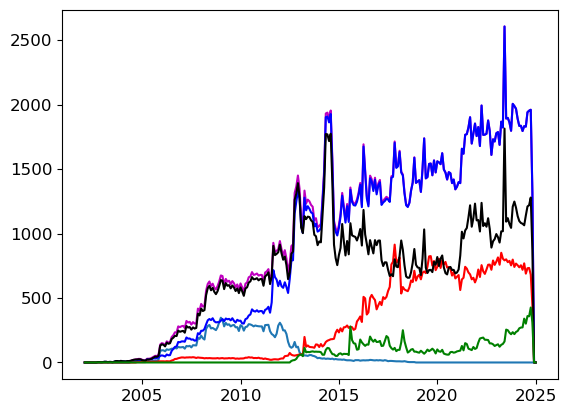

In [97]:
# not for publication
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Total O2 Float Profiles'],'m')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Clark cell electrodes'])
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Optodes'], 'b')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Air calibrated optodes'], 'r')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Not air calibrated'],'k')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['SBE63 Optodes'],'g')



#### Gridded GLODAP profile map / profile by month for comparison with float data

In [98]:
import functions.float_data_processing as fl

gdap = fl.get_glodap(data_dir, year = 2023)
gdap.loc[gdap['G2longitude']<0., "G2longitude"] = gdap.G2longitude[gdap['G2longitude']<0.] + 360.
#set flagged data to NaN (is this needed? or masked array better?)
flagvars = ['G2salinity','G2oxygen','G2nitrate','G2tco2','G2talk','G2phts25p0', 'G2phtsinsitutp', 'G2salinity']

# no flags for temperature or pressure, set those to nan if = -9999.0
gdap.loc[gdap['G2temperature']==-9999.0, "G2temperature"] = np.nan
gdap.loc[gdap['G2pressure']==-9999.0, "G2pressure"] = np.nan

for v in flagvars:
    flag = v+'f'
    naninds = gdap[flag]!=2
    gdap[v][naninds] = np.nan

# GLODAP derived variables: density, MLD and pH

#calc potential density
gdap['sigma0_calculated'] = carbon_utils.sigma0(gdap.G2salinity.values,gdap.G2temperature.values,
                                  gdap.G2longitude.values,gdap.G2latitude.values,gdap.G2pressure.values)
#calculate spice
gdap['spice'] = carbon_utils.spiciness0(gdap.G2salinity.values,gdap.G2temperature.values,
                                  gdap.G2longitude.values,gdap.G2latitude.values,gdap.G2pressure.values)

#rename GLODAP comparison variables to match argo
gdap = gdap.rename(columns={'G2longitude':'LONGITUDE', 'G2latitude':'LATITUDE', 'G2pressure':'PRES_ADJUSTED',
                            'G2temperature':'TEMP_ADJUSTED','G2salinity':'PSAL_ADJUSTED', 
                            'G2oxygen':'DOXY_ADJUSTED','G2nitrate':'NITRATE_ADJUSTED', 'G2tco2':'DIC', 
                            'G2talk':'TALK_LIAR', 'G2MLD':'MLD','G2o2sat':'o2sat', 'G2PTMP':'PTMP', 
                            'sigma0_calculated':'PDENS'})

gdap['obs_index']=gdap.reset_index().index

https://www.ncei.noaa.gov/data/oceans/ncei/ocads/data/0283442/GLODAPv2.2023_Merged_Master_File.csv


/Users/smb-uh/UHM_Ocean_BGC_Group Dropbox/Seth Bushinsky/Work/Manuscripts/2022_07 Deep O2 Bias/code_for_GBC/functions/float_data_processing.py:38: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  gdap = pd.read_csv(save_dir+'GLODAPv2.'+str(year)+'_Merged_Master_File.csv')
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/pandas/core/tools/datetimes.py:1247: RuntimeWarning: invalid value encountered in remainder
  carg / 10000, carg / 100 % 100, carg % 100
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/1753462704.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdap[v][naninds] = np.nan


In [99]:
# identify individual cruises and profiles in GLODAP dataset 
#wmo_list = list()
if 'gdap_all' in locals():
    del gdap_all

gdap_O2 = gdap[~np.isnan(gdap.DOXY_ADJUSTED)]  # remove data w/o oxygen
unique_cruises = np.unique(gdap_O2.G2cruise)

for idx, cruise in enumerate(unique_cruises):
    print(f' {idx +1 }' ' Cruise out of: ' + str(len(unique_cruises))) 

    gdap_cruise = gdap_O2[gdap_O2.G2cruise==cruise]
    cruise_stations = np.unique(gdap_cruise.G2station[gdap_cruise.G2cruise==cruise])

    # break
    for c_idx, station in enumerate(cruise_stations):
        station_index = gdap_cruise.G2station==station

        gdap_cruise.LONGITUDE[station_index]

        cruise_loc = xr.Dataset()
        cruise_loc['G2cruise']=(['N_CRUISE'],np.repeat(cruise,1))
        cruise_loc['station'] =(['N_CRUISE'],np.repeat(station,1))
        cruise_loc['LATITUDE'] =(['N_CRUISE'],np.repeat(np.nanmean(gdap_cruise.LATITUDE[station_index]),1))
        cruise_loc['LONGITUDE'] =(['N_CRUISE'],np.repeat(np.nanmean(gdap_cruise.LONGITUDE[station_index]),1))
        cruise_loc['juld'] =(['N_CRUISE'],np.repeat((gdap_cruise.datetime[station_index].values[0]),1))

        if 'gdap_all' not in locals():
            gdap_all = cruise_loc
        else:
            gdap_all = xr.concat([gdap_all,cruise_loc], 'N_CRUISE')
        

gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180] = gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180]-360
gdap_all



 1 Cruise out of: 1006
 2 Cruise out of: 1006
 3 Cruise out of: 1006
 4 Cruise out of: 1006
 5 Cruise out of: 1006
 6 Cruise out of: 1006
 7 Cruise out of: 1006
 8 Cruise out of: 1006
 9 Cruise out of: 1006
 10 Cruise out of: 1006
 11 Cruise out of: 1006
 12 Cruise out of: 1006
 13 Cruise out of: 1006
 14 Cruise out of: 1006
 15 Cruise out of: 1006
 16 Cruise out of: 1006
 17 Cruise out of: 1006
 18 Cruise out of: 1006
 19 Cruise out of: 1006
 20 Cruise out of: 1006
 21 Cruise out of: 1006
 22 Cruise out of: 1006
 23 Cruise out of: 1006
 24 Cruise out of: 1006
 25 Cruise out of: 1006
 26 Cruise out of: 1006
 27 Cruise out of: 1006
 28 Cruise out of: 1006
 29 Cruise out of: 1006
 30 Cruise out of: 1006
 31 Cruise out of: 1006
 32 Cruise out of: 1006
 33 Cruise out of: 1006
 34 Cruise out of: 1006
 35 Cruise out of: 1006
 36 Cruise out of: 1006
 37 Cruise out of: 1006
 38 Cruise out of: 1006
 39 Cruise out of: 1006
 40 Cruise out of: 1006
 41 Cruise out of: 1006
 42 Cruise out of: 1006
 

<xarray.Dataset>
Dimensions:    (N_CRUISE: 53908)
Dimensions without coordinates: N_CRUISE
Data variables:
    G2cruise   (N_CRUISE) float64 1.0 1.0 1.0 ... 5.023e+03 5.023e+03 5.023e+03
    station    (N_CRUISE) float64 321.0 322.0 323.0 324.0 ... 53.0 56.0 58.0
    LATITUDE   (N_CRUISE) float64 80.73 80.9 81.05 81.2 ... 84.53 83.87 82.45
    LONGITUDE  (N_CRUISE) float64 12.85 18.59 17.67 16.79 ... -24.7 -2.519 8.728
    juld       (N_CRUISE) datetime64[ns] 1984-07-21T13:07:00 ... 2021-09-11T0...

In [100]:
# count glodap cruises by year and month 
year_month_profile_count_gdap = pd.DataFrame(columns=['decimal_year','Total GDAP O2 Profiles'
                                                 ])
for year_n in range(1980, 2024):
    #loop through months
    for mon_n in range(1,13):
        # print(mon_n)
        month_index = np.logical_and(gdap_all['juld'].dt.year==year_n, 
                            gdap_all['juld'].dt.month==mon_n)
        month_count = np.sum(month_index)
        new_data_count = [(year_n + mon_n/12, month_count.values)]
        new_df_count = pd.DataFrame(new_data_count, 
                                    columns=['decimal_year',
                                             'Total GDAP O2 Profiles'])
        
        year_month_profile_count_gdap = pd.concat([year_month_profile_count_gdap, new_df_count], ignore_index=True)

print(year_month_profile_count_gdap)
print(np.max(gdap_all.LONGITUDE))
print(np.min(gdap_all.LONGITUDE))

print(np.max(argo_all.LONGITUDE))

gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180] = gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180]-360

print(np.max(gdap_all.LONGITUDE))
print(np.min(gdap_all.LONGITUDE))

     decimal_year Total GDAP O2 Profiles
0     1980.083333                      0
1     1980.166667                      0
2     1980.250000                      0
3     1980.333333                      0
4     1980.416667                      0
..            ...                    ...
523   2023.666667                      0
524   2023.750000                      0
525   2023.833333                      0
526   2023.916667                      0
527   2024.000000                      0

[528 rows x 2 columns]
<xarray.DataArray 'LONGITUDE' ()>
array(180.)
<xarray.DataArray 'LONGITUDE' ()>
array(-179.99)
<xarray.DataArray 'LONGITUDE' ()>
array(181.706)
<xarray.DataArray 'LONGITUDE' ()>
array(180.)
<xarray.DataArray 'LONGITUDE' ()>
array(-179.99)


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/467356760.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("Spectral_r", 64)
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/467356760.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("Spectral_r", 64)


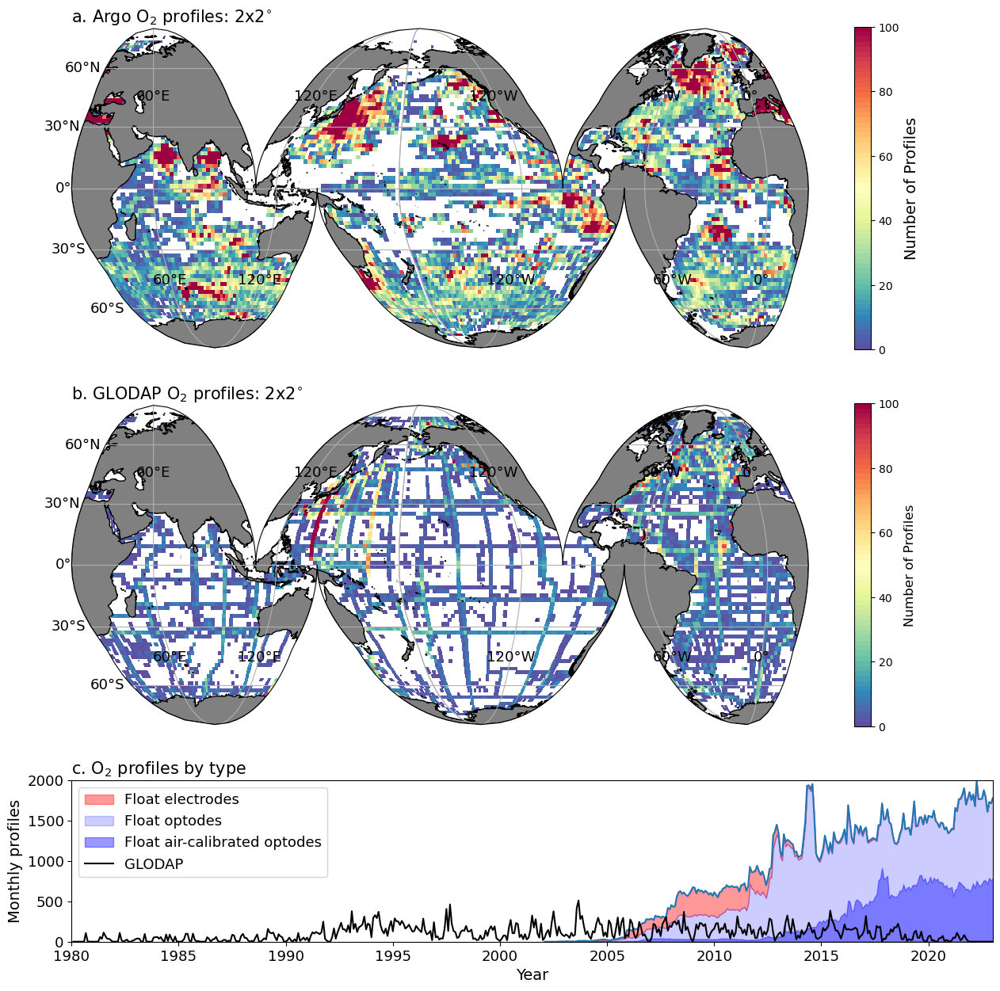

In [102]:
# Figure 1 plotting 
fig = plt.figure(figsize=(15, 15))
title_font_size = 15
axis_label_font_size = 14
plt.rcParams.update({'font.size': 13})
# Create a grid of subplots using gridspec
gs = gridspec.GridSpec(3, 1, width_ratios=[1], height_ratios=[2, 2, 1])

ax = fig.add_subplot(gs[0,:], projection=ccrs.InterruptedGoodeHomolosine(central_longitude=-160, globe=None, emphasis='ocean'))
cmap = plt.cm.get_cmap("Spectral_r", 64)
# ax.coastlines()
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=[.5, .5 ,.5]))

ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False

dlatlon = 2
lonbins = np.arange(-180, 180, dlatlon)
latbins = np.arange(-80, 80, dlatlon)

hist = stats.binned_statistic_2d(argo_all.LATITUDE, argo_all.LONGITUDE, None, bins=[latbins, lonbins], statistic="count")
hist.statistic[hist.statistic == 0] = np.nan  # Sets all values of 0 to nan as log10(0) = -inf
hist.statistic

image = plt.pcolormesh(lonbins, latbins, hist.statistic, cmap=cmap, shading="flat", transform=ccrs.PlateCarree()) 
plt.clim(0, 100) 

cbar = fig.colorbar(image, ax=ax, orientation='vertical')#, fraction=0.1, aspect=40, pad=0.08)
plt.title('a. Argo O$_2$ profiles: ' +str(dlatlon) +'x' + str(dlatlon) +'$^{\circ}$', loc='left', size=title_font_size)
cbar.ax.tick_params(labelsize=10)
cbar.set_label(label='Number of Profiles', size=axis_label_font_size)


ax = fig.add_subplot(gs[1,:], projection=ccrs.InterruptedGoodeHomolosine(central_longitude=-160, globe=None, emphasis='ocean'))
cmap = plt.cm.get_cmap("Spectral_r", 64)
# ax.coastlines()
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=[.5, .5 ,.5]))

ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False
gl.bottom_labels = False

dlatlon = 2
lonbins = np.arange(-180, 180, dlatlon)
latbins = np.arange(-80, 80, dlatlon)

hist = stats.binned_statistic_2d(gdap_all.LATITUDE, gdap_all.LONGITUDE, None, bins=[latbins, lonbins], statistic="count")
hist.statistic[hist.statistic == 0] = np.nan  # Sets all values of 0 to nan as log10(0) = -inf
hist.statistic

image = plt.pcolormesh(lonbins, latbins, hist.statistic, cmap=cmap, shading="flat", transform=ccrs.PlateCarree()) 
plt.clim(0, 100) 

cbar = fig.colorbar(image, ax=ax, orientation='vertical')#, fraction=0.1, aspect=40, pad=0.08)
plt.title('b. GLODAP O$_2$ profiles: ' +str(dlatlon) +'x' + str(dlatlon) +'$^{\circ}$', loc='left', size=title_font_size)
cbar.ax.tick_params(labelsize=10)
cbar.set_label(label='Number of Profiles', size=12)


ax2 = plt.subplot(gs[2,0])

x = year_month_profile_count['decimal_year'][0:-1-6].tolist()
y_total = year_month_profile_count['Total O2 Float Profiles'][0:-1-6].tolist()
y_air = year_month_profile_count['Air calibrated optodes'][0:-1-6].tolist()
y_optodes = year_month_profile_count['Optodes'][0:-1-6].tolist()

y_clark_line = (year_month_profile_count['Optodes'][0:-1-6] + year_month_profile_count['Clark cell electrodes'][0:-1-6]).tolist()
plt.plot(x, y_total)

plt.fill_between(
        x, 
        y_clark_line,
        y_optodes, 
        color= "r",
        alpha= 0.4, label='Float electrodes')

plt.fill_between(
        x, 
        y_optodes,
        0, 
        color= "b",
        alpha= 0.2, label='Float optodes')

plt.fill_between(
        x, 
        y_air,
        0, 
        color= "b",
        alpha= 0.4, label='Float air-calibrated optodes')

x = year_month_profile_count_gdap['decimal_year'][0:-1-6].tolist()
y_total = year_month_profile_count_gdap['Total GDAP O2 Profiles'][0:-1-6].tolist()

plt.plot(x, y_total, 'k', label='GLODAP')

plt.ylabel('Monthly profiles', size=axis_label_font_size)
plt.xlabel('Year', size=axis_label_font_size)
plt.title('c. O$_2$ profiles by type', loc='left', size=title_font_size)
plt.legend()
ax2.set_ylim([0, 2000])
ax2.set_xlim([1980, 2023])

# ax3 = plt.subplot(gs[2,1])


# plt.ylabel('Monthly profiles')
# plt.xlabel('Year')
# plt.title('d. GLODAP O$_2$ profiles', loc='left')
# ax3.set_ylim([0, 2000])
# ax3.set_xlim([1980, 2023])

plt.tight_layout
plt.savefig(manuscript_figs+ 'Fig_1_Argo_O2_Sampling_Density and sensor type_w_glodap' + code_ver + plot_ver + '.png', dpi = 300)
plt.savefig(manuscript_figs+ 'Fig_1_Argo_O2_Sampling_Density and sensor type_w_glodap' + code_ver + plot_ver + '.pdf', dpi = 300)

### Figure 3, 4, 6 prep. Load mean GLODAP offsets, plus original GLODAP offsets and fix longitude in the mean offsets

In [29]:
if 'glodap_offsets_mean' in locals():
    glodap_offsets_mean.close()

glodap_offsets_mean = xr.load_dataset(output_dir+glodap_mean_offsets_filename)

# float_wmo_list = glodap_offsets_p.index.values
float_wmo_list = glodap_offsets_mean.main_float_wmo.values
if 'glodap_offsets' in locals():
    glodap_offsets.close()

glodap_offsets = xr.load_dataset(output_dir+glodap_offsets_filename)

# loop through mean array
for n in range(0,float_wmo_list.shape[0]):
        wmo_n = float_wmo_list[n]

        # fix long_n mean biases:
        temp_LONGITUDE = glodap_offsets.main_float_longitude.where(glodap_offsets.main_float_wmo==wmo_n, drop=True)

        if (np.max(temp_LONGITUDE) - np.min(temp_LONGITUDE))>300:
                # print(n)
                new_mean = np.mean(xr.where(temp_LONGITUDE>=0, temp_LONGITUDE, temp_LONGITUDE+360))
                if new_mean>180:
                        new_mean = new_mean-360
                        
                old_mean = np.mean(glodap_offsets.main_float_longitude.where(glodap_offsets.main_float_wmo==wmo_n, drop=True))
                # print('old mean: '  + str(old_mean.values))
                # print('orig mean glodap:' + str(glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}].values))

                # print('new mean: '  + str(new_mean.values))

                # put new LONGITUDE into long_n
                glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}] = new_mean.values
                # print('New mean glodap:' + str(glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}].values))

glodap_offsets_p = glodap_offsets_mean.to_dataframe()

        
parameter_a = 'o2_calib_air_group'
parameter_b = 'pH_group'
offsets_g = glodap_offsets_p.groupby(parameter_a)
offsets_pH = glodap_offsets_p.groupby([parameter_a, parameter_b])

In [30]:
# only gives the lengths of groups with means actually calculated
No_air_cal_all = offsets_g.get_group('no air cal')
print(len(No_air_cal_all))

air_cal_all = offsets_g.get_group('air cal')
print(len(air_cal_all))

no_cal_all = offsets_g.get_group('no cal/bad')
print(len(no_cal_all))

388
418
64


Figure 3 - air cal histograms

+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
|               |   count |   mean |   std | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+===============+=========+========+=======+===========+================+=================+==========+=======+=======+
| All           |     660 |   -1.9 |   3.9 | <0.001    |           -2.2 |            -1.6 |     -1.9 | -18.1 |  15   |
+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| No air cal.   |     305 |   -1   |   3.9 | <0.001    |           -1.4 |            -0.5 |     -0.9 | -18.1 |  11   |
+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| Air cal.      |     307 |   -3   |   3.4 | <0.001    |           -3.4 |            -2.7 |     -2.7 | -17.8 |   7.7 |
+---------------+---------+--------+-------+----

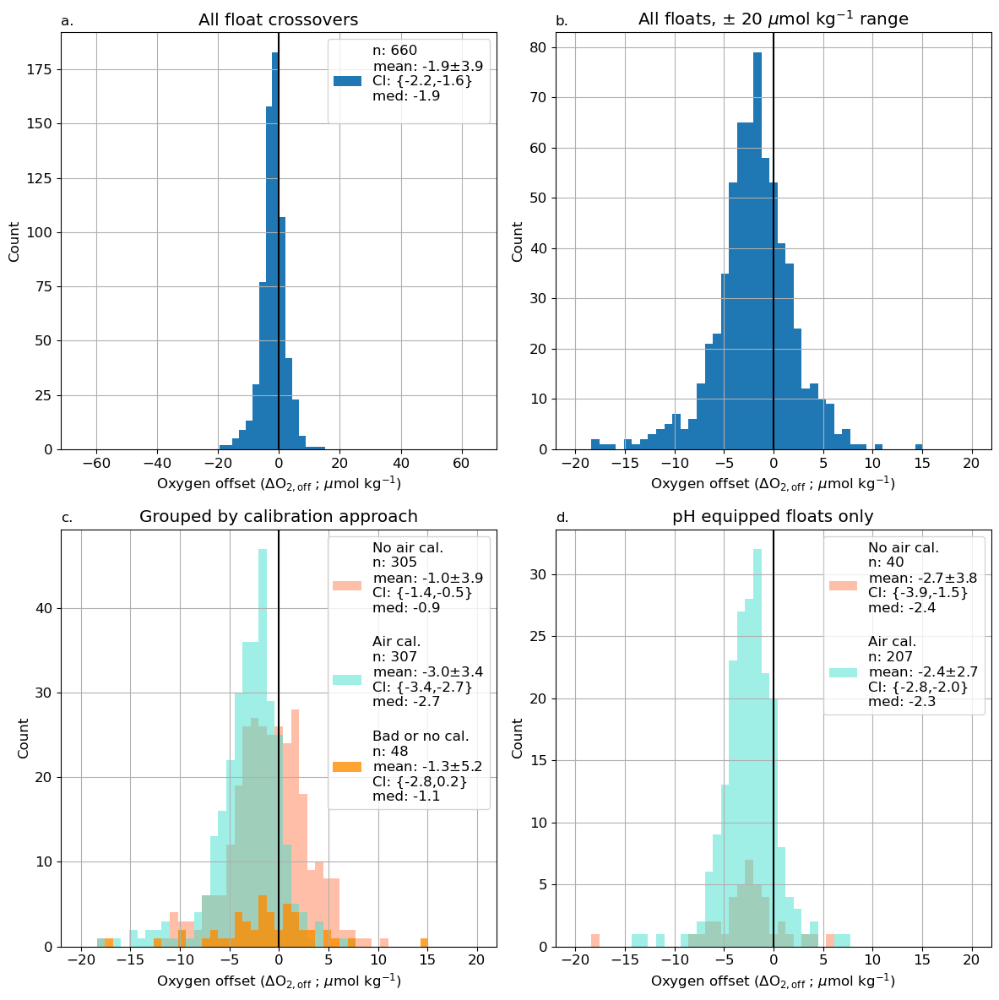

In [31]:
CI_level = 0.95
plt.rcParams.update({'font.size': 12})

plt.figure(figsize=(12,12))

#All Float Crossovers
plt.subplot(2,2,1)
ncount = glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].count()
nmean = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
nmin = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)

o2_offset_data_table = [('All', ncount.item(), nmean.item(), nstd.item(), p_value, CI_low, CI_high, nmedian.item(), nmin.item(), nmax.item())]
plt.hist(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], 
         bins=np.linspace(-65, 65, 61), label='n: '+str(ncount.values) +  '\nmean: ' + str(nmean.values) + '$\pm$' + str(nstd.values) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian.item()) + '\n'
         ) # ,label=str(n)
#print(np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].median().values, decimals=1))
plt.grid()
plt.title('All float crossovers')
plt.title('a.', loc='left', fontsize='medium')

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')
plt.axvline(x=0, color='k')
plt.legend()

# All float crossovers, zoomed in
plt.subplot(2,2,2)
plt.title('All floats, $\pm$ 20 $\mu$mol kg$^{-1}$ range')
plt.title('b.', loc='left', fontsize='medium')

plt.hist(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], 
         bins=np.linspace(-20, 20, 50),label='median='+str(nmedian.values) + 
         ', n='+str(ncount.values)) # ,label=str(n)
plt.grid()
plt.ylabel('Count')
plt.axvline(x=0, color='k')

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')

# Split into calibration group
plt.subplot(2,2,3)
No_air_cal_all = offsets_g.get_group('no air cal')
nmean = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = No_air_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('No air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))


plt.hist(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='coral',
             alpha=.5,label='No air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian) + '\n')



air_cal_all = offsets_g.get_group('air cal')
nmean = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = air_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = air_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)

o2_offset_data_table.append(('Air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))


plt.hist(air_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='turquoise',
             alpha=0.5,label='Air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian) + '\n')


no_cal_all = offsets_g.get_group('no cal/bad')
nmean = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = no_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = no_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('No cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(no_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='darkorange',
             alpha=0.8,label='Bad or no cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian))



#for n, group in offsets_g:
#    print(n)
#    nmean = np.around(group['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
#    nmedian = np.around(group['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
#    ncount = group['DOXY_ADJUSTED_offset_trimmed'].count()

    

plt.title('Grouped by calibration approach')
plt.title('c.', loc='left', fontsize='medium')

plt.axvline(x=0, color='k')
plt.grid()
plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')

plt.legend()

# pH equipped floats only 
plt.subplot(2,2,4)
plt.title('pH equipped floats only')
plt.title('d.', loc='left', fontsize='medium')

no_air_cal_ph = offsets_pH.get_group(('no air cal', 'pH'))
nmean = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nmedian = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
nstd = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmin = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

ncount = no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].count()

temp_var = no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('pH - No cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='coral',
             alpha=.5,label='No air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian) + '\n')
air_cal_ph = offsets_pH.get_group(('air cal', 'pH'))
nmean = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nmedian = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].count()
nstd = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmin = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = air_cal_ph['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('pH - Air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='turquoise',
             alpha=.5,label='Air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian))


#for n, group in offsets_pH:
#    if n[1] == 'no pH' or n[0] == 'no cal/bad':
#        continue
#    print(n)
#    nmean = np.around(group['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
#    nmedian = np.around(group['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
#    ncount = group['DOXY_ADJUSTED_offset_trimmed'].count()

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')
plt.axvline(x=0, color='k')

plt.legend()
    
plt.tight_layout()
plt.grid()
plt.savefig(manuscript_figs + 'Fig_3 Glodap_offsets_doxy_all' + plot_ver + '.png', dpi=300)

print(tabulate(o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

headers=['Float cal. type', 'count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']

# save the table as a word document
print_word_table(manuscript_figs + '/Tables/', 'Table_S2' + code_ver, 'Table S2. Statistics for oxygen offsets between 1450 and 2000 db shown in Figure 3', headers, o2_offset_data_table)



### Figure 4 Nitrate and DIC offset histograms and table

In [81]:
glodap_offsets_mean

<xarray.Dataset>
Dimensions:                           (main_float_wmo: 870)
Coordinates:
  * main_float_wmo                    (main_float_wmo) object '1900650' ... '...
Data variables: (12/64)
    p_compare_min                     (main_float_wmo) float64 1.4e+03 ... 1....
    p_compare_max                     (main_float_wmo) float64 2.1e+03 ... 2....
    delta_dens                        (main_float_wmo) float64 0.005 ... 0.005
    delta_spice                       (main_float_wmo) float64 0.005 ... 0.005
    delta_press                       (main_float_wmo) float64 100.0 ... 100.0
    dist                              (main_float_wmo) float64 100.0 ... 100.0
    ...                                ...
    pH_sensor                         (main_float_wmo) object 'none' ... 'ISU...
    nitrate_group                     (main_float_wmo) object 'no nitrate' .....
    nitrate_sensor                    (main_float_wmo) object 'none' ... 'ISU...
    DOXY_group                        (main_float_wmo) object 'DOXY' ... 'DOXY'
    DOXY_sensor                       (main_float_wmo) object 'AANDERAA_OPTOD...
    ice_group                         (main_float_wmo) object 'no ice' ... 'n...

In [84]:
glodap_offsets_mean_filt = glodap_offsets_mean.where(glodap_offsets_mean['o2_calib_air_group']=='air cal', drop=True)

<xarray.Dataset>
Dimensions:                           (main_float_wmo: 418)
Coordinates:
  * main_float_wmo                    (main_float_wmo) object '1901360' ... '...
Data variables: (12/64)
    p_compare_min                     (main_float_wmo) float64 1.4e+03 ... 1....
    p_compare_max                     (main_float_wmo) float64 2.1e+03 ... 2....
    delta_dens                        (main_float_wmo) float64 0.005 ... 0.005
    delta_spice                       (main_float_wmo) float64 0.005 ... 0.005
    delta_press                       (main_float_wmo) float64 100.0 ... 100.0
    dist                              (main_float_wmo) float64 100.0 ... 100.0
    ...                                ...
    pH_sensor                         (main_float_wmo) object 'none' ... 'ISU...
    nitrate_group                     (main_float_wmo) object 'no nitrate' .....
    nitrate_sensor                    (main_float_wmo) object 'none' ... 'ISU...
    DOXY_group                        (main_float_wmo) object 'DOXY' ... 'DOXY'
    DOXY_sensor                       (main_float_wmo) object 'AANDERAA_OPTOD...
    ice_group                         (main_float_wmo) object 'no ice' ... 'n...

+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
|                       |   count |   mean |   std | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+=======================+=========+========+=======+===========+================+=================+==========+=======+=======+
| NITRATE_ADJUSTED      |     264 |    0.2 |   0.4 | <0.001    |            0.1 |             0.2 |      0.2 |  -2.3 |   1.6 |
+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| pH_25C_TOTAL_ADJUSTED |     106 |   -5.9 |   7.7 | <0.001    |           -7.3 |            -4.4 |     -5.4 | -40   |  14.1 |
+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| DIC                   |     148 |    3.6 |   7   | <0.001    |            2.5 |             4.7 |      2.9 | 

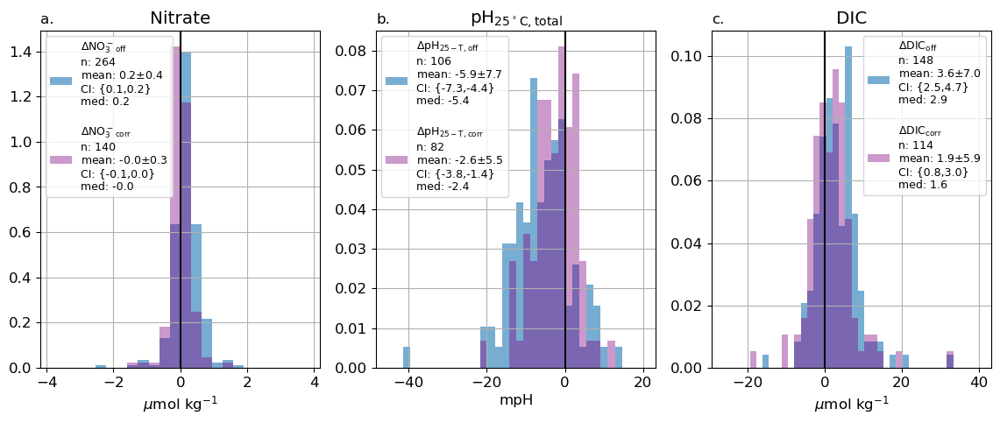

In [86]:
# adding corrected values for comparison
corrected_on = 1
air_cal_only=True # decide whether to plot w/ a filter for which floats are considered

if corrected_on==1:
    # corrected_path = argo_path + '../Corrected/output_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_12/glodap_offset_plots/2024_03_20/'
    corrected_path = argo_path + '../Corrected/output_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_14/glodap_offset_plots/2024_10_22/'

    corrected_glodap_offsets_mean = xr.load_dataset(corrected_path + 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_14_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc')
    # corrected_glodap_offsets_mean = xr.load_dataset(corrected_path + 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_12_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc')

    corrected_o2_offset_data_table = []


CI_level = 0.95
# plt.rcParams.update({'font.size': 12})
o2_offset_data_table = []

var_plot = ['NITRATE_ADJUSTED','pH_25C_TOTAL_ADJUSTED', 'DIC']
# var_plot = ['NITRATE_ADJUSTED','pH_25C_T_P1500', 'DIC']

plt.figure(figsize=(14,5))
for v, var in enumerate(var_plot):

    #All Float Crossovers
    plt.subplot(1,3,v+1)

    if var=='pH_25C_TOTAL_ADJUSTED':
        x_label = r'pH$_{{25}^\circ{\rm C,total}}$'
        x_label_units = 'mpH'
        legend_label = r'$\Delta$pH$_{\rm 25-T,}$'
        plt.xlabel(x_label_units)
        scale = 1000
        bin_v = np.linspace(-45, 20, 37)

    elif var=='pH_25C_T_P1500':
        x_label = r'pH$_{{25}^\circ{\rm C,total}}$'
        x_label_units = 'mpH'
        legend_label = r'$\Delta$pH$_{\rm 25-T,}$'
        plt.xlabel(x_label_units)
        scale = 1000
        bin_v = np.linspace(-45, 20, 37)
    elif var=='NITRATE_ADJUSTED':
        x_label = 'Nitrate'
        x_label_units = '$\mu$mol kg$^{-1}$'
        plt.xlabel(x_label_units)
        legend_label = '$\Delta$NO$_3^-$'
        scale = 1
        bin_v = np.linspace(-3.8, 3.8, 25)

    elif var=='DIC':
        x_label = 'DIC'
        x_label_units = '$\mu$mol kg$^{-1}$'
        plt.xlabel(x_label_units)
        legend_label = '$\Delta$DIC'
        scale = 1
        bin_v = np.linspace(-26, 40, 41)

    if air_cal_only==True:
        glodap_offsets_mean_filt = glodap_offsets_mean.where(glodap_offsets_mean['o2_calib_air_group']=='air cal', drop=True)
    else:
         glodap_offsets_mean_filt = glodap_offsets_mean

    ncount = glodap_offsets_mean_filt[var_plot[v] + '_offset'].count().values
    nmean = np.around(glodap_offsets_mean_filt[var_plot[v] + '_offset'].mean().values*scale, decimals=1)
    nstd = np.around(glodap_offsets_mean_filt[var_plot[v] + '_offset'].std().values*scale, decimals=1)
    nmedian = np.around(glodap_offsets_mean_filt[var_plot[v] + '_offset'].median().values*scale, decimals=1)
    nmin = np.around(glodap_offsets_mean_filt[var_plot[v] + '_offset'].min().values*scale, decimals=1)
    nmax = np.around(glodap_offsets_mean_filt[var_plot[v] + '_offset'].max().values*scale, decimals=1)

    temp_var = glodap_offsets_mean_filt[var_plot[v] + '_offset']*scale
    t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
    if p_value>.001:
        p_value = np.around(p_value, decimals=3)
    else:
        p_value = '<0.001'
    CI_vals = stats.norm.interval(confidence=CI_level, 
                    loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                    scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
    CI_low = np.around(CI_vals[0], decimals=1)
    CI_high = np.around(CI_vals[1], decimals=1)
    o2_offset_data_table.append([var_plot[v], 
                                 ncount, 
                                 nmean, 
                                 nstd, 
                                 p_value, CI_low, CI_high, nmedian, nmin, nmax])
    plt.hist(glodap_offsets_mean_filt[var_plot[v] + '_offset']*scale, alpha=0.6,
            label= legend_label + r'$_{\rm off}$' + '\nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(nmedian) + '\n',bins=bin_v, density=True) # ,label=str(n) #bins=np.linspace(-65, 65, 61),

    if corrected_on==1:
        if air_cal_only==True:
            corrected_glodap_offsets_mean_filt = corrected_glodap_offsets_mean.where(corrected_glodap_offsets_mean['o2_calib_air_group']=='air cal', drop=True)
        else:
            corrected_glodap_offsets_mean_filt = corrected_glodap_offsets_mean

        ncount_corr = corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].count().values
        nmean_corr = np.around(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].mean().values*scale, decimals=1)
        nstd_corr = np.around(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].std().values*scale, decimals=1)
        nmedian_corr = np.around(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].median().values*scale, decimals=1)
        nmin_corr = np.around(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].min().values*scale, decimals=1)
        nmax_corr = np.around(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset'].max().values*scale, decimals=1)

        temp_var_corr = corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset']*scale
        t_stat_corr, p_value_corr = stats.ttest_1samp(a=temp_var_corr, popmean=0, nan_policy='omit') ############
        if p_value_corr>.001:
            p_value_corr = np.around(p_value_corr, decimals=3)
        else:
            p_value_corr = '<0.001'
        CI_vals_corr = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var_corr[~np.isnan(temp_var_corr)].values), 
                        scale = stats.sem(temp_var_corr[~np.isnan(temp_var_corr)].values))
        CI_low_corr = np.around(CI_vals_corr[0], decimals=1)
        CI_high_corr = np.around(CI_vals_corr[1], decimals=1)

        corrected_o2_offset_data_table.append([var_plot[v], 
                                    ncount_corr, 
                                    nmean_corr, 
                                    nstd_corr, 
                                    p_value_corr, CI_low_corr, CI_high_corr, nmedian_corr, nmin_corr, nmax_corr])
        
        plt.hist(corrected_glodap_offsets_mean_filt[var_plot[v] + '_offset']*scale, alpha=0.4,
                label=legend_label + r'$_{\rm corr}$' + '\nn: '+str(ncount_corr) +  '\nmean: ' + str(nmean_corr) + '$\pm$' + str(nstd_corr) + 
            '\nCI: {' + str(CI_low_corr) +',' +  str(CI_high_corr) + '}' + '\nmed: ' + str(nmedian_corr),bins=bin_v, density=True, color='purple')
    plt.grid()
    
    plt.title(x_label)
    if v==0:
        plt.title('a.', loc='left', fontsize='medium')
    elif v==1:
        plt.title('b.', loc='left', fontsize='medium')
    elif v==2:
        plt.title('c.', loc='left', fontsize='medium')
        
    # plt.ylabel('Count')
    plt.axvline(x=0, color='k')
    plt.legend(fontsize=9)
plt.tight_layout
plt.savefig(manuscript_figs + 'Fig_4 Glodap_offsets_DIC_Nitrate_pH_25C_total_all_corrected_'+ str(corrected_on) + 'air cal only_' + str(air_cal_only) + code_ver + plot_ver + '.png', dpi=300)

print(tabulate(o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
# save the table as a word document
print_word_table(manuscript_figs + '/Tables/', 'Table_S3' + 'air cal only_' + str(air_cal_only) + code_ver, 'Table S3.Statistics for Nitrate, pH 25C total, and DIC crossovers at 1500 db', headers, o2_offset_data_table)

if corrected_on==1:
    print(tabulate(corrected_o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

    headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_S4' +  'air cal only_' + str(air_cal_only) + code_ver, 'Table S4.Statistics for Nitrate, pH 25C total, and DIC crossovers at 1500 db', headers, corrected_o2_offset_data_table)


### Calculating pH impact of oxygen bias

In [53]:
# prep for derived 2 & 3 calculations
from multiprocessing import Pool


# LIPHR_path = liar_dir

float_wmo_list = glodap_offsets_p.index.values
# MeasIDVec = [1, 7, 3, 6]
MeasIDVec_LIR = [1, 7, 6]
DesiredVariables_ESPER = [3]
MeasIDVec_ESPER = [1, 2, 6] # S, T, O2 - different numbering than v2 LIRs
Equations_ESPER = 7 # for ESPER - asking to use equation w/ S, T, and O2 only 
n=0
# wmo_n = float_wmo_list[n]
num_processes = 18 

# # just floats without a "derived_2.nc" file present, normally comment out 
# print(len(float_wmo_list))

# derivedlist = []
# for file in os.listdir(argo_path_derived):
#     if file.endswith('derived_2.nc'):
#         derivedlist.append(file[0:7])

# print(len(derivedlist))
# temp_float_wmo_list = []
# for wmo_n in float_wmo_list:
#     if wmo_n not in derivedlist:
#         temp_float_wmo_list.append(wmo_n)

# print(len(temp_float_wmo_list))
# float_wmo_list = temp_float_wmo_list

870
181
689


In [55]:
# Derived 2 - pH and nitrate impacts
if __name__ == "__main__":
    
    with Pool(processes=num_processes) as pool:
        # Create a list of arguments for pool.starmap
        derived_2_args = [(liar_dir, MeasIDVec_LIR, MeasIDVec_ESPER, DesiredVariables_ESPER, Equations_ESPER, argo_path_derived, argo_path_interpolated, wmo_n, glodap_offsets_p) for wmo_n in float_wmo_list]
        # argo_args = [(argo_path, liar_dir, argo_path_interpolated, argo_path_derived, file, qc_data_fields, bgc_data_fields, p_interp, derived_list, interpolation_list) for file in argolist_run]
        
        # Use pool.starmap with the list of arguments
        pool.starmap(derived_functions.calc_derived_2_pH_no3_impacts, derived_2_args)
    

4903624 started
5904476 started
5904672 started
5904694 started
5904847 started
5905023 started
5905077 started
5905099 started
5905371 started
5905635 started
5905995 started
5906030 started
3901668 started
5906212 started
5906221 started
2903654 started
2903614 started
1902382 started
5905375 started
3901669 started
5905638 started
5906249 started
5904845 started
5906002 started
2903657 started
2903648 started
5904676 started
5906034 started
5905080 started
5905072 started
5905101 started
5906300 started
4903625 started
5906343 started
5906472 started
5906489 started
5905378 started
5905639 started
5905133 started
5906044 started
5904846 started
5906305 started
5905073 started
5906511 started
5906436 started
5904688 started
5906005 started
5906491 started
5906557 started
5906767 started
5905971 started
5906315 started
5906516 started
5906492 started
5906566 started
5906319 started
5907055 started
5906520 started
5906503 started
5906582 started
6903549 started
5906339 started
6903576 

In [43]:
float_wmo_list[0]

'1900650'

In [46]:
wmo_n = '5906305'
LIPHR_path = liar_dir
DesiredVariables = DesiredVariables_ESPER
Equations = Equations_ESPER
# if glodap_offsets_p.pH_group[glodap_offsets_p.index==wmo_n].values=='no pH':
# return

# if oxygen offset is nan, then skip
# if np.isnan(glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values):
    # return

print(str(wmo_n) + ' started')

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", message="invalid value encountered in cast")
    argo_derived_n = xr.load_dataset(argo_path_derived+ str(wmo_n) + '_derived.nc')

nprof = argo_derived_n.LATITUDE.shape[0]
# if nprof==1: # if there is only one profile, probably don't want to trust any offset
    # return

# Check for presence of non-nan pH
# if ~np.any(~np.isnan(argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED'])):
    # return

# load interpolated file
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", message="invalid value encountered in cast")
    argo_interp_n = xr.load_dataset(argo_path_interpolated + str(wmo_n) + '_interpolated.nc')

# initialize coordinate and measurement arrays
Coordinates_all = np.empty([nprof, 3],dtype=float)
Coordinates_all[:] = np.nan

Measurements_all_S_T_O2 = np.empty([nprof, 3],dtype=float)
Measurements_all_S_T_O2[:] = np.nan

Measurements_all_S_T = np.empty([nprof, 2],dtype=float)
Measurements_all_S_T[:] = np.nan
for p in range(nprof):
    # load interpolated argo_data so that 1500 m data is present 
    argo_profile = argo_interp_n.isel(N_PROF=p)

    # argo_profile = argo_interp_wmo[wmo_n].isel(N_PROF=p)
    argo_profile.load()
    data_1500 = argo_profile.where(argo_profile.PRES_ADJUSTED==1500, drop=True) 
    if data_1500.LATITUDE.size==0:
        continue

    Coordinates_all[p,:] = np.stack((data_1500.LONGITUDE.values, 
                        data_1500.LATITUDE.values, 
                        data_1500.PRES_ADJUSTED.values),
                        axis=1)
    
    Measurements_all_S_T_O2[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
                        data_1500.TEMP_ADJUSTED.values, 
                        data_1500.DOXY_ADJUSTED.values),
                        axis=1)
    
    Measurements_all_S_T[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
                    data_1500.TEMP_ADJUSTED.values),
                    axis=1)
# if np.sum(~np.isnan(Coordinates_all))==0: # if no valid 1500 meter data is present, skip 
#     return

# calculate decimal_year for ESPER
da = argo_interp_n.juld
decimal_year = da.dt.year + (da.dt.dayofyear - 1 + (da.dt.hour * 3600 + da.dt.minute * 60 + da.dt.second) / 86400) / (365 + da.dt.is_leap_year)

# calculate LIPHR pH at 1500 m using original data from all profiles
orig_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                Coordinates_all.tolist(),
                                Measurements_all_S_T_O2.tolist(),
                                MeasIDVec_LIR, 
                                OAAdjustTF = False)  

# remove data when oxygen is NaN - avoids biasing difference low
pH_orig_no_nan = np.copy(orig_pH)
pH_orig_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

# save 1500 pH orig
argo_derived_n['pH_1500_orig_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
argo_derived_n.pH_1500_orig_LIPHR[:] = pH_orig_no_nan[:,0]

# calculate ESPER pH at 1500 m using original data from all profiles
orig_pH_ESPER = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                DesiredVariables,
                                                Coordinates_all.tolist(),
                                                Measurements_all_S_T_O2.tolist(),
                                                MeasIDVec_ESPER,
                                                Equations, 
                                                decimal_year.values.tolist(), 
                                                0, 0)
# remove data when oxygen is NaN - avoids biasing difference low
pH_orig_ESPER_no_nan = np.copy(orig_pH_ESPER)
pH_orig_ESPER_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

# save 1500 pH orig
argo_derived_n['pH_1500_orig_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
argo_derived_n.pH_1500_orig_ESPER[:] = pH_orig_ESPER_no_nan[:,0]

Equations_ESPER_ST = 8 # for ESPER - asking to use equation w/ S, T 
MeasIDVec_ESPER_ST = [1, 2] # S, T - different numbering than v2 LIRs

# calculate ESPER pH at 1500 m without using oxygen
pH_ESPER_wo_O2 = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                DesiredVariables,
                                                Coordinates_all.tolist(),
                                                Measurements_all_S_T.tolist(),
                                                MeasIDVec_ESPER_ST,
                                                Equations_ESPER_ST, 
                                                decimal_year.values.tolist(), 
                                                0, 0)
# remove data when Temp is NaN - avoids biasing difference low
pH_ESPER_wo_O2_no_nan = np.copy(pH_ESPER_wo_O2)
pH_ESPER_wo_O2_no_nan[np.isnan(Measurements_all_S_T[:,1])] = np.nan

# save 1500 pH orig
argo_derived_n['pH_1500_ESPER_wo_O2'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
argo_derived_n.pH_1500_ESPER_wo_O2[:] = pH_ESPER_wo_O2_no_nan[:,0]



# create a second Measurements array that adjusts oxygen according to the mean glodap bias. Subtract the offset to correct it properly
# create a measurements_offset array that only has S, O2, and T:
Measurements_S_T_O2_w_o2_offset = np.concatenate(([Measurements_all_S_T_O2[:,0]], 
                                [Measurements_all_S_T_O2[:,1]],
                                [Measurements_all_S_T_O2[:,2]] - 
                                glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
Measurements_S_T_O2_w_o2_offset = np.transpose(Measurements_S_T_O2_w_o2_offset)

# calculate LIPHR pH at 1500 m with oxygen adjustment
pH_o2_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
                                Coordinates_all.tolist(),
                                Measurements_S_T_O2_w_o2_offset.tolist(),
                                MeasIDVec_LIR, 
                                OAAdjustTF = False)  

# remove data when oxygen is NaN - avoids biasing difference low
pH_o2_adjust_no_nan = np.copy(pH_o2_adjust)
pH_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

argo_derived_n['pH_1500_O2_ADJUST_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
argo_derived_n.pH_1500_O2_ADJUST_LIPHR[:] = pH_o2_adjust_no_nan[:,0]

# Impact of O2 can be seen in the test_pH minus new_pH average 
argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST'] = \
    argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_o2_adjust_no_nan - pH_orig_no_nan)* \
    ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0


# calculate LIPHR pH at 1500 m with oxygen adjustment
pH_ESPER_o2_adjust = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                DesiredVariables,
                                                Coordinates_all.tolist(),
                                                Measurements_S_T_O2_w_o2_offset.tolist(),
                                                MeasIDVec_ESPER,
                                                Equations, 
                                                decimal_year.values.tolist(), 
                                                0, 0)

# remove data when oxygen is NaN - avoids biasing difference low
pH_ESPER_o2_adjust_no_nan = np.copy(pH_ESPER_o2_adjust)
pH_ESPER_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

argo_derived_n['pH_1500_O2_ADJUST_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
argo_derived_n.pH_1500_O2_ADJUST_ESPER[:] = pH_ESPER_o2_adjust_no_nan[:,0]

# Impact of O2 can be seen in the test_pH minus new_pH average 
argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER'] = \
    argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_ESPER_o2_adjust_no_nan - pH_orig_ESPER_no_nan)* \
    ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0

# Impact of removing O2 can be seen in the test_pH minus new_pH average 
argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_wo_O2_ESPER'] = \
    argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_ESPER_wo_O2_no_nan - pH_orig_ESPER_no_nan)* \
    ((np.nanmean(Measurements_all_S_T[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0


    # do additional nitrate calculations if NITRATE is present
if 'NITRATE_ADJUSTED' in argo_derived_n.keys():
        
    # calculate LINR NO3 at 1500m using original data from all profiles
    orig_no3 = carbon_utils.LINR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all_S_T_O2.tolist(),
                                    MeasIDVec_LIR)  
    
    argo_derived_n['NO3_1500_orig_LINR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.NO3_1500_orig_LINR[:] = orig_no3[:,0]

    # calculate LINR NO3 at 1500m with corrected oxygen 
    no3_o2_adjust = carbon_utils.LINR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_S_T_O2_w_o2_offset.tolist(),
                                    MeasIDVec_LIR)  
    # remove data when oxygen is NaN - avoids biasing difference low
    no3_o2_adjust_no_nan = np.copy(no3_o2_adjust)
    no3_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

    argo_derived_n['NO3_1500_o2_adjust'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.NO3_1500_o2_adjust[:] = no3_o2_adjust_no_nan[:,0]
    
    argo_derived_n['NITRATE_ADJUSTED_w_O2_ADJUST'] = \
        argo_derived_n.NITRATE_ADJUSTED + np.nanmean(no3_o2_adjust_no_nan - orig_no3)

    MeasIDVec_LIR_no_o2 = [1, 7]
    # calculate LINR NO3 at 1500m without using oxygen
    no3_no_o2 = carbon_utils.LINR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all_S_T.tolist(),
                                    MeasIDVec_LIR_no_o2)  
    # remove data when oxygen is NaN - avoids biasing difference low
    no3_no_o2_no_nan = np.copy(no3_no_o2)
    no3_no_o2_no_nan[np.isnan(Measurements_all_S_T[:,1])] = np.nan

    argo_derived_n['NO3_1500_no_o2'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.NO3_1500_no_o2[:] = no3_no_o2_no_nan[:,0]
    
    argo_derived_n['NITRATE_ADJUSTED_wo_O2'] = \
        argo_derived_n.NITRATE_ADJUSTED + np.nanmean(no3_no_o2_no_nan - orig_no3)

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", message="invalid value encountered in cast")
    # argo_derived_n.to_netcdf(argo_path_derived+ str(wmo_n) + '_derived_2.nc')
    print(str(wmo_n)+ ' finished')

5906305 started
5906305 finished


### Calculate and plot pCO2 impacts
Load all derived_2.nc files, read in offset and pH impacts, plot 

In [56]:
derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_2.nc'):
        derivedlist.append(file)

print(len(derivedlist))


186


In [57]:
# testing
argo_n = xr.load_dataset(argo_path_derived + '5906570_derived.nc')
argo_n

<xarray.Dataset>
Dimensions:                    (N_PROF: 67, N_LEVELS: 560)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/17)
    wmo                        int64 5906570
    CYCLE_NUMBER               (N_PROF) float64 1.0 2.0 3.0 ... 65.0 66.0 67.0
    LONGITUDE                  (N_PROF) float64 -143.1 -143.0 ... -151.1 -151.0
    LATITUDE                   (N_PROF) float64 -25.53 -25.44 ... -27.5 -27.8
    JULD_LOCATION              (N_PROF) datetime64[ns] 2022-12-03T03:28:50.00...
    TEMP_ADJUSTED              (N_PROF, N_LEVELS) float32 24.51 24.29 ... nan
    ...                         ...
    PDENS                      (N_PROF, N_LEVELS) float64 24.1 24.16 ... nan nan
    spice                      (N_PROF, N_LEVELS) float64 5.366 5.3 ... nan nan
    PRES_ADJUSTED              (N_PROF, N_LEVELS) float32 4.69 6.19 ... nan nan
    DIC                        (N_PROF, N_LEVELS) float64 nan nan ... nan nan
    TALK_LIAR                  (N_PROF, N_LEVELS) float64 2.351e+03 ... nan
    pH_25C_T_P1500             (N_PROF, N_LEVELS) float64 nan nan ... nan nan

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/770804063.py:5: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  plt.colorbar()
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/770804063.py:8: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  plt.colorbar()
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_34368/770804063.py:11: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  plt.colorbar()


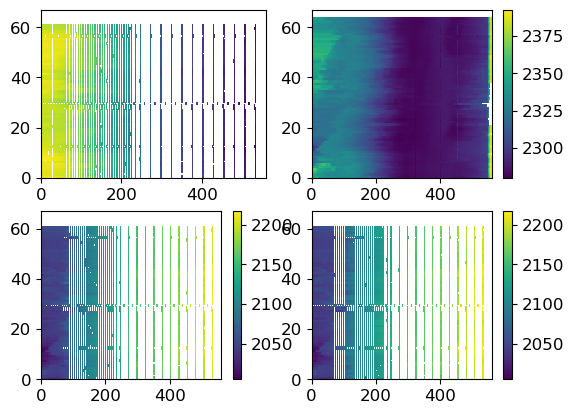

In [58]:

plt.subplot(2,2,1)
plt.pcolor(argo_n['pH_25C_TOTAL_ADJUSTED'])
plt.subplot(2,2,2)
plt.pcolor(argo_n['TALK_LIAR'])
plt.colorbar()
plt.subplot(2,2,3)
plt.pcolor(argo_n['DIC'])
plt.colorbar()
plt.subplot(2,2,4)
plt.pcolor(argo_n['DIC'])
plt.colorbar()

In [59]:
# Derived 3 - calculate pCO2 and DIC impacts from pH impacts
from importlib import reload

reload(derived_functions)

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_2.nc'):
        derivedlist.append(file)

print(len(derivedlist))

if __name__ == "__main__":
    
    with Pool(processes=num_processes) as pool:
        # Create a list of arguments for pool.starmap
        derived_3_args = [(argo_path_derived, file) for file in derivedlist]
        
        # Use pool.starmap with the list of arguments
        pool.starmap(derived_functions.calc_derived_3_pCO2_impacts, derived_3_args)

186
Starting: 5906215_derived_2.nc
Starting: 5906571_derived_2.nc
Starting: 6903575_derived_2.nc
Starting: 5905132_derived_2.ncStarting: 5904679_derived_2.nc

Starting: 5906340_derived_2.nc
Starting: 5906536_derived_2.nc
Starting: 2903862_derived_2.nc
Starting: 5906314_derived_2.nc
Starting: 5906206_derived_2.nc
Starting: 5906246_derived_2.nc
Starting: 5906525_derived_2.nc
Starting: 5904660_derived_2.nc
Starting: 5906513_derived_2.nc
Starting: 5906507_derived_2.nc
Starting: 5906236_derived_2.nc
Starting: 5906471_derived_2.nc
Starting: 5906224_derived_2.nc
Starting: 5906214_derived_2.nc
Starting: 5906531_derived_2.nc
Starting: 5904187_derived_2.nc
Starting: 4903500_derived_2.nc
Starting: 5905075_derived_2.nc
Starting: 7901095_derived_2.nc
Starting: 5906515_derived_2.nc
Starting: 5906307_derived_2.nc
Starting: 5906553_derived_2.nc
Starting: 5906301_derived_2.nc
Starting: 5906247_derived_2.nc
Starting: 5906570_derived_2.nc
Starting: 5905972_derived_2.nc
Starting: 5905992_derived_2.nc
Star

In [71]:
# read in "impacts", adjust original Sprof data by the mean impact amounts
air_cal_only=False

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        if air_cal_only==True and glodap_offsets_p.loc[str(file[0:7]), "o2_calib_air_group"] == 'air cal':
            derivedlist.append(file)
        elif air_cal_only==False:
            derivedlist.append(file)

print(len(derivedlist))


186


Saving out nitrate, pH, O2, and DIC differences / impacts for corrected version of the data


In [72]:
for n in range(0, len(derivedlist)):

    print(f' {n}' ' File: ' + derivedlist[n]) 

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="invalid value encountered in cast")
        argo_n = xr.load_dataset(argo_path_derived+ derivedlist[n])

    wmo_n = argo_n['wmo']

    # oxygen bias/offset for this float
    o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==str(wmo_n.values)].values
   
    pH_1500_change_o2 = argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'] # pH change at 1500m due to direct oxygen change
    pH_1500_change_o2_esper = argo_n['pH_1500_O2_ADJUST_ESPER'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m due to direct oxygen change

    # print(pH_1500_change_o2)
    deep_1500m = argo_n.where(argo_n.PRES_ADJUSTED<1600, drop=False)
    deep_1500m = deep_1500m.where(deep_1500m.PRES_ADJUSTED>1400, drop=False)

    DIC_diff_1500 = deep_1500m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')
    DIC_diff_1500_ESPER = deep_1500m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

    # print(argo_path)
    corrected_path = argo_path + '../Corrected/Sprof/'

    if not os.path.isdir(corrected_path):
        os.mkdir(argo_path + '../Corrected/')
        os.mkdir(corrected_path)

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="invalid value encountered in cast")
        sprof_n = xr.load_dataset(argo_path + derivedlist[n][0:7] + '_Sprof.nc')

    impact_dataset = xr.Dataset()
    # print(sprof_n)
    if 'NITRATE_ADJUSTED' in argo_n.keys():
        no3_1500_change_o2 = argo_n['NO3_1500_o2_adjust'] - argo_n['NO3_1500_orig_LINR']

        # print(np.nanmean(sprof_n['NITRATE_ADJUSTED'].values))
        impact_dataset['mean_nitrate_impact_change'] = no3_1500_change_o2.mean()

    # print(np.nanmean(sprof_n['NITRATE_ADJUSTED'].values))
    impact_dataset['mean_O2_offset'] = o2_offset_n.item()

    impact_dataset['mean_pH_impact_change'] = pH_1500_change_o2_esper.mean()
    impact_dataset['mean_DIC_1500_impact_change'] = DIC_diff_1500_ESPER.mean()

    impact_dataset.to_netcdf(corrected_path + derivedlist[n][0:7] + '_impact.nc')
    # sprof_n.to_netcdf(corrected_path + derivedlist[n][0:7] + '_Sprof.nc')

    src = argo_path + derivedlist[n][0:7] + '_Sprof.nc'
    dst = corrected_path + derivedlist[n][0:7] + '_Sprof.nc'

    cmd = f'cp "{src}" "{dst}"'
    os.system(cmd)

    src = argo_path + derivedlist[n][0:7] + '_meta.nc'
    dst = corrected_path + derivedlist[n][0:7] + '_meta.nc'

    cmd = f'cp "{src}" "{dst}"'
    os.system(cmd)
    # break

 0 File: 5904678_derived_3.nc
 1 File: 5906436_derived_3.nc
 2 File: 5906340_derived_3.nc
 3 File: 5905972_derived_3.nc
 4 File: 5906237_derived_3.nc
 5 File: 5906513_derived_3.nc
 6 File: 7901095_derived_3.nc
 7 File: 5905135_derived_3.nc
 8 File: 5905132_derived_3.nc
 9 File: 5906553_derived_3.nc
 10 File: 5904695_derived_3.nc
 11 File: 5906471_derived_3.nc
 12 File: 5906307_derived_3.nc
 13 File: 5904472_derived_3.nc
 14 File: 5906246_derived_3.nc
 15 File: 5906213_derived_3.nc
 16 File: 5906562_derived_3.nc
 17 File: 5906440_derived_3.nc
 18 File: 2903862_derived_3.nc
 19 File: 5906214_derived_3.nc
 20 File: 5904187_derived_3.nc
 21 File: 5906570_derived_3.nc
 22 File: 5906525_derived_3.nc
 23 File: 5906522_derived_3.nc
 24 File: 5906206_derived_3.nc
 25 File: 5904693_derived_3.nc
 26 File: 5906224_derived_3.nc
 27 File: 5906301_derived_3.nc
 28 File: 5906507_derived_3.nc
 29 File: 5907052_derived_3.nc
 30 File: 6903551_derived_3.nc
 31 File: 5904474_derived_3.nc
 32 File: 5906236_

### Plot / save pCO2 impacts for figures

In [37]:
derivedlist
n=1

['5904678_derived_3.nc',
 '5906436_derived_3.nc',
 '5906340_derived_3.nc',
 '5905972_derived_3.nc',
 '5906237_derived_3.nc',
 '5906513_derived_3.nc',
 '5905135_derived_3.nc',
 '5905132_derived_3.nc',
 '5906553_derived_3.nc',
 '5904695_derived_3.nc',
 '5906471_derived_3.nc',
 '5904472_derived_3.nc',
 '5906246_derived_3.nc',
 '5906213_derived_3.nc',
 '5906562_derived_3.nc',
 '5906440_derived_3.nc',
 '2903862_derived_3.nc',
 '5906214_derived_3.nc',
 '5906570_derived_3.nc',
 '5906525_derived_3.nc',
 '5906522_derived_3.nc',
 '5906206_derived_3.nc',
 '5904693_derived_3.nc',
 '5906224_derived_3.nc',
 '5906301_derived_3.nc',
 '5906507_derived_3.nc',
 '5907052_derived_3.nc',
 '6903551_derived_3.nc',
 '5904474_derived_3.nc',
 '5906236_derived_3.nc',
 '5905973_derived_3.nc',
 '5906512_derived_3.nc',
 '5906314_derived_3.nc',
 '5906515_derived_3.nc',
 '5906437_derived_3.nc',
 '5904679_derived_3.nc',
 '5905134_derived_3.nc',
 '5906523_derived_3.nc',
 '5906207_derived_3.nc',
 '5906571_derived_3.nc',


In [44]:
argo_n

<xarray.Dataset>
Dimensions:                                      (N_PROF: 82, N_LEVELS: 557)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/38)
    wmo                                          int64 5906436
    CYCLE_NUMBER                                 (N_PROF) float64 1.0 ... 111.0
    LONGITUDE                                    (N_PROF) float64 -65.73 ... ...
    LATITUDE                                     (N_PROF) float64 23.87 ... 2...
    JULD_LOCATION                                (N_PROF) datetime64[ns] 2021...
    TEMP_ADJUSTED                                (N_PROF, N_LEVELS) float32 2...
    ...                                           ...
    pCO2_pH_O2_TALK_orig                         (N_PROF, N_LEVELS) float64 n...
    DIC_pH_O2_TALK_orig                          (N_PROF, N_LEVELS) float64 n...
    pCO2_pH_O2_ESPER_TALK_orig                   (N_PROF, N_LEVELS) float64 n...
    DIC_pH_O2_ESPER_TALK_orig                    (N_PROF, N_LEVELS) float64 n...
    pCO2_pH_wo_O2_ESPER_TALK_orig                (N_PROF, N_LEVELS) float64 n...
    DIC_pH_wo_O2_ESPER_TALK_orig                 (N_PROF, N_LEVELS) float64 n...

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_75326/274035563.py:5: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  plt.colorbar()


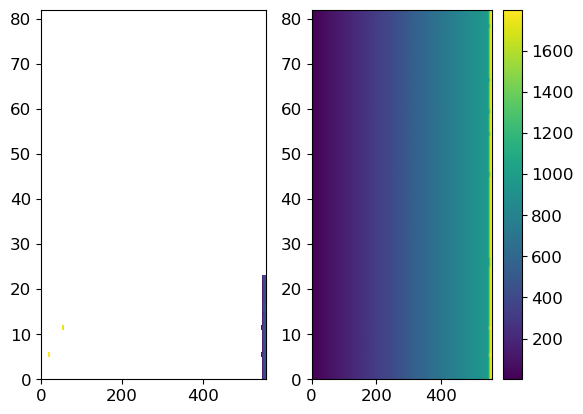

In [57]:
plt.subplot(1,2,1)
plt.pcolor(argo_n['pH_25C_T_P1500'])
plt.subplot(1,2,2)
plt.pcolor(argo_n['PRES_ADJUSTED'])
plt.colorbar()


In [73]:
# plotting pCO2 impacts for floats and saving out results 

air_cal_only=False
show_plot=False
save_plot=False

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        if air_cal_only==True and glodap_offsets_p.loc[str(file[0:7]), "o2_calib_air_group"] == 'air cal':
            derivedlist.append(file)
        elif air_cal_only==False:
            derivedlist.append(file)
o2_impact_no3 = pd.DataFrame(columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
no_o2_impact_no3 = pd.DataFrame(columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])

o2_impact_direct = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo','pH'])
o2_impact_direct_esper = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact','dic_impact_surf','dic_impact_1500','o2_conc', 'long', 'lat', 'wmo'])
no_o2_impact_direct_esper = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact','dic_impact_surf','dic_impact_1500','o2_conc', 'long', 'lat', 'wmo'])


o2_impact_seasonal = pd.DataFrame(columns=['wmo','o2_bias','long', 'lat', 'day_of_year',
                                           'pCO2_diff_surface_pH_o2_TALK_orig',
                                           'pCO2_diff_surface_pH_o2_esper_TALK_orig' ])
# o2_impact_seasonal = pd.DataFrame(columns=['wmo','o2_conc','dayofyear', 'long', 'lat', 
#                                            'pCO2_diff_surface_pH_o2_TALK_orig',
#                                              'pCO2_diff_surface_pH_o2_esper_TALK_orig'])
# o2_no3_impact_pH_TA = pd.DataFrame(columns=['o2_bias', 'pCO2_impact', 'o2_conc'])

#pCO2_impact = list()


#o2_offset_3 = list()
# last=0

print(len(derivedlist))


for n in range(0, len(derivedlist)):

        print(f' {n}' ' File: ' + derivedlist[n]) 
        argo_n = xr.load_dataset(argo_path_derived+ derivedlist[n])

        wmo_n = argo_n['wmo']

        # oxygen bias/offset for this float
        o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==str(wmo_n.values)].values
        lat_n = glodap_offsets_p.main_float_latitude[glodap_offsets_p.index==str(wmo_n.values)].values
        long_n = glodap_offsets_p.main_float_longitude[glodap_offsets_p.index==str(wmo_n.values)].values

        # pH changes 
        pH_1500_change_o2 = argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'] # pH change at 1500m due to direct oxygen change
        pH_1500_change_o2_esper = argo_n['pH_1500_O2_ADJUST_ESPER'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m due to direct oxygen change
        pH_1500_remove_o2_esper = argo_n['pH_1500_ESPER_wo_O2'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m if ESPER is used w/o oxygen at all 

        # create an index of the upper 25 m 
        upper_25m = argo_n.where(argo_n.PRES_ADJUSTED<25, drop=False)

        # create an index of 1400-1600 m 
        deep_1500m = argo_n.where(argo_n.PRES_ADJUSTED<1600, drop=False)
        deep_1500m = deep_1500m.where(deep_1500m.PRES_ADJUSTED>1400, drop=False)

        # LIPHR pCO2 change at surface due to direct oxygen impact 
        pCO2_diff_surface_pH_o2_TALK_orig = upper_25m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_o2_TALK_orig = upper_25m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER pCO2 change at surface due to direct oxygen impact 
        pCO2_diff_surface_pH_o2_esper_TALK_orig = upper_25m.pCO2_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_o2_esper_TALK_orig = upper_25m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

         # ESPER pCO2 change at surface due to removing oxygen 
        pCO2_diff_surface_pH_no_o2_esper_TALK_orig = upper_25m.pCO2_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_no_o2_esper_TALK_orig = upper_25m.DIC_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # LIPHR 1500 m differences
        pCO2_diff_1500 = deep_1500m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_1500 = deep_1500m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER 1500 m differences
        DIC_diff_1500_ESPER = deep_1500m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER 1500 m no o2 differences
        DIC_diff_1500_ESPER_no_o2 = deep_1500m.DIC_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

   #     TALK_o2_adjust_diff_1500 = deep_1500m.TALK_w_O2_ADJUST.mean(dim='N_LEVELS') - deep_1500m.TALK_LIAR.mean(dim='N_LEVELS')
   #     TALK_o2_adjust_diff_1500_v2 = argo_n['TALK_1500_O2_ADJUST_LIAR'] - argo_n['TALK_1500_orig_LIAR']

        # save impacts due to direct o2 impacts alone
        new_data_o2_direct_impact = [(o2_offset_n.item(), 
                                      pH_1500_change_o2.mean().item(), 
                                      pCO2_diff_surface_pH_o2_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_o2_TALK_orig.mean().item(),
                                      DIC_diff_1500.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item(),
                                      deep_1500m.PH_IN_SITU_TOTAL_ADJUSTED.mean().item())]
        new_df_o2_direct_impact= pd.DataFrame(new_data_o2_direct_impact, columns=['o2_bias', 'pH_impact',
                                                                                   'pCO2_impact', 
                                                                                   'dic_impact_surf',
                                                                                   'dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo','pH'])
        o2_impact_direct = pd.concat([o2_impact_direct, new_df_o2_direct_impact], ignore_index=True)


        # save impacts due to direct o2 impacts alone
        new_data_o2_direct_impact_esper = [(o2_offset_n.item(), 
                                      pH_1500_change_o2_esper.mean().item(), 
                                      pCO2_diff_surface_pH_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_1500_ESPER.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item())]
        new_df_o2_direct_impact_esper= pd.DataFrame(new_data_o2_direct_impact_esper, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo'])
        o2_impact_direct_esper = pd.concat([o2_impact_direct_esper, new_df_o2_direct_impact_esper], ignore_index=True)

        # save impacts due to removing o2 alone
        new_data_no_o2_direct_esper = [(o2_offset_n.item(), 
                                      pH_1500_remove_o2_esper.mean().item(), 
                                      pCO2_diff_surface_pH_no_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_no_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_1500_ESPER_no_o2.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item())]
        new_df_no_o2_direct_esper= pd.DataFrame(new_data_no_o2_direct_esper, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo'])
        no_o2_impact_direct_esper = pd.concat([no_o2_impact_direct_esper, new_df_no_o2_direct_esper], ignore_index=True)

        new_data_o2_impact_seasonal = pd.DataFrame({
                'wmo': np.ones(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].shape[0])*argo_n.wmo.values,
                'o2_bias': np.ones(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].shape[0])*o2_offset_n.item(),
                'long': argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'lat': argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'day_of_year': argo_n.JULD_LOCATION[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].dt.dayofyear.values.tolist(),
                'pCO2_diff_surface_pH_o2_TALK_orig': pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'pCO2_diff_surface_pH_o2_esper_TALK_orig': pCO2_diff_surface_pH_o2_esper_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist()

        })

        # Concatenate the new DataFrame to o2_impact_seasonal
        o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_data_o2_impact_seasonal], ignore_index=True)
        # # calculate seasonal impacts on pCO2
        # new_data_o2_impact_seasonal = [(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
        #                                 argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
        #                                 pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist())]
        # new_df_o2_impact_seasonal= pd.DataFrame(new_data_o2_impact_seasonal, columns=['long', 'lat', 'pCO2_diff_surface_pH_o2_TALK_orig'])
        # o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_df_o2_impact_seasonal], ignore_index=True)

        # nitrate impacts, if nitrate is present
        if 'NITRATE_ADJUSTED' in argo_n.keys():
                # pH_1500_change_o2_no3 = argo_n['pH_1500_o2_no3_LIPHR'] - argo_n['pH_1500_orig_LIPHR']# pH change at 1500m due to both oxygen and no3 change
                # pH_1500_change_no3 = argo_n['pH_1500_no3_LIPHR'] - argo_n['pH_1500_orig_LIPHR']# pH change at 1500m due to no3 alone
                # pH_1500_change_no3_v2 = deep_1500m.PH_w_NO3_ADJUST.mean(dim='N_LEVELS') - deep_1500m.PH_IN_SITU_TOTAL_ADJUSTED.mean(dim='N_LEVELS')
               
                # NO3 change due to oxygen bias adjustment 
                no3_1500_change_o2 = argo_n['NO3_1500_o2_adjust'] - argo_n['NO3_1500_orig_LINR']
                no3_1500_remove_o2 = argo_n['NO3_1500_no_o2'] - argo_n['NO3_1500_orig_LINR']

                no3_1500_change_o2_v2 = deep_1500m.NITRATE_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS') - deep_1500m.NITRATE_ADJUSTED.mean(dim='N_LEVELS')

                # # Impact on TA from no3 alone
                # TALK_no3_adjust_surf = upper_25m.TALK_w_NO3_ADJUST.mean(dim='N_LEVELS') - upper_25m.TALK_LIAR.mean(dim='N_LEVELS')
                # TALK_no3_adjust_diff_1500 = deep_1500m.TALK_w_NO3_ADJUST.mean(dim='N_LEVELS') - deep_1500m.TALK_LIAR.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to no3 impact on TA and pH
                # pCO2_diff_surface_pH_NO3_TALK_orig = upper_25m.pCO2_pH_NO3_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to o2 and no3 impact on pH (no TA change)
                # pCO2_diff_surface_pH_o2_no3_TALK_orig = upper_25m.pCO2_pH_O2_NO3_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # #pCO2 change at surface due to O2 and NO3 on pH and NO3 on Alk
                # pCO2_diff_surface_pH_o2_no3_TALK_no3 = \
                #         upper_25m.pCO2_pH_O2_NO3_TALK_NO3.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to no3 impact on alkalinity alone
                # pCO2_diff_surface_pH_orig_TALK_no3 = upper_25m.pCO2_pH_orig_TALK_NO3.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # save impacts due to o2 effect on no3 only        
                new_data_o2_impact_no3 = [(o2_offset_n.item(), 
                                                no3_1500_change_o2.mean().item(),  
                                                deep_1500m.DOXY_ADJUSTED.mean().item(),
                                                long_n.item(),
                                                lat_n.item(),
                                                wmo_n.item())]
                new_df_o2_impact_no3 = pd.DataFrame(new_data_o2_impact_no3, 
                                                        columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                o2_impact_no3 = pd.concat([o2_impact_no3, new_df_o2_impact_no3], ignore_index=True)

                # save impacts due to removing o2 on no3 only        
                new_data_no_o2_no3 = [(o2_offset_n.item(), 
                                                no3_1500_remove_o2.mean().item(),  
                                                deep_1500m.DOXY_ADJUSTED.mean().item(),
                                                long_n.item(),
                                                lat_n.item(),
                                                wmo_n.item())]
                new_df_no_o2_no3 = pd.DataFrame(new_data_no_o2_no3, 
                                                        columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                no_o2_impact_no3 = pd.concat([no_o2_impact_no3, new_df_no_o2_no3], ignore_index=True)
                

                #  # save impacts on pH and pCO2 due to oxygen and nitrate changes (but no TA impact)
                # new_data_o2_no3_impact_pH = [(o2_offset_n.item(), 
                #                         pH_1500_change_o2_no3.mean().item(), 
                #                         pCO2_diff_surface_pH_o2_no3_TALK_orig.mean().item(),
                #                         deep_1500m.DOXY_ADJUSTED.mean().item(),
                #                         long_n.item(),
                #                         lat_n.item(),
                #                         wmo_n.item())]
                # new_df_o2_no3_impact_pH = pd.DataFrame(new_data_o2_no3_impact_pH, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                # o2_no3_impact_pH = pd.concat([o2_no3_impact_pH, new_df_o2_no3_impact_pH], ignore_index=True)

                # # save impacts on pCO2 due to O2 and NO3 on pH and NO3 on TA
                # new_data_o2_no3_impact_pH_no3_impact_TA = [(o2_offset_n.item(), 
                #                         pCO2_diff_surface_pH_o2_no3_TALK_no3.mean().item(),
                #                         deep_1500m.DOXY_ADJUSTED.mean().item())]
                # new_df_o2_no3_impact_pH_no3_impact_TA = pd.DataFrame(new_data_o2_no3_impact_pH_no3_impact_TA, columns=['o2_bias', 'pCO2_impact', 'o2_conc'])
                # o2_no3_impact_pH_TA = pd.concat([o2_no3_impact_pH_TA, new_df_o2_no3_impact_pH_no3_impact_TA], ignore_index=True)

      
     
        if save_plot is False:
                continue
        else:
                # plot variables and differences 
                plt.figure(figsize=(14,18))

                # pH
                plt.subplot(5,3,1)
                #plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_corr.mean(dim='N_LEVELS'))
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED.mean(dim='N_LEVELS'), label='pH orig', marker='x', color='k')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS'), marker='o', color='m', label='pH + O2 Impact')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER.mean(dim='N_LEVELS'), 
                         marker='+', color='g', label='pH ESPER + O2 Impact')

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_w_O2_NO3_ADJUST.mean(dim='N_LEVELS'), marker='+', color='g', label='pH + O2 NO3 Impact')
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_w_NO3_ADJUST.mean(dim='N_LEVELS'), marker='*', color='b', label='pH + O2 NO3 Impact')

                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])
                plt.legend()
                plt.title(str(wmo_n.values) + ', O2 bias= ' + "%.2f" % o2_offset_n + ' umol kg-1')
                plt.xticks(rotation=45)

                # pH differences at 1500 m
                plt.subplot(5,3,2)
                plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2*1000, marker='o', color='m', label = 'pH, O2 direct ' + "%.2f" % np.nanmean(pH_1500_change_o2*1000))
                plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2_esper*1000, marker='+', color='g', 
                         label = 'pH ESPER, O2 direct ' + "%.2f" % np.nanmean(pH_1500_change_o2_esper*1000))

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2_no3*1000, marker='+', color='g', label = 'pH, O2 NO3 impact ' + "%.2f" % np.nanmean(pH_1500_change_o2_no3*1000))
                #         plt.plot(argo_n.JULD_LOCATION, pH_1500_change_no3*1000, marker='*', color='b', label = 'pH, NO3 alone ' + "%.2f" % np.nanmean(pH_1500_change_no3*1000))
                        #plt.plot(argo_n.JULD_LOCATION, pH_1500_change_no3_v2*1000, marker='*', color='y', label = 'pH, NO3 alone ' + "%.2f" % np.nanmean(pH_1500_change_no3_v2*1000))
                plt.legend()
                plt.xticks(rotation=45)
                plt.title('pH diff at 1500 m (mpH)')
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                if 'NITRATE_ADJUSTED' in argo_n.keys():

                        # Nitrate
                        plt.subplot(5,3,4)
                        plt.plot(argo_n.JULD_LOCATION, upper_25m.NITRATE_ADJUSTED.mean(dim='N_LEVELS'), label='NO3 orig')
                        plt.plot(argo_n.JULD_LOCATION, upper_25m.NITRATE_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS'), label='NO3, O2 Impact')
                        plt.legend()
                        plt.title('Nitrate')
                        plt.xticks(rotation=45)
                        plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                        plt.subplot(5,3,5)
                        plt.plot(argo_n.JULD_LOCATION, no3_1500_change_o2, label = 'NO3, O2 impact ' + "%.2f" % np.nanmean(no3_1500_change_o2))
                        
                        #plt.plot(argo_n.JULD_LOCATION, no3_1500_change_o2_v2, label = 'NO3, O2 impact ' + "%.2f" % np.nanmean(no3_1500_change_o2_v2))
                        plt.legend()
                        plt.xticks(rotation=45)
                        plt.title('NO3 diff at 1500 m (umol/kg)')
                        plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # TALK
                plt.subplot(5,3,7)
                plt.plot(argo_n.JULD_LOCATION, upper_25m.TALK_LIAR.mean(dim='N_LEVELS'), label='pH no bias corr + O2 Impact')
                plt.title('TALK from LIAR algorithm')
                plt.xticks(rotation=45)
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # plt.subplot(5,3,8)
                # # if 'NITRATE_ADJUSTED' in argo_n.keys():
                # #         plt.plot(argo_n.JULD_LOCATION, TALK_no3_adjust_diff_1500, label = 'NO3 impact ' + "%.2f" % np.nanmean(TALK_no3_adjust_diff_1500))

                # # plt.plot(argo_n.JULD_LOCATION, TALK_o2_adjust_diff_1500, label = 'O2 impact ' + "%.2f" % np.nanmean(TALK_o2_adjust_diff_1500))
                # # plt.plot(argo_n.JULD_LOCATION, TALK_o2_adjust_diff_1500_v2, label = 'O2 impact v2' + "%.2f" % np.nanmean(TALK_o2_adjust_diff_1500_v2))
                # plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # plt.title('TALK diff at 1500 m (umol/kg)')
                # plt.legend()

                # plt.xticks(rotation=45)

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.subplot(5,3,9)
                #         plt.plot(argo_n.JULD_LOCATION, TALK_no3_adjust_surf, label = 'NO3 impact ' + "%.2f" % np.nanmean(TALK_no3_adjust_surf))
                #         plt.legend()
                #         plt.title('TALK diff upper 25 m (umol/kg)')
                #         plt.xticks(rotation=45)

                # pCO2 
                plt.subplot(5,3,10)
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS'),
                        marker='x', color='k', label='pH: orig; TA: orig')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS'), 
                        marker='o', color='m', label='pH: O2; TA: orig')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS'), 
                        marker='+', color='g', label='pH ESPER: O2; TA: orig')
                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         # plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_orig_TALK_NO3.mean(dim='N_LEVELS'), 
                #         #         marker='*', color='b', label='pH: orig; TA: NO3')
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_NO3_TALK_orig.mean(dim='N_LEVELS'), 
                #                 marker='+', color='g', label= 'pH: O2, NO3; TA: orig')
                #         # plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_NO3_TALK_NO3.mean(dim='N_LEVELS'), 
                #         #         marker='s', color='c', label= 'pH: O2, NO3; TA: NO3')
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                plt.title('pCO2')
                plt.legend()
                plt.xticks(rotation=45)

                #        plt.subplot(5,3,11)
                #plt.plot(argo_n.JULD_LOCATION, pCO2_diff_1500, marker='x',
                #        label='pH + O2 Impact ' + "%.2f" % np.nanmean(pCO2_diff_1500))
                #plt.legend()
                #plt.xticks(rotation=45)
                #plt.title('pCO2 diff at 1500 m (uatm)')

                plt.subplot(5,3,12)
                plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_TALK_orig,  marker='o', color='m',
                        label='pH: O2; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_TALK_orig))
                plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_esper_TALK_orig,  marker='+', color='g',
                        label='pH ESPER: O2; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_esper_TALK_orig))
                
                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         # plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_orig_TALK_no3,  marker='*', color='b',
                #         #         label='pH: orig; TA: NO3 ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_orig_TALK_no3))
                #         plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_no3_TALK_orig, marker='+', color='g',
                #                 label='pH: O2, NO3; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_no3_TALK_orig))
                #         # plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_no3_TALK_no3,
                #         #         label='pH: O2, NO3; TA: NO3 ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_no3_TALK_no3))
                plt.legend()
                plt.xticks(rotation=45)
                plt.title('pCO2 diff at surface')

                # plt.subplot(5,3,5)
                # #plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_corr.mean(dim='N_LEVELS'))
                # if pCO2_diff.isnull().sum()!=len(pCO2_diff):
                #     plt.hist(pCO2_diff)
                
                # plt.title('pCO2 O2 impact minus pCO2 orig: mean ' + "%.2f" % np.mean(pCO2_diff))
                plt.tight_layout()

                plt.savefig(output_dir_figs + 'pCO2_impacts_by_float/' + str(wmo_n.values) + '_pCO2_impact' + code_ver + plot_ver + '.png')

                if show_plot is False:
                        plt.close()
                last = n


186
 0 File: 5904678_derived_3.nc
 1 File: 5906436_derived_3.nc
 2 File: 5906340_derived_3.nc
 3 File: 5905972_derived_3.nc
 4 File: 5906237_derived_3.nc
 5 File: 5906513_derived_3.nc
 6 File: 7901095_derived_3.nc
 7 File: 5905135_derived_3.nc
 8 File: 5905132_derived_3.nc
 9 File: 5906553_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 10 File: 5904695_derived_3.nc
 11 File: 5906471_derived_3.nc
 12 File: 5906307_derived_3.nc
 13 File: 5904472_derived_3.nc
 14 File: 5906246_derived_3.nc
 15 File: 5906213_derived_3.nc
 16 File: 5906562_derived_3.nc
 17 File: 5906440_derived_3.nc
 18 File: 2903862_derived_3.nc
 19 File: 5906214_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 20 File: 5904187_derived_3.nc
 21 File: 5906570_derived_3.nc
 22 File: 5906525_derived_3.nc
 23 File: 5906522_derived_3.nc
 24 File: 5906206_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 25 File: 5904693_derived_3.nc
 26 File: 5906224_derived_3.nc
 27 File: 5906301_derived_3.nc
 28 File: 5906507_derived_3.nc
 29 File: 5907052_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 30 File: 6903551_derived_3.nc
 31 File: 5904474_derived_3.nc
 32 File: 5906236_derived_3.nc
 33 File: 5905973_derived_3.nc
 34 File: 5906512_derived_3.nc
 35 File: 5906314_derived_3.nc
 36 File: 5906515_derived_3.nc
 37 File: 5906437_derived_3.nc
 38 File: 5904679_derived_3.nc
 39 File: 5905134_derived_3.nc
 40 File: 6903575_derived_3.nc
 41 File: 5906523_derived_3.nc
 42 File: 5906207_derived_3.nc
 43 File: 5906571_derived_3.nc
 44 File: 5905075_derived_3.nc
 45 File: 5903893_derived_3.nc
 46 File: 5906215_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 47 File: 5906531_derived_3.nc
 48 File: 5906247_derived_3.nc
 49 File: 5906536_derived_3.nc
 50 File: 4903500_derived_3.nc
 51 File: 5904657_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 52 File: 5906000_derived_3.nc
 53 File: 5904844_derived_3.nc
 54 File: 5904856_derived_3.nc
 55 File: 5904673_derived_3.nc
 56 File: 5905373_derived_3.nc
 57 File: 5906468_derived_3.nc
 58 File: 5906497_derived_3.nc
 59 File: 5905981_derived_3.nc
 60 File: 5904674_derived_3.nc
 61 File: 5905374_derived_3.nc
 62 File: 5906490_derived_3.nc
 63 File: 5906518_derived_3.nc
 64 File: 5906296_derived_3.nc
 65 File: 5905139_derived_3.nc
 66 File: 5905993_derived_3.nc
 67 File: 5907058_derived_3.nc
 68 File: 5906558_derived_3.nc
 69 File: 5904661_derived_3.nc
 70 File: 2903858_derived_3.nc
 71 File: 5905994_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 72 File: 5904766_derived_3.nc
 73 File: 5904761_derived_3.nc
 74 File: 5904857_derived_3.nc
 75 File: 5905109_derived_3.nc
 76 File: 5906765_derived_3.nc
 77 File: 5906046_derived_3.nc
 78 File: 5905079_derived_3.nc
 79 File: 5906219_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 80 File: 5904395_derived_3.nc
 81 File: 5904842_derived_3.nc
 82 File: 5904660_derived_3.nc
 83 File: 5905992_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 84 File: 5906559_derived_3.nc
 85 File: 7901102_derived_3.nc
 86 File: 5906519_derived_3.nc
 87 File: 5904675_derived_3.nc
 88 File: 5905980_derived_3.nc
 89 File: 5906318_derived_3.nc
 90 File: 5906496_derived_3.nc
 91 File: 1902646_derived_3.nc
 92 File: 5905372_derived_3.nc
 93 File: 5906043_derived_3.nc
 94 File: 5904763_derived_3.nc
 95 File: 5906003_derived_3.nc
 96 File: 5904397_derived_3.nc
 97 File: 5904188_derived_3.nc
 98 File: 6903591_derived_3.nc
 99 File: 5906538_derived_3.nc
 100 File: 5906032_derived_3.nc
 101 File: 5906035_derived_3.nc
 102 File: 5906486_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 103 File: 5904662_derived_3.nc
 104 File: 5905997_derived_3.nc
 105 File: 2903457_derived_3.nc
 106 File: 5904468_derived_3.nc
 107 File: 5906494_derived_3.nc
 108 File: 5906238_derived_3.nc
 109 File: 5905982_derived_3.nc
 110 File: 5906439_derived_3.nc
 111 File: 5905377_derived_3.nc
 112 File: 5905985_derived_3.nc
 113 File: 5904841_derived_3.nc
 114 File: 5904854_derived_3.nc
 115 File: 5906042_derived_3.nc
 116 File: 5906045_derived_3.nc
 117 File: 5904765_derived_3.nc
 118 File: 4903026_derived_3.nc
 119 File: 5906026_derived_3.nc
 120 File: 5904469_derived_3.nc
 121 File: 5906294_derived_3.nc
 122 File: 5905376_derived_3.nc
 123 File: 5906438_derived_3.nc
 124 File: 5905983_derived_3.nc
 125 File: 5906293_derived_3.nc
 126 File: 5906033_derived_3.nc
 127 File: 5905969_derived_3.nc
 128 File: 5905996_derived_3.nc
 129 File: 5904663_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 130 File: 2903451_derived_3.nc
 131 File: 5905991_derived_3.nc
 132 File: 5904471_derived_3.nc
 133 File: 5906039_derived_3.nc
 134 File: 5906550_derived_3.nc
 135 File: 5906303_derived_3.nc
 136 File: 5905369_derived_3.nc
 137 File: 5906502_derived_3.nc
 138 File: 5906304_derived_3.nc
 139 File: 5905131_derived_3.nc
 140 File: 5906435_derived_3.nc
 141 File: 5906311_derived_3.nc
 142 File: 5906498_derived_3.nc
 143 File: 5904683_derived_3.nc
 144 File: 5906316_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 145 File: 5906510_derived_3.nc
 146 File: 5904984_derived_3.nc
 147 File: 5904859_derived_3.nc
 148 File: 5905107_derived_3.nc
 149 File: 5904983_derived_3.nc
 150 File: 5906521_derived_3.nc
 151 File: 5906250_derived_3.nc
 152 File: 5905636_derived_3.nc
 153 File: 5906561_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 154 File: 5904658_derived_3.nc
 155 File: 5906217_derived_3.nc
 156 File: 5905130_derived_3.nc
 157 File: 5905970_derived_3.nc
 158 File: 5906235_derived_3.nc
 159 File: 5904682_derived_3.nc
 160 File: 5906317_derived_3.nc
 161 File: 5905988_derived_3.nc
 162 File: 5904685_derived_3.nc
 163 File: 5906434_derived_3.nc
 164 File: 5906310_derived_3.nc
 165 File: 5904470_derived_3.nc
 166 File: 5906474_derived_3.nc
 167 File: 5906227_derived_3.nc
 168 File: 5906302_derived_3.nc


/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(
/Users/smb-uh/opt/anaconda3/envs/float_oxygen_offset_impacts/lib/python3.9/site-packages/xarray/coding/times.py:228: RuntimeWarning: invalid value encountered in cast
  flat_num_dates_ns_int = (flat_num_dates * _NS_PER_TIME_DELTA[delta]).astype(


 169 File: 5905368_derived_3.nc
 170 File: 5906473_derived_3.nc
 171 File: 5907051_derived_3.nc
 172 File: 1902303_derived_3.nc
 173 File: 5905637_derived_3.nc
 174 File: 1902304_derived_3.nc
 175 File: 5904185_derived_3.nc
 176 File: 5906216_derived_3.nc
 177 File: 5906243_derived_3.nc
 178 File: 5904659_derived_3.nc
 179 File: 5906244_derived_3.nc
 180 File: 5906560_derived_3.nc
 181 File: 5905076_derived_3.nc
 182 File: 5904982_derived_3.nc
 183 File: 4903499_derived_3.nc
 184 File: 5906204_derived_3.nc
 185 File: 5906572_derived_3.nc


### Figure S3 Nitrate Impact plot

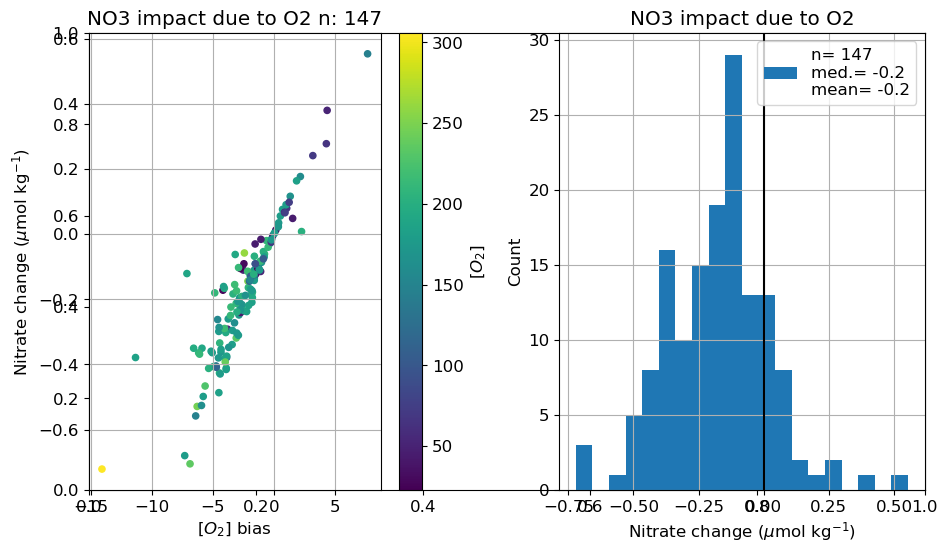

In [32]:
# unused? 

# Figure plotting
# Nitrate impact plot

fig = plt.subplots(figsize=(10,6))

plt.subplot(121)
pos = plt.scatter(o2_impact_no3['o2_bias'], o2_impact_no3['no3_impact'], 20, o2_impact_no3['o2_conc'])
plt.title('NO3 impact due to O2' + ' n: ' + str(len(o2_impact_no3['o2_conc'])))
plt.ylabel(r'Nitrate change ($\mu$mol kg$^{-1}$)')
plt.xlabel('$[O_{2}]$ bias')

cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()


plt.subplot(122)
nmedian = np.around(o2_impact_no3['no3_impact'].median(), decimals=1)
nmean = np.around(o2_impact_no3['no3_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_no3['no3_impact'], bins=20, label='n= ' + str(o2_impact_no3['no3_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('NO3 impact due to O2')
plt.xlabel(r'Nitrate change ($\mu$mol kg$^{-1}$)')# plt.xlabel(r'DOXY Offset ($\mu$mol kg$^{-1}$)')

plt.ylabel('Count')
plt.grid()

plt.axvline(x=0, color='k')
plt.legend()
plt.tight_layout()
# plt.show()

if air_cal_only==True:
    plot_filename = 'Fig_S3 NO3 impacts due to O2 bias - scatter plot - air_cal_only'
else:
    plot_filename = 'Fig_S3 impacts due to O2 bias - scatter plot - all pH floats'

plt.savefig(manuscript_figs + plot_filename + code_ver + plot_ver + '.png', dpi=300)


### Figure 5. pH and pCO2 impacts

0
1
2


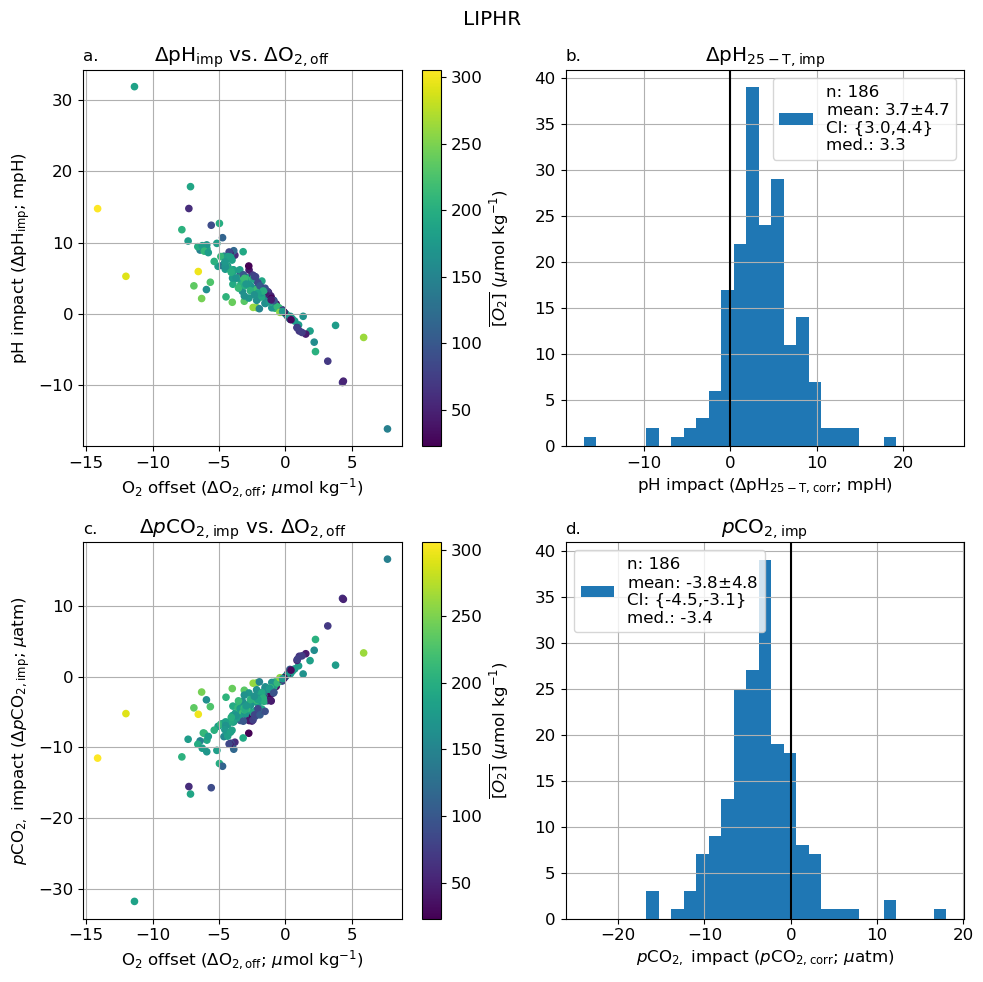

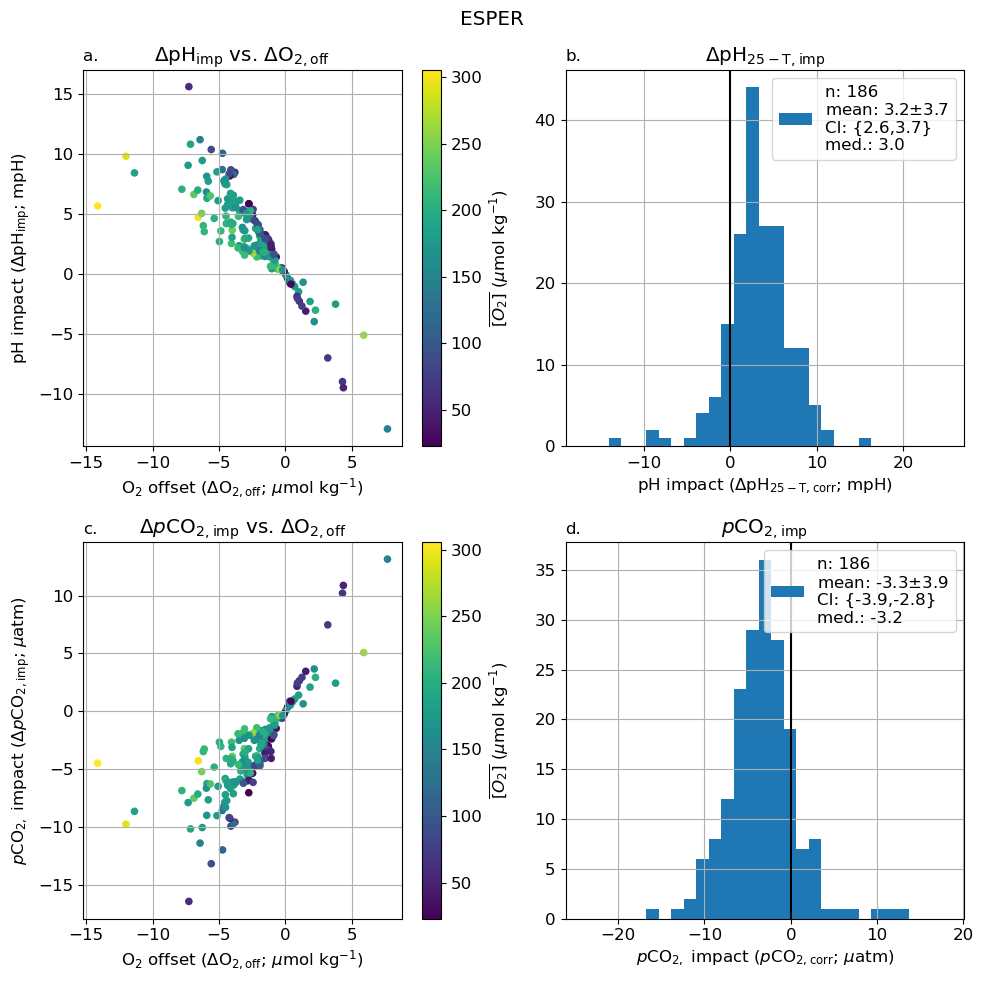

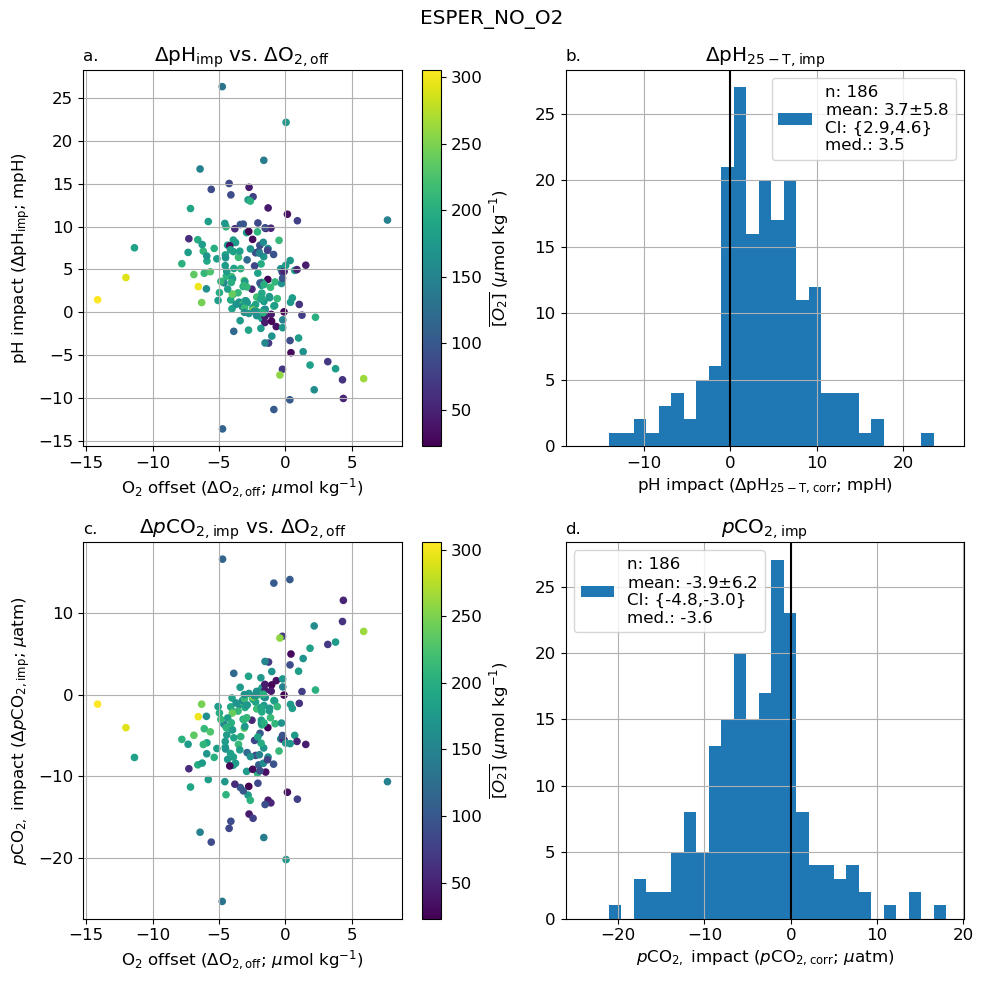

In [74]:
CI_level = 0.95

pH_types = ['LIPHR', 'ESPER', 'ESPER_NO_O2']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'
pH_pCO2 = ['pH_impact','pCO2_impact']

for idx, ph_alg in enumerate(pH_types):
    print(idx)
    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    elif ph_alg=='ESPER_NO_O2':
        pH_impact_data = no_o2_impact_direct_esper
    plot_filename = 'Fig_5 pH pCO2 impacts ' + air_cal_text + ' ' + ph_alg + code_ver + plot_ver

    fig = plt.subplots(2,2, figsize=(10,10))
    
    for v, var in enumerate(pH_pCO2):    
        ncount = pH_impact_data[var].count()
        if var=='pH_impact':
            scale = 1000
            x_label_units = 'mpH'
            fig_title = 'pH'
            delta_label = r'$\Delta$pH$_{\rm 25-T,}$'
            bin_vals = np.linspace(-17, 25, 30)
        else:
            scale = 1
            x_label_units = '$\mu$atm'
            fig_title = r'$\mathit{p}$CO$_{\rm 2,}$'
            delta_label = r'$\mathit{p}$' + r'CO$_{\rm 2,}$'
            bin_vals = np.linspace(-24, 18, 30)

        nmean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        nstd = np.around(pH_impact_data[var].std()*scale, decimals=1)
        nmedian = np.around(pH_impact_data[var].median()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        # t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

        CI_vals = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    
        plt.subplot(2,2,v+1+(v))
        
        pos = plt.scatter(pH_impact_data['o2_bias'], pH_impact_data[var]*scale, 20, pH_impact_data['o2_conc'])
        plt.title('$\Delta$' + fig_title + r'$_{\rm imp}$ vs. $\Delta$O$_{\rm 2,off}$')
        
        if v==0:
            plt.title('a.', loc='left', fontsize='medium')
        else:
            plt.title('c.', loc='left', fontsize='medium')

        plt.ylabel(fig_title + ' impact ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )
        plt.xlabel(r'O$_{2}$ offset ($\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$)')
        cbar = plt.colorbar(pos)
        cbar.set_label(r'$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
        plt.grid()
        
        plt.subplot(2,2,v+2+(v))

        pos = plt.hist(pH_impact_data[var]*scale, bins=bin_vals, 
                        label='n: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
                        '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed.: ' + str(nmedian))
        plt.title(delta_label + r'$_{\rm imp}$')
        if v==0:
            plt.title('b.', loc='left', fontsize='medium')
        else:
            plt.title('d.', loc='left', fontsize='medium')
        plt.xlabel(fig_title + ' impact (' + delta_label + r'$_{\rm corr}$; ' + x_label_units + ')' )
        plt.axvline(x=0, color='k')
        plt.legend()
        plt.grid()


    plt.suptitle(ph_alg)
    plt.tight_layout()

    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)



Table 1: oxygen impacts on derived paramters with statistics

In [75]:
pH_types = ['LIPHR', 'ESPER']
CI_level = 0.95
if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

pH_pCO2 = ['pH_impact','pCO2_impact']
for ph_alg in pH_types:
    o2_offset_data_table = []

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    
    for var in pH_pCO2:    
        ncount = pH_impact_data[var].count()
        o2_offset_mean = np.around(pH_impact_data['o2_bias'].mean(), decimals=1)

        if var=='pH_impact':
            scale = 1000
        else:
            scale = 1
        pH_impact_mean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        pH_impact_std = np.around(pH_impact_data[var].std()*scale, decimals=1)
        pH_impact_med = np.around(pH_impact_data[var].median()*scale, decimals=1)
        pH_impact_min = np.around(pH_impact_data[var].min()*scale, decimals=1)
        pH_impact_max = np.around(pH_impact_data[var].max()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
        if p_value>.001:
            p_value = np.around(p_value, decimals=3)
        else:
            p_value = '<0.001'
        CI_vals = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))

        o2_offset_data_table.append((var, ncount, pH_impact_mean, pH_impact_std, p_value, 
                                     np.around(CI_vals[0]*scale, decimals=1), np.around(CI_vals[1]*scale, decimals=1), 
                                                                                        pH_impact_med, pH_impact_min, pH_impact_max))
    print(ph_alg)
    
    print(tabulate(o2_offset_data_table, ['O2 offset=' + str(o2_offset_mean), 'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))
    
    
    headers= ['O2 offset=' + str(o2_offset_mean), 'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_1_' + ph_alg + code_ver + air_cal_text, 'Table 1.Statistics for pH 25C total (1500 db), and pCO2 (surface) impacts', headers, o2_offset_data_table)


LIPHR
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.5   |   Count |   Mean |   SD | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+==================+=========+========+======+===========+================+=================+==========+=======+=======+
| pH_impact        |     186 |    3.7 |  4.7 | <0.001    |            3   |             4.4 |      3.3 | -16.2 |  31.9 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| pCO2_impact      |     186 |   -3.8 |  4.8 | <0.001    |           -4.5 |            -3.1 |     -3.4 | -31.8 |  16.6 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
ESPER
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.5   |

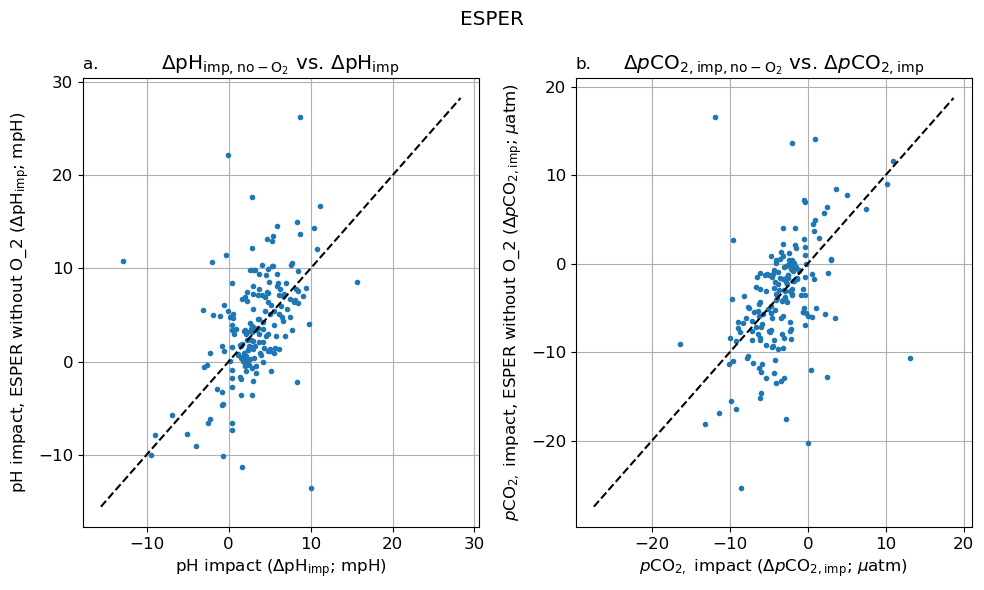

In [76]:
# plotting pH impact of ESPER vs pH impact of ESPER w/o O2 as an input

pH_impact_data = o2_impact_direct_esper
pH_impact_data_no_o2 = no_o2_impact_direct_esper
plot_filename = 'Fig_SQQ pH pCO2 impacts ' + air_cal_text + ' ESPER vs ESPER wo O2 ' + code_ver + plot_ver

fig = plt.subplots(1,2, figsize=(10,6))
    
pH_pCO2 = ['pH_impact','pCO2_impact']

for v, var in enumerate(pH_pCO2):    
    # ncount = pH_impact_data[var].count()
    if var=='pH_impact':
        scale = 1000
        x_label_units = 'mpH'
        fig_title = 'pH'
        delta_label = r'$\Delta$pH$_{\rm 25-T,}$'
        bin_vals = np.linspace(-17, 25, 30)
    else:
        scale = 1
        x_label_units = '$\mu$atm'
        fig_title = r'$\mathit{p}$CO$_{\rm 2,}$'
        delta_label = r'$\mathit{p}$' + r'CO$_{\rm 2,}$'
        bin_vals = np.linspace(-24, 18, 30)

    # nmean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
    # nstd = np.around(pH_impact_data[var].std()*scale, decimals=1)
    # nmedian = np.around(pH_impact_data[var].median()*scale, decimals=1)

    temp_var = pH_impact_data[var]
    temp_var = pd.to_numeric(temp_var, errors='coerce')

    # t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

    # CI_vals = stats.norm.interval(confidence=CI_level, 
    #                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
    #                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
    # CI_low = np.around(CI_vals[0]*scale, decimals=1)
    # CI_high = np.around(CI_vals[1]*scale, decimals=1)

    plt.subplot(1,2,v+1)
    pos = plt.plot(pH_impact_data[var]*scale, pH_impact_data_no_o2[var]*scale, '.')
    plt.title('$\Delta$' + fig_title + r'$_{\rm imp, no-O_2}$ vs. $\Delta$' + fig_title + r'$_{\rm imp}$')
    y_limits = plt.ylim()
    plt.plot(y_limits, y_limits, '--k')
    if v==0:
        plt.title('a.', loc='left', fontsize='medium')
    else:
        plt.title('b.', loc='left', fontsize='medium')

    plt.ylabel(fig_title + ' impact, ESPER without O_2 ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )
    plt.xlabel(fig_title + ' impact ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )

    # plt.xlabel(r'O$_{2}$ offset ($\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$)')
    # cbar = plt.colorbar(pos)
    # cbar.set_label(r'$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # plt.grid()
    
    # plt.subplot(2,2,v+2+(v))

    # pos = plt.hist(pH_impact_data[var]*scale, bins=bin_vals, 
    #                 label='n: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
    #                 '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed.: ' + str(nmedian))
    # plt.title(delta_label + r'$_{\rm imp}$')
    # if v==0:
    #     plt.title('b.', loc='left', fontsize='medium')
    # else:
    #     plt.title('d.', loc='left', fontsize='medium')
    # plt.xlabel(fig_title + ' impact (' + delta_label + r'$_{\rm corr}$; ' + x_label_units + ')' )
    # plt.axvline(x=0, color='k')
    # plt.legend()
    plt.grid()


    plt.suptitle(ph_alg)
    plt.tight_layout()

plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

### DIC impacts at surface and at depth - supplemental figure/table

In [69]:
o2_impact_direct_esper[np.isnan(o2_impact_direct_esper['dic_impact_1500'])]

,o2_bias,pH_impact,pCO2_impact,dic_impact_surf,dic_impact_1500,o2_conc,long,lat,wmo
2,-3.095185,0.002909,-3.233606,-1.762183,NaN,232.535858,-51.906578,25.882830,5906340
8,-2.872512,0.004835,-5.480425,-1.758190,NaN,173.782867,-93.730858,-58.764255,5906553
10,1.046204,-0.002248,2.635300,1.151329,NaN,66.352486,-152.317281,13.538941,5906471
14,-3.752350,0.005857,-6.080488,-2.206116,NaN,176.753784,-63.980150,-55.753640,5906562
16,-1.482094,0.003237,-3.168279,-1.596556,NaN,33.770130,177.945296,35.638063,2903862
18,-4.625566,0.007778,-8.182654,-4.278750,NaN,154.361542,-149.925549,-26.573702,5906570
19,0.704120,-0.001034,1.063979,0.485431,NaN,177.998245,2.918223,-40.609893,5906525
32,-2.043100,0.004142,-4.058730,-1.539312,NaN,180.580246,-91.615537,-61.913378,5906314
37,-2.517374,0.004610,-5.359431,-2.185182,NaN,53.006573,-132.471084,29.836666,5906523
38,-2.774184,0.003012,-3.237642,-1.102198,NaN,186.666534,88.430739,-49.642391,5906207


LIPHR
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.5   |   Count |   Mean |   SD | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+==================+=========+========+======+===========+================+=================+==========+=======+=======+
| dic_impact_surf  |     186 |   -1.6 |  2   | <0.001    |          -1.88 |           -1.29 |     -1.5 | -11.2 |   7.4 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| dic_impact_1500  |     154 |   -1.3 |  1.5 | <0.001    |          -1.51 |           -1.03 |     -1.1 | -10.8 |   5.1 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
ESPER
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.5   |

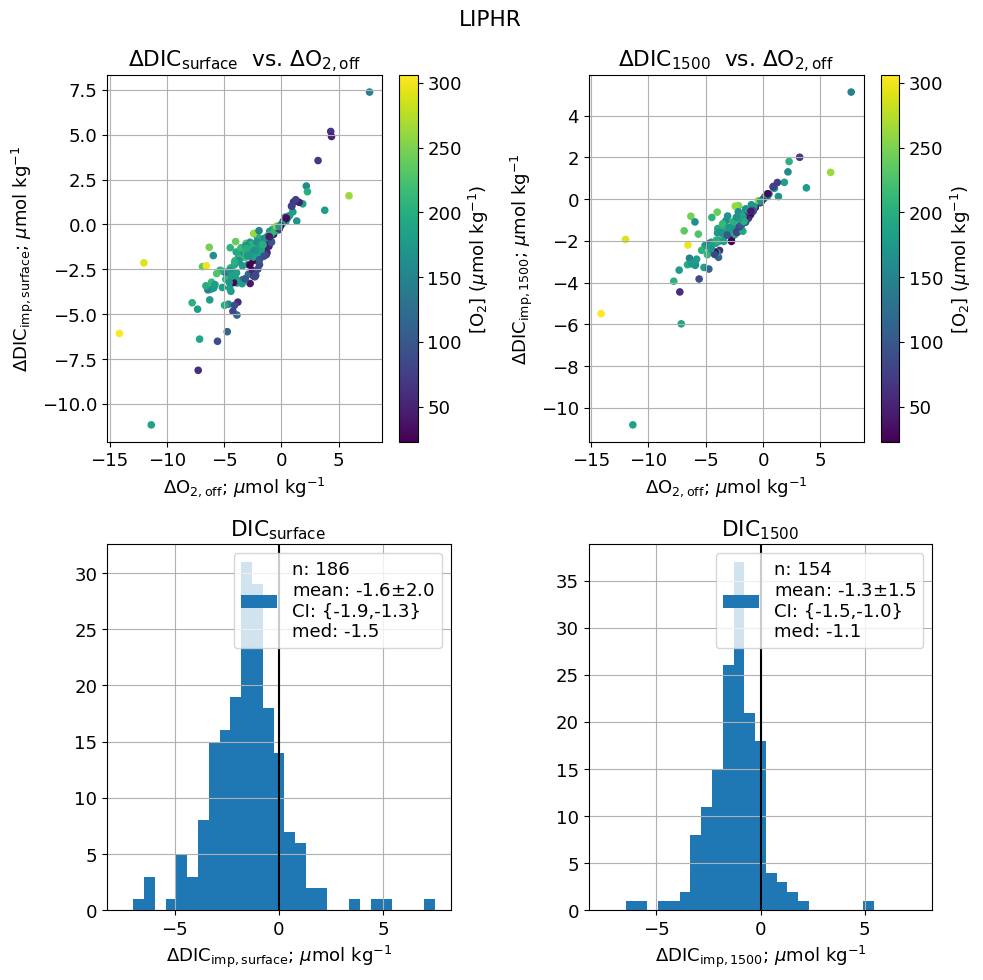

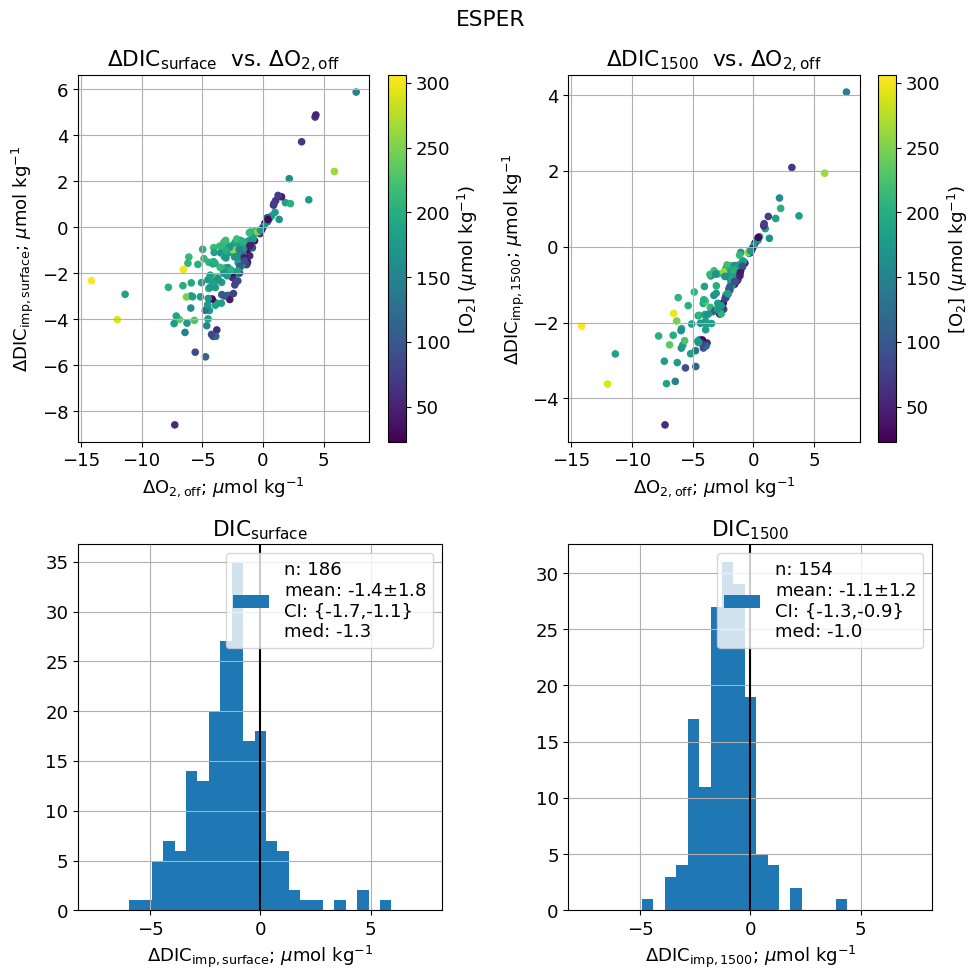

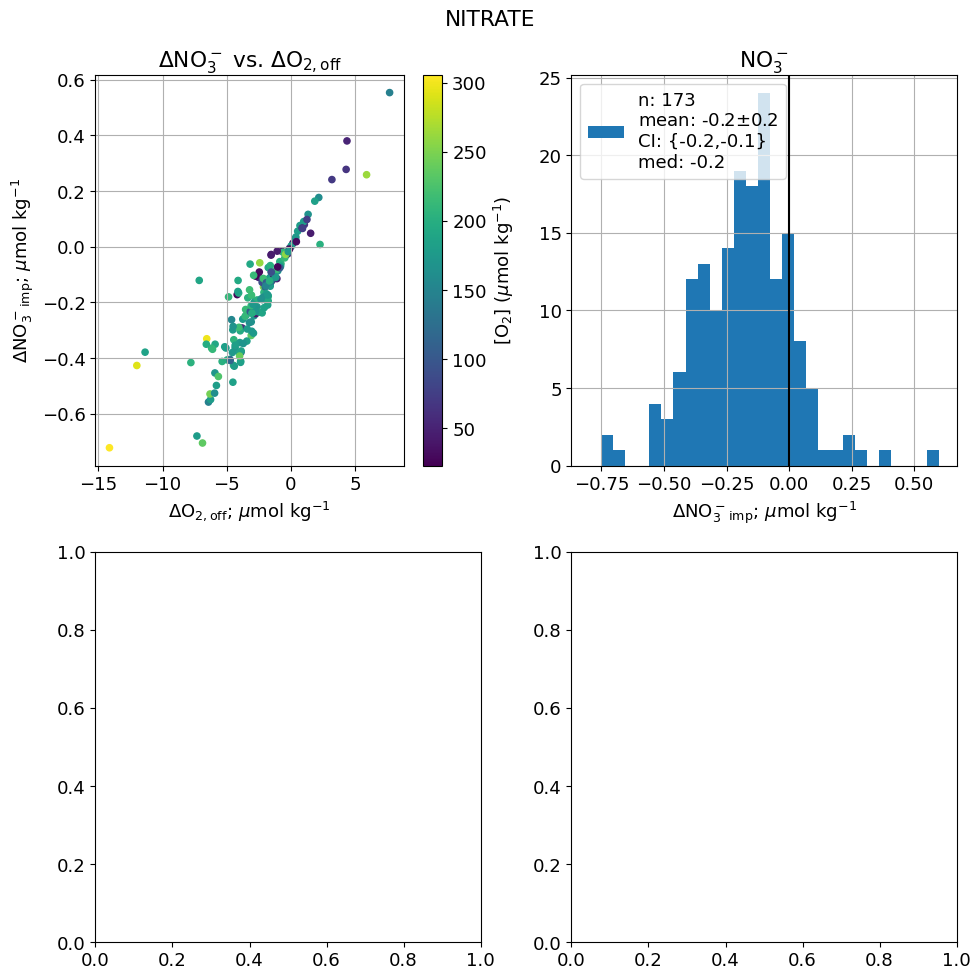

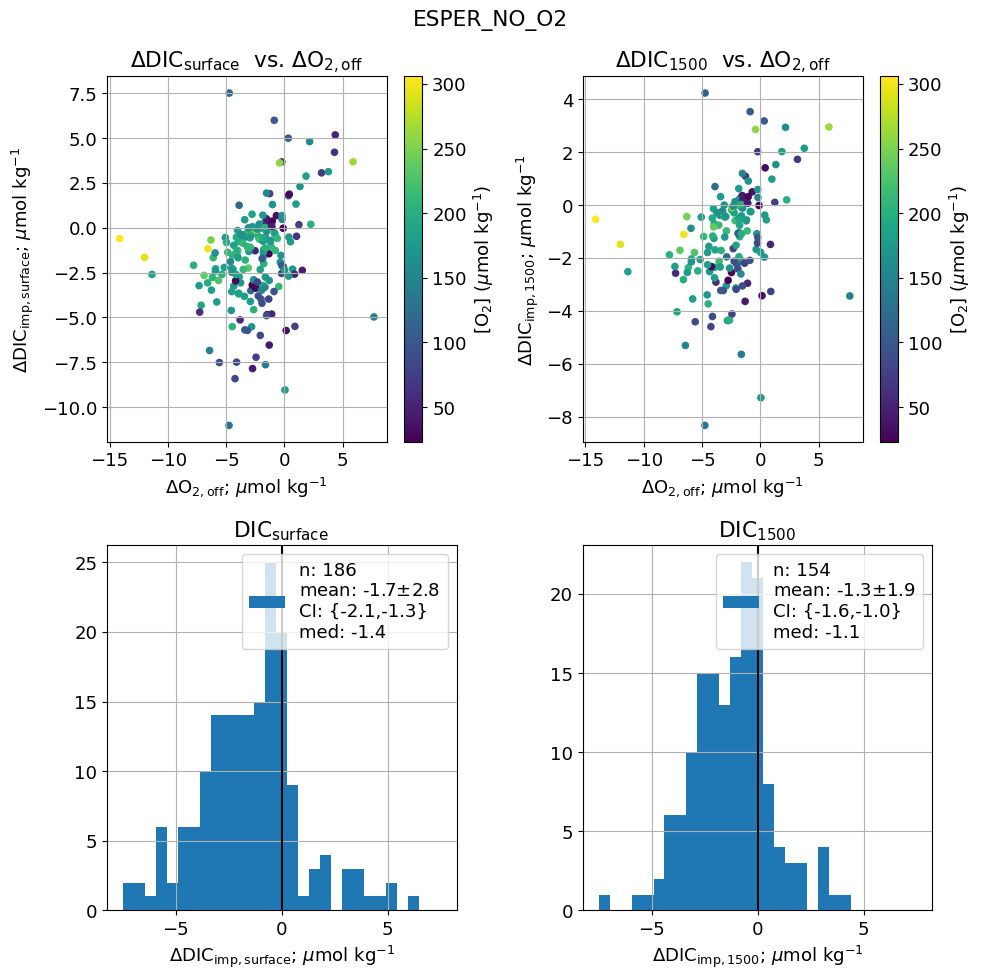

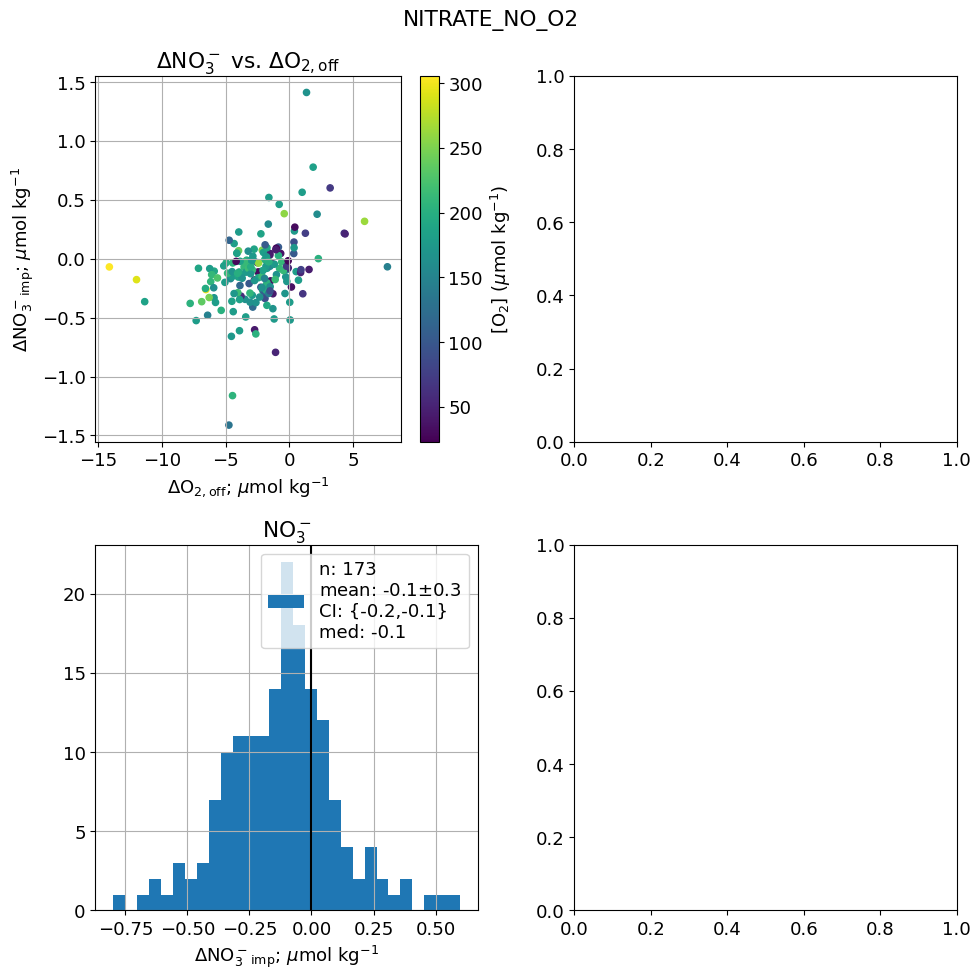

In [103]:
pH_types = ['LIPHR', 'ESPER','NITRATE', 'ESPER_NO_O2','NITRATE_NO_O2']
CI_level = 0.95
air_cal_only=True
if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:
    o2_offset_data_table = []

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='ESPER_NO_O2':
        pH_impact_data = no_o2_impact_direct_esper
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='NITRATE':
        pH_impact_data = o2_impact_no3
        pH_pCO2 = ['no3_impact']
        bin_vals = np.linspace(-0.8, 0.6, 30)
    elif ph_alg=='NITRATE_NO_O2':
        pH_impact_data = no_o2_impact_no3
        pH_pCO2 = ['no3_impact']
        bin_vals = np.linspace(-0.8, 0.6, 30)

    fig = plt.subplots(2,2, figsize=(10,10))
    plot_filename = 'Fig_SXX DIC impacts ' + air_cal_text + ' ' + ph_alg + code_ver + plot_ver

    for idx, var in enumerate(pH_pCO2):    
        ncount = pH_impact_data[var].count()
        o2_offset_mean = np.around(pH_impact_data['o2_bias'].mean(), decimals=1)

        if var=='pH_impact':
            scale = 1000
        else:
            scale = 1
        
        if var=='dic_impact_surf':
            fig_title = 'DIC' + r'$_{\rm surface}$ '
            x_lab = '$\Delta$DIC' + r'$_{\rm imp,surface}$; ' + '$\mu$mol kg$^{-1}$'

        elif var=='dic_impact_1500':
            fig_title = 'DIC' + r'$_{\rm 1500}$ '
            x_lab = '$\Delta$DIC' + r'$_{\rm imp,1500}$; ' + '$\mu$mol kg$^{-1}$'

        elif var=='no3_impact':
            fig_title='NO$_3^-$'
            x_lab = '$\Delta$NO$_3^-$' + r'$_{\rm imp}$; ' + '$\mu$mol kg$^{-1}$'


        pH_impact_mean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        pH_impact_std = np.around(pH_impact_data[var].std()*scale, decimals=1)
        pH_impact_med = np.around(pH_impact_data[var].median()*scale, decimals=1)
        pH_impact_min = np.around(pH_impact_data[var].min()*scale, decimals=1)
        pH_impact_max = np.around(pH_impact_data[var].max()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
        if p_value>.001:
            p_value = np.around(p_value, decimals=3)
        else:
            p_value = '<0.001'

        CI_vals = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    
        o2_offset_data_table.append((var, ncount, pH_impact_mean, pH_impact_std, p_value, 
                                     np.around(CI_vals[0]*scale, decimals=2), np.around(CI_vals[1]*scale, decimals=2), 
                                                                                        pH_impact_med, pH_impact_min, pH_impact_max))
        plt.subplot(2,2,idx+1)
        pos = plt.scatter(pH_impact_data['o2_bias'], pH_impact_data[var], 20, pH_impact_data['o2_conc'])
        plt.title('$\Delta$' + fig_title + ' vs. ' + r'$\Delta$O$_{\rm 2,off}$')

        plt.ylabel(x_lab)
        plt.xlabel(r'$\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$')
        cbar = plt.colorbar(pos)
        cbar.set_label(r'[O$_2$] ($\mu$mol kg$^{-1}$)')
        plt.grid()


        if ph_alg=='NITRATE':
            plt.subplot(2,2, idx + 2)

        else:
            plt.subplot(2,2, idx + 3)
        # nmedian = np.around(pH_impact_data[var].median(), decimals=1)
        # nmean = np.around(pH_impact_data[var].mean(), decimals=1)

        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    

        pos = plt.hist(pH_impact_data[var], 
                       bins=bin_vals,
                       label='n: '+str(ncount) +  '\nmean: ' + str(pH_impact_mean) + '$\pm$' + str(pH_impact_std) + 
                        '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed: ' + str(pH_impact_med))
        
                # label='n= ' + str(pH_impact_data[var].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) ) #  
        plt.title(fig_title)
        plt.xlabel(x_lab)
        plt.axvline(x=0, color='k')
        plt.legend()
        plt.grid()

    print(ph_alg)
    
    print(tabulate(o2_offset_data_table, ['O2 offset=' + str(o2_offset_mean), 
                                          'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', 
                                          str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

    
    plt.suptitle(ph_alg)
    plt.tight_layout()

    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

    headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_SXX' + ph_alg + code_ver, 'Table SXX.Statistics for ' + ph_alg, headers, o2_offset_data_table)



### Figure 6: Maps of offsets and impacts

LIPHR
min pH impact per umol kg-1 O2: -2.8096217865132327
max pH impact per umol kg-1 O2: -0.2791984981347279
ESPER
min pH impact per umol kg-1 O2: -2.3273741806017174
max pH impact per umol kg-1 O2: -0.401919929378776


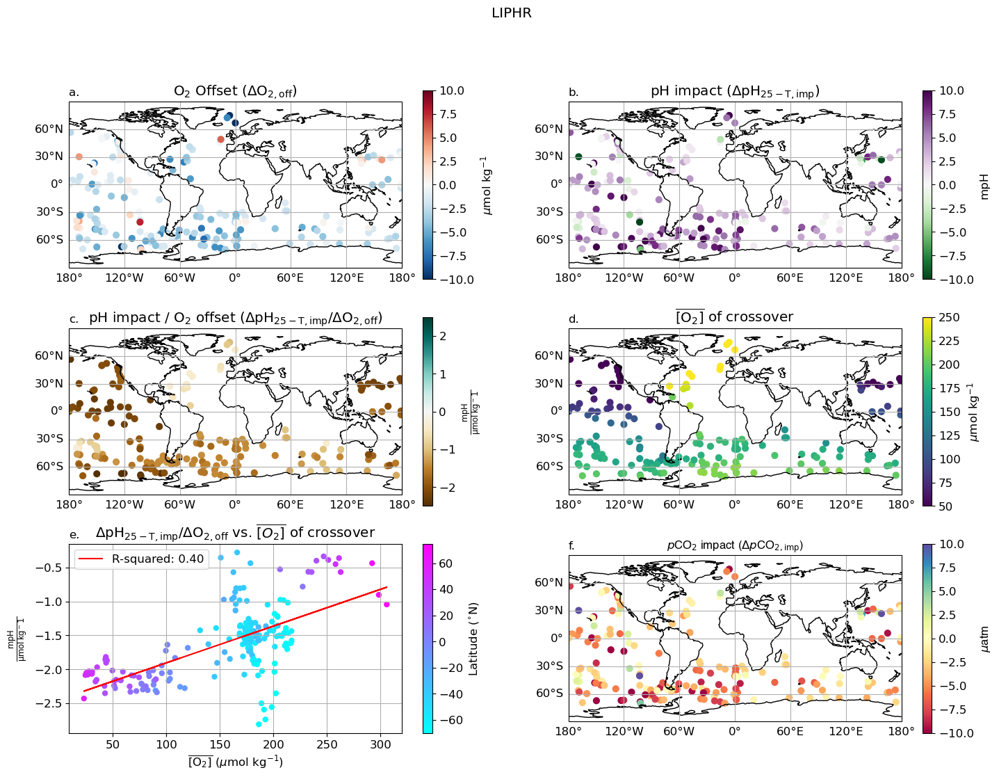

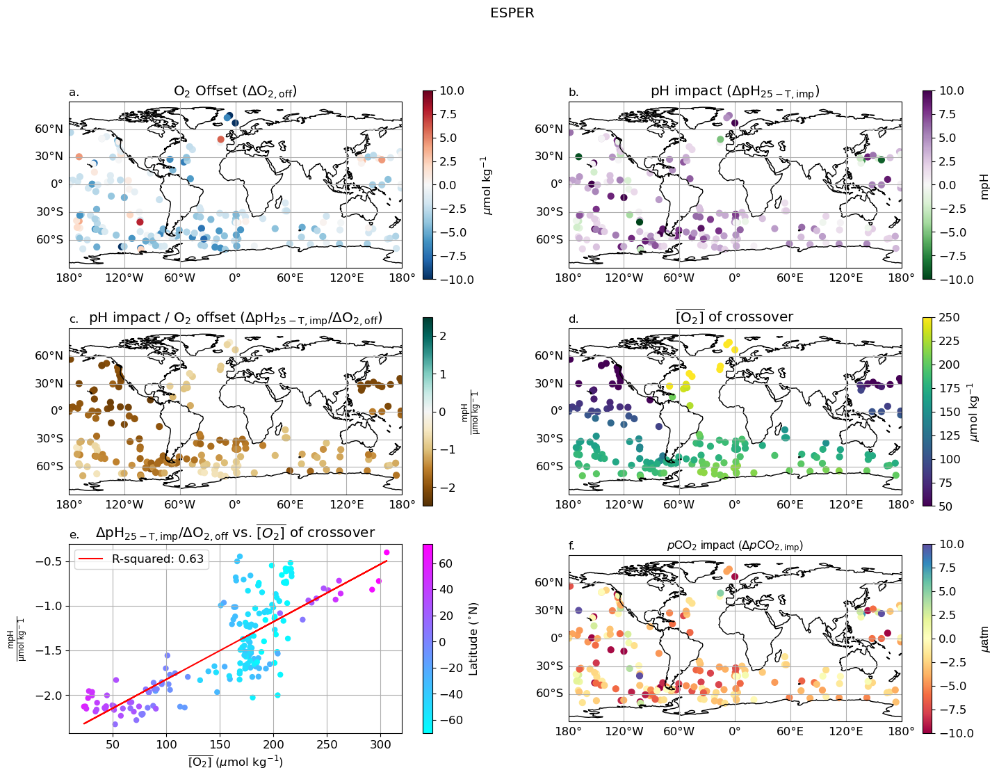

In [78]:

plt.rcParams["font.family"] = 'sans-serif'
plt.rcParams["font.serif"] = 'Helvetica'

c_bar_font_size = 12
title_font_size = 12

pH_types = ['LIPHR', 'ESPER']
# pH_types = ['LIPHR']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    


    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    fig = plt.figure(figsize=(17, 12))
    gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
           fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
           fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
           fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
           fig.add_subplot(gs[2, 0]),
           fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # initialize and label subplots
    for i, ax in enumerate(axs):
        if i==4:
            continue
        else:
            ax.coastlines()
            ax.set_global()
            gl = ax.gridlines(draw_labels=True)
            gl.right_labels = False
            gl.top_labels = False

            # ax.set_title('Normal Title', font='helvetica')
            # ax.set_title(label, loc='left', fontsize='medium', font='helvetica')

    # Oxygen offset
    sct = axs[0].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[0].set_title(r'O$_2$ Offset ($\Delta$O$_{\rm 2,off}$)')
    axs[0].set_title('a.', loc='left', fontsize='medium')

    # pH impact
    sct = axs[1].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['pH_impact']*1000, cmap='PRGn_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=5, fontsize=c_bar_font_size)
    axs[1].set_title(r'pH impact ($\Delta$pH$_{\rm 25-T,imp}$)')
    axs[1].set_title('b.', loc='left', fontsize='medium')

    # map of dpH to o2 offset
    axs[2].set_title(r'pH impact / O$_2$ offset ($\Delta$pH$_{\rm 25-T,imp}$/$\Delta$O$_{\rm 2,off}$)')

    sct = axs[2].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='BrBG',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    # cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=5, fontsize=c_bar_font_size)
    # cbar.set_label(r'$\frac{mpH}{\mu\text{mol kg}^{-1}}$', labelpad=5, fontsize=c_bar_font_size)
    cbar.set_label(r'$\frac{\rm mpH}{{\mu}mol{\,} kg^-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[2].set_title('c.', loc='left', fontsize='medium')


    # mean oxygen at crossover
    axs[3].set_title(r'$\overline{\rm [O_2]}$ of crossover')
    sct = axs[3].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[3].set_title('d.', loc='left', fontsize='medium')

    #scatter of dpH to O2 offset
    # fig.delaxes(axs['e.'])
    # ax = plt.subplot(325)
    axs[4].set_title(r'$\Delta$pH$_{\rm 25-T,imp}$/$\Delta$O$_{\rm 2,off}$ vs. $\overline{[O_2]}$ of crossover')
    axs[4].set_title('e.', loc='left', fontsize='medium')

    # plt.title('$\Delta$pH/O$_2$ vs. $\overline{[O_2]}$ of crossover')
    # ax.set_title('e.', loc='left', fontsize='medium', font='helvetica')
    # axs[4].plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
    #             linestyle='None', marker='x')
    sc = axs[4].scatter(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], 25, pH_impact_data['lat'],
                linestyle='None', marker='o', cmap='cool')
    cbar = plt.colorbar(sc)
    cbar.set_label('Latitude ($^{\circ}$N)', labelpad=5, fontsize=c_bar_font_size)

    print(ph_alg)
    print('min pH impact per umol kg-1 O2: ' + str(np.nanmin((pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])))
    print('max pH impact per umol kg-1 O2: ' + str(np.nanmax((pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])))

    res = stats.linregress(pH_impact_data['o2_conc'], 
                            (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    axs[4].plot(pH_impact_data['o2_conc'], 
                res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
                
    axs[4].set_ylabel(r'$\frac{\rm mpH}{{\mu}mol{\,} kg^-1}$')
    axs[4].set_xlabel(r'$\overline{\rm [O_2]}$ ($\mu$mol kg$^{-1}$)')
    # axs[4].set
    # Get the x-limit values
    # x_limits = plt.xlim()
    # y_limits = plt.ylim()
    axs[4].grid('on')
    axs[4].legend(loc='upper left')

    # pCO2 impact
    axs[5].set_title(r'$\mathit{p}$CO$_2$ impact ($\Delta$$\mathit{p}$CO$_{\rm 2,imp}$)', font='helvetica')
    sct = axs[5].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['pCO2_impact'], cmap='Spectral',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')
    axs[5].set_title('f.', loc='left', fontsize='medium')

    plt.suptitle(ph_alg)

    plt.tight_layout
    plt.savefig(manuscript_figs + plot_filename + code_ver + plot_ver + '.png', dpi=600)


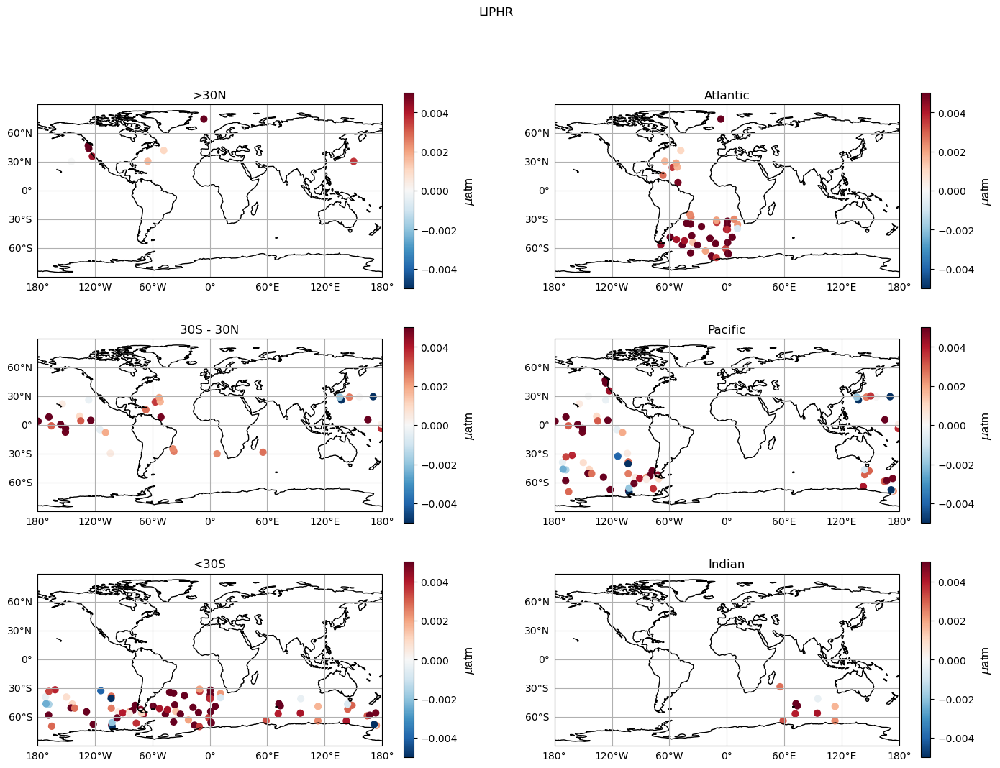

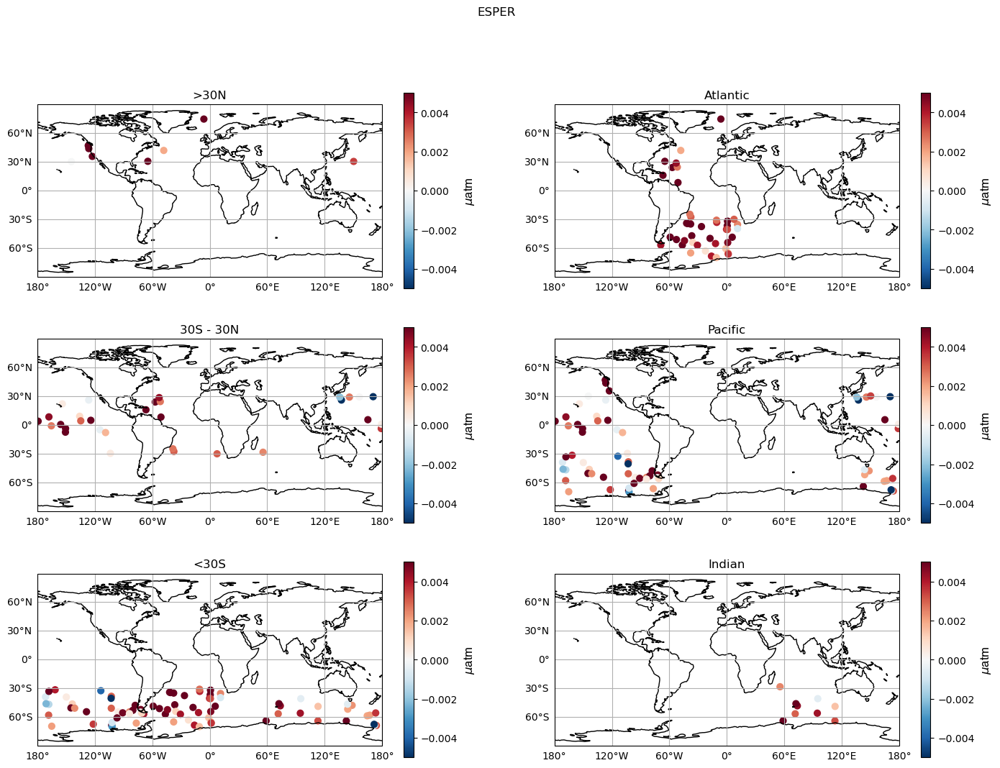

In [49]:
# calculating offsets/impacts regionally
pH_types = ['LIPHR', 'ESPER']
c_bar_font_size = 12

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
            
    # use lat/lon to create indexes of different regions
    regions = ['>30N','Atlantic', '30S - 30N', 'Pacific', '<30S',   'Indian']



    # maps to make sure you have the breakdown correct:
    fig = plt.figure(figsize=(17, 12))
    gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
            fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
            fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # initialize and label subplots
    for i, ax in enumerate(axs):
        ax.coastlines()
        ax.set_global()
        gl = ax.gridlines(draw_labels=True)
        gl.right_labels = False
        gl.top_labels = False

    for idx, reg in enumerate(regions):
        if reg=='>30N':
            geo_index = pH_impact_data['lat']>30
        elif reg=='30S - 30N':
            geo_index = np.logical_and(pH_impact_data['lat']<30, pH_impact_data['lat']>-30)
        elif reg=='<30S':
            geo_index = pH_impact_data['lat']<-30
        elif reg=='Atlantic':
            geo_index = np.logical_and(pH_impact_data['long']<40, pH_impact_data['long']>-70)
        elif reg=='Pacific':
            geo_index = np.logical_or(pH_impact_data['long']<-70, pH_impact_data['long']>120)
        elif reg=='Indian':
            geo_index = np.logical_and(pH_impact_data['long']>40, pH_impact_data['long']<120)
    
        axs[idx].set_title(reg)

        sct = axs[idx].scatter(pH_impact_data['long'][geo_index], pH_impact_data['lat'][geo_index],
                        c=pH_impact_data['pH_impact'][geo_index], cmap='RdBu_r',s=40,vmin=-.005,vmax=.005)
        cbar = plt.colorbar(sct)
        cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')

    plt.suptitle(ph_alg)

   


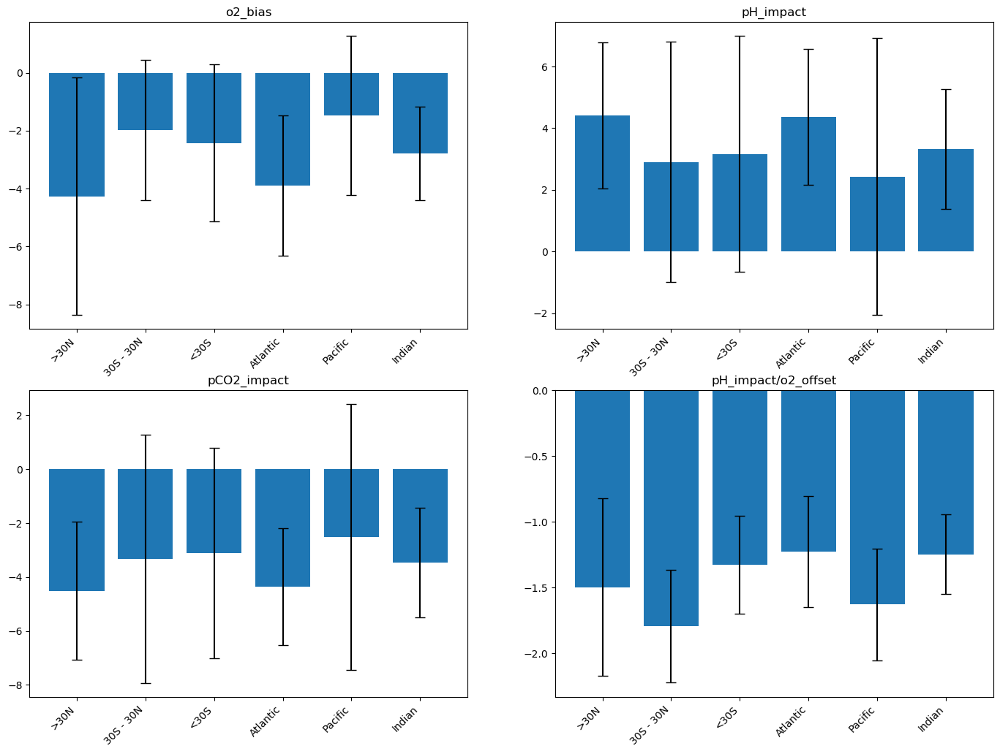

In [46]:
# bar plot by region
pH_types = ['ESPER']
c_bar_font_size = 12

plot_types = ['o2_bias', 'pH_impact', 'pCO2_impact', 'pH_impact/o2_offset']

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
            
    # use lat/lon to create indexes of different regions
    regions = ['>30N','30S - 30N', '<30S', 'Atlantic',  'Pacific',   'Indian']



    # maps to make sure you have the breakdown correct:
    fig = plt.figure(figsize=(17, 12))

    for plot_num, par in enumerate(plot_types):
        ax = fig.add_subplot(2,2,plot_num+1)
        means = []
        stds = []
        for idx, reg in enumerate(regions):
            if reg=='>30N':
                geo_index = pH_impact_data['lat']>30
            elif reg=='30S - 30N':
                geo_index = np.logical_and(pH_impact_data['lat']<30, pH_impact_data['lat']>-30)
            elif reg=='<30S':
                geo_index = pH_impact_data['lat']<-30
            elif reg=='Atlantic':
                geo_index = np.logical_and(pH_impact_data['long']<40, pH_impact_data['long']>-70)
            elif reg=='Pacific':
                geo_index = np.logical_or(pH_impact_data['long']<-70, pH_impact_data['long']>120)
            elif reg=='Indian':
                geo_index = np.logical_and(pH_impact_data['long']>40, pH_impact_data['long']<120)

            if par=='pH_impact/o2_offset':
                reg_mean = np.nanmean((pH_impact_data['pH_impact'][geo_index]*1000)/pH_impact_data['o2_bias'][geo_index])
                reg_std = np.nanstd((pH_impact_data['pH_impact'][geo_index]*1000)/pH_impact_data['o2_bias'][geo_index])
            elif par =='pH_impact' :
                reg_mean = np.nanmean(pH_impact_data[par][geo_index])*1000
                reg_std = np.nanstd(pH_impact_data[par][geo_index])   *1000
            else:
                reg_mean = np.nanmean(pH_impact_data[par][geo_index])
                reg_std = np.nanstd(pH_impact_data[par][geo_index])   

            means.append(reg_mean)
            stds.append(reg_std)
        x = np.arange(len(regions))
        ax.bar(x, means, yerr=stds, capsize=5)
        ax.set_xticks(x)
        ax.set_xticklabels(regions, rotation=45, ha='right')
        ax.set_title(par)

        
    # gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    # axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
    #         fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
    #         fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # # initialize and label subplots
    # for i, ax in enumerate(axs):
    #     ax.coastlines()
    #     ax.set_global()
    #     gl = ax.gridlines(draw_labels=True)
    #     gl.right_labels = False
    #     gl.top_labels = False

   
    
    #     axs[idx].set_title(reg)

    #     sct = axs[idx].scatter(pH_impact_data['long'][geo_index], pH_impact_data['lat'][geo_index],
    #                     c=pH_impact_data['o2_bias'][geo_index], cmap='RdBu_r',s=40,vmin=-10,vmax=10)
    #     cbar = plt.colorbar(sct)
    #     cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')

    # plt.suptitle(ph_alg)

### Deprecated

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_39651/275399132.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(331)


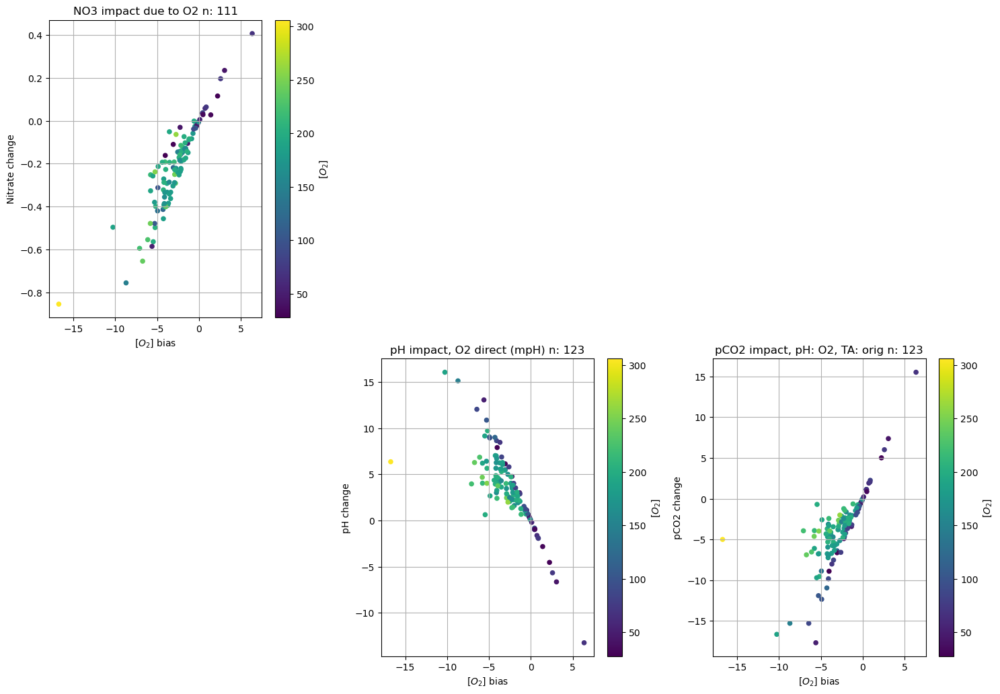

In [34]:
# plotting total impacts from various combination of factors
fig = plt.subplots(figsize=(15,15))

plt.subplot(331)
pos = plt.scatter(o2_impact_no3['o2_bias'], o2_impact_no3['no3_impact'], 20, o2_impact_no3['o2_conc'])
plt.title('NO3 impact due to O2' + ' n: ' + str(len(o2_impact_no3['o2_conc'])))
plt.ylabel('Nitrate change')
plt.xlabel('$[O_{2}]$ bias')

cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

# plt.subplot(332)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['pH_impact']*1000, 20, o2_impact_no3_alone['o2_conc'])
# plt.title('pH impact, NO3 alone (mpH)'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pH change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(443)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['TA_impact'], 20, o2_impact_no3_alone['o2_conc'])
# plt.title('TA impact, NO3 alone')
# plt.ylabel('TA change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(333)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['pCO2_impact'], 20, o2_impact_no3_alone['o2_conc'])
# plt.title('pCO2 impact, pH: NO3, TA: orig'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()


plt.subplot(335)
pos = plt.scatter(o2_impact_direct_esper['o2_bias'], o2_impact_direct_esper['pH_impact']*1000, 20, o2_impact_direct_esper['o2_conc'])
plt.title('pH impact, O2 direct (mpH)'+ ' n: ' + str(len(o2_impact_direct_esper['o2_conc'])))
plt.ylabel('pH change')
plt.xlabel('$[O_{2}]$ bias')
cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

plt.subplot(336)
pos = plt.scatter(o2_impact_direct_esper['o2_bias'], o2_impact_direct_esper['pCO2_impact'], 20, o2_impact_direct_esper['o2_conc'])
plt.title('pCO2 impact, pH: O2, TA: orig'+ ' n: ' + str(len(o2_impact_direct_esper['o2_conc'])))
plt.ylabel('pCO2 change')
plt.xlabel('$[O_{2}]$ bias')
cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

# plt.subplot(338)
# pos = plt.scatter(o2_no3_impact_pH['o2_bias'], o2_no3_impact_pH['pH_impact']*1000, 20, o2_no3_impact_pH['o2_conc'])
# plt.title('pH impact, O2, NO3 (mpH)'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pH change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(339)
# pos = plt.scatter(o2_no3_impact_pH['o2_bias'], o2_no3_impact_pH['pCO2_impact'], 20, o2_no3_impact_pH['o2_conc'])
# plt.title('pCO2 impact, pH: O2, NO3 TA: orig'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(4,4, 16)
# pos = plt.scatter(o2_no3_impact_pH_TA['o2_bias'], o2_no3_impact_pH_TA['pCO2_impact'], 20, o2_no3_impact_pH_TA['o2_conc'])
# plt.title('pCO2 impact, pH: O2, NO3 TA: NO3')
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

plt.tight_layout()

if air_cal_only==True:
    plot_filename = 'BGC impacts due to O2 bias - scatter plot - air_cal_only_ESPERv2'
else:
    plot_filename = 'BGC impacts due to O2 bias - scatter plot - all pH floats_ESPERv2'

plt.savefig(output_dir_figs + plot_filename + '.png', dpi=300)



/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_39651/2695638367.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(331)


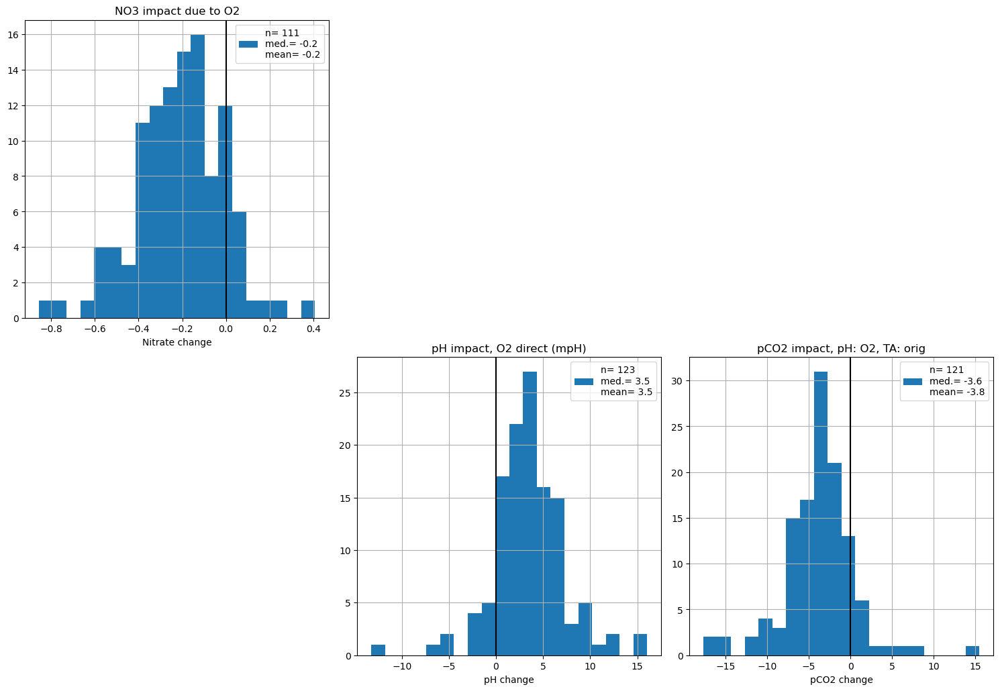

In [35]:
# plotting histograms of total impacts from various combination of factors
fig = plt.subplots(figsize=(15,15))

plt.subplot(331)
nmedian = np.around(o2_impact_no3['no3_impact'].median(), decimals=1)
nmean = np.around(o2_impact_no3['no3_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_no3['no3_impact'], bins=20, label='n= ' + str(o2_impact_no3['no3_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('NO3 impact due to O2')
plt.xlabel('Nitrate change')
plt.grid()

plt.axvline(x=0, color='k')
plt.legend()

# plt.subplot(332)
# nmedian = np.around(o2_impact_no3_alone['pH_impact'].median()*1000, decimals=1)
# nmean = np.around(o2_impact_no3_alone['pH_impact'].mean()*1000, decimals=1)

# pos = plt.hist(o2_impact_no3_alone['pH_impact']*1000, bins=20, label='n= ' + str(o2_impact_no3_alone['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pH impact, NO3 alone (mpH)')
# plt.xlabel('pH change')
# plt.grid()
# plt.axvline(x=0, color='k')
# plt.legend()

# plt.subplot(443)
# nmedian = np.around(o2_impact_no3_alone['TA_impact'].median(), decimals=1)

# pos = plt.hist(o2_impact_no3_alone['TA_impact'], bins=20, label='n= ' + str(o2_impact_no3_alone['TA_impact'].count()) + '\nmed.= '+str(nmedian) )
# plt.title('TA impact, NO3 alone')
# plt.xlabel('TA change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(333)
# nmedian = np.around(o2_impact_no3_alone['pCO2_impact'].median(), decimals=1)
# nmean = np.around(o2_impact_no3_alone['pCO2_impact'].mean(), decimals=1)

# pos = plt.hist(o2_impact_no3_alone['pCO2_impact'], bins=20, label='n= ' + str(o2_impact_no3_alone['o2_bias'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pCO2 impact, pH: NO3, TA: orig')
# plt.ylabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()


plt.subplot(335)
nmedian = np.around(o2_impact_direct_esper['pH_impact'].median()*1000, decimals=1)
nmean = np.around(o2_impact_direct_esper['pH_impact'].mean()*1000, decimals=1)

pos = plt.hist(o2_impact_direct_esper['pH_impact']*1000, bins=20, label='n= ' + str(o2_impact_direct_esper['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('pH impact, O2 direct (mpH)')
plt.xlabel('pH change')
plt.axvline(x=0, color='k')
plt.legend()
plt.grid()

plt.subplot(336)
nmedian = np.around(o2_impact_direct_esper['pCO2_impact'].median(), decimals=1)
nmean = np.around(o2_impact_direct_esper['pCO2_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_direct_esper['pCO2_impact'], bins=20, label='n= ' + str(o2_impact_direct_esper['pCO2_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('pCO2 impact, pH: O2, TA: orig')
plt.xlabel('pCO2 change')
plt.axvline(x=0, color='k')
plt.legend()
plt.grid()

# plt.subplot(338)
# nmedian = np.around(o2_no3_impact_pH['pH_impact'].median()*1000, decimals=1)
# nmean= np.around(o2_no3_impact_pH['pH_impact'].mean()*1000, decimals=1)

# pos = plt.hist(o2_no3_impact_pH['pH_impact']*1000, bins=20, label='n= ' + str(o2_no3_impact_pH['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pH impact, O2, NO3 (mpH)')
# plt.xlabel('pH change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(339)
# nmedian = np.around(o2_no3_impact_pH['pCO2_impact'].median(), decimals=1)
# nmean = np.around(o2_no3_impact_pH['pCO2_impact'].mean(), decimals=1)

# pos = plt.hist(o2_no3_impact_pH['pCO2_impact'], bins=20, label='n= ' + str(o2_no3_impact_pH['pCO2_impact'].count()) + '\nmed.= '+str(nmedian)+ '\nmean= '+str(nmean) )
# plt.title('pCO2 impact, pH: O2, NO3 TA: orig')
# plt.xlabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(4,4, 16)
# nmedian = np.around(o2_no3_impact_pH_TA['pCO2_impact'].median(), decimals=1)

# pos = plt.hist(o2_no3_impact_pH_TA['pCO2_impact'], bins=20, label='n= ' + str(o2_no3_impact_pH_TA['pCO2_impact'].count()) + '\nmed.= '+str(nmedian) )
# plt.title('pCO2 impact, pH: O2, NO3 TA: NO3')
# plt.xlabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()

# plt.grid()
plt.tight_layout()
#plt.show()

if air_cal_only==True:
    plot_filename = 'BGC impacts due to O2 bias - histogram plot - air_cal_only_ESPERv2'
else:
    plot_filename = 'BGC impacts due to O2 bias - histogram plot - all pH floats_ESPERv2'


plt.savefig(output_dir_figs + plot_filename + '.png', dpi=300)



Plot maps of offsets for pH equipped floats: 

In [112]:
(o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias']

0     -0.738220
1     -1.316934
2     -1.202974
3     -0.815743
4     -1.862291
         ...   
118   -1.383782
119   -0.803081
120   -2.027008
121   -2.245241
122   -0.253676
Length: 123, dtype: float64

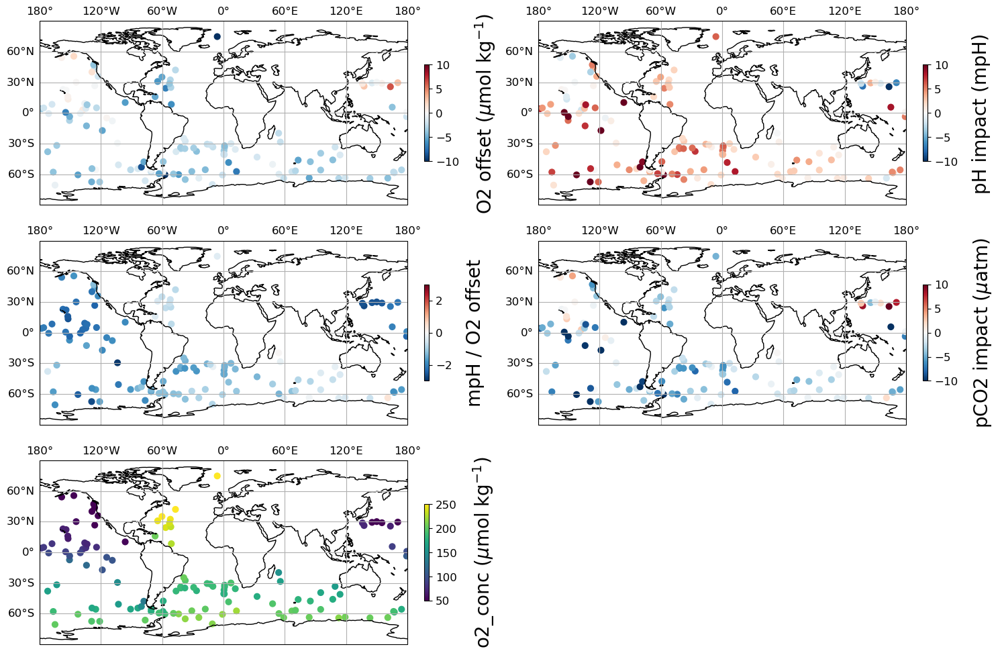

In [244]:
fig = plt.figure(figsize=(15, 10))

ax = plt.subplot(321, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False

sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15)

ax = plt.subplot(322, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('pH impact (mpH)', labelpad=15, fontsize=15)

ax = plt.subplot(323, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=(o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'], cmap='RdBu_r',s=40,vmin=-3,vmax=3)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('mpH / O2 offset', labelpad=15, fontsize=15)

ax = plt.subplot(324, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('pCO2 impact ($\mu$atm)', labelpad=15, fontsize=15)

ax = plt.subplot(325, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('o2_conc ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15)

plt.tight_layout()

# Show the plot
plt.show()

R-squared: 0.478557


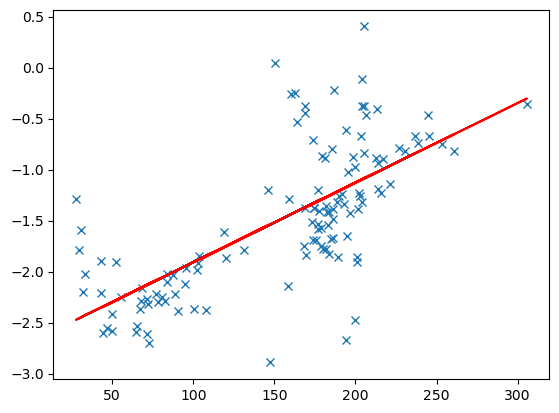

In [128]:
plt.plot(o2_impact_direct['o2_conc'], (o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'], linestyle='None', marker='x')

res = stats.linregress(o2_impact_direct['o2_conc'], (o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'])
plt.plot(o2_impact_direct['o2_conc'], res.intercept + res.slope*o2_impact_direct['o2_conc'], 'r', label='fitted line')
print(f"R-squared: {res.rvalue**2:.6f}")

In [ ]:

for n in range(last, float_wmo_list.shape[0]): #range(0, float_wmo_list.shape[0]): #range(34, 35): 
    wmo_n = float_wmo_list[n]
    if glodap_offsets_p.pH_group[glodap_offsets_p.index==wmo_n].values=='no pH':
        continue
    
    # if oxygen offset is nan, then skip
    if np.isnan(glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values):
        continue

    print('N: ' + str(n) + ' ' + str(wmo_n) + ' started')
    
    argo_derived_n = xr.load_dataset(argo_path_derived+ str(wmo_n) + '_derived.nc')

    nprof = argo_derived_n.LATITUDE.shape[0]
    if nprof==1: # if there is only one profile, probably don't want to trust any offset
        continue

    # Check for presence of non-nan pH
    if ~np.any(~np.isnan(argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED'])):
        continue
    
    # load interpolated file
    argo_interp_n = xr.load_dataset(argo_path_interpolated + str(wmo_n) + '_interpolated.nc')

    # initialize coordinate and measurement arrays
    Coordinates_all = np.empty([nprof, 3],dtype=float)
    Coordinates_all[:] = np.nan
       
    # Measurements_all = np.empty([nprof, 4],dtype=float)
    # Measurements_all[:] = np.nan

    Measurements_all_S_T_O2 = np.empty([nprof, 3],dtype=float)
    Measurements_all_S_T_O2[:] = np.nan
    for p in range(nprof):
        # load interpolated argo_data so that 1500 m data is present 
        argo_profile = argo_interp_n.isel(N_PROF=p)

        # argo_profile = argo_interp_wmo[wmo_n].isel(N_PROF=p)
        argo_profile.load()
        data_1500 = argo_profile.where(argo_profile.PRES_ADJUSTED==1500, drop=True) 
        if data_1500.LATITUDE.size==0:
            continue
        #index_1500 = argo_profile.PRES_ADJUSTED==1500 #argo_wmo[wmo_n].PRES_ADJUSTED[p,:]==1500

        #argo_wmo[5904659].PSAL_ADJUSTED[0,index_1500]
        Coordinates_all[p,:] = np.stack((data_1500.LONGITUDE.values, 
                            data_1500.LATITUDE.values, 
                            data_1500.PRES_ADJUSTED.values),
                            axis=1)
        # Measurements_all[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
        #                      data_1500.TEMP_ADJUSTED.values, 
        #                      data_1500.NITRATE_ADJUSTED.values, 
        #                      data_1500.DOXY_ADJUSTED.values),
        #                      axis=1)
        
        Measurements_all_S_T_O2[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
                             data_1500.TEMP_ADJUSTED.values, 
                             data_1500.DOXY_ADJUSTED.values),
                             axis=1)
    if np.sum(~np.isnan(Coordinates_all))==0: # if no valid 1500 meter data is present, skip 
        continue

    # calculate decimal_year for ESPER
    # da = argo_interp_wmo[wmo_n].juld
    da = argo_interp_n.juld
    decimal_year = da.dt.year + (da.dt.dayofyear - 1 + (da.dt.hour * 3600 + da.dt.minute * 60 + da.dt.second) / 86400) / (365 + da.dt.is_leap_year)

    # calculate LIPHR pH at 1500 m using original data from all profiles
    orig_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all_S_T_O2.tolist(),
                                    MeasIDVec_LIR, 
                                    OAAdjustTF = False)  
    
    # remove data when oxygen is NaN - avoids biasing difference low
    pH_orig_no_nan = np.copy(orig_pH)
    pH_orig_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    # save 1500 pH orig
    argo_derived_n['pH_1500_orig_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_orig_LIPHR[:] = pH_orig_no_nan[:,0]

    # # calculate ESPER pH at 1500 m using original data from all profiles
    # # calculate ESPER pH at 1500 m using original data from all profiles
    orig_pH_ESPER = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                    DesiredVariables,
                                                    Coordinates_all.tolist(),
                                                    Measurements_all_S_T_O2.tolist(),
                                                    MeasIDVec_ESPER,
                                                    Equations, 
                                                    decimal_year.values.tolist(), 
                                                    0)
    # remove data when oxygen is NaN - avoids biasing difference low
    pH_orig_ESPER_no_nan = np.copy(orig_pH_ESPER)
    pH_orig_ESPER_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    # save 1500 pH orig
    argo_derived_n['pH_1500_orig_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_orig_ESPER[:] = pH_orig_ESPER_no_nan[:,0]

    # create a second Measurements array that adjusts oxygen according to the mean glodap bias. Subtract the offset to correct it properly
    # Measurements_o2_offset = np.concatenate(([Measurements_all[:,0]], 
    #                               [Measurements_all[:,1]],
    #                               [Measurements_all[:,2]],
    #                               [Measurements_all[:,3]] - 
    #                               glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
    # Measurements_o2_offset = np.transpose(Measurements_o2_offset)
    
    # create a measurements_offset array that only has S, O2, and T:
    Measurements_S_T_O2_w_o2_offset = np.concatenate(([Measurements_all_S_T_O2[:,0]], 
                                    [Measurements_all_S_T_O2[:,1]],
                                    [Measurements_all_S_T_O2[:,2]] - 
                                    glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
    Measurements_S_T_O2_w_o2_offset = np.transpose(Measurements_S_T_O2_w_o2_offset)


    # calculate LIPHR pH at 1500 m with oxygen adjustment
    pH_o2_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_S_T_O2_w_o2_offset.tolist(),
                                    MeasIDVec_LIR, 
                                    OAAdjustTF = False)  

    # remove data when oxygen is NaN - avoids biasing difference low
    pH_o2_adjust_no_nan = np.copy(pH_o2_adjust)
    pH_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    argo_derived_n['pH_1500_O2_ADJUST_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_O2_ADJUST_LIPHR[:] = pH_o2_adjust_no_nan[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_o2_adjust_no_nan - pH_orig_no_nan)* \
        ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0
    

        # calculate LIPHR pH at 1500 m with oxygen adjustment
    pH_ESPER_o2_adjust = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                    DesiredVariables,
                                                    Coordinates_all.tolist(),
                                                    Measurements_S_T_O2_w_o2_offset.tolist(),
                                                    MeasIDVec_ESPER,
                                                    Equations, 
                                                    decimal_year.values.tolist(), 
                                                    0)

    # remove data when oxygen is NaN - avoids biasing difference low
    pH_ESPER_o2_adjust_no_nan = np.copy(pH_ESPER_o2_adjust)
    pH_ESPER_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    argo_derived_n['pH_1500_O2_ADJUST_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_O2_ADJUST_ESPER[:] = pH_ESPER_o2_adjust_no_nan[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_ESPER_o2_adjust_no_nan - pH_orig_ESPER_no_nan)* \
        ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0
    


    # Calculate TALK wo o2 correction
    # orig_TALK = carbon_utils.LIAR_matlab(LIPHR_path,
    #                                     Coordinates_all.tolist(),
    #                                     Measurements_all_no3.tolist(),
    #                                     MeasIDVec_no3)  
    # argo_derived_n['TALK_1500_orig_LIAR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    # argo_derived_n.TALK_1500_orig_LIAR[:] = orig_TALK[:,0]

    # # TALK w/ O2 correction
    # TALK_o2_adjust = carbon_utils.LIAR_matlab(LIPHR_path,
    #                                     Coordinates_all.tolist(),
    #                                     Measurements_no3_o2_offset.tolist(),
    #                                     MeasIDVec_no3)  
    
    # # remove data when oxygen is NaN - avoids biasing difference low
    # TALK_o2_adjust_no_nan = np.copy(TALK_o2_adjust)
    # TALK_o2_adjust_no_nan[np.isnan(Measurements_all_no3[:,2])] = np.nan
    
    # argo_derived_n['TALK_1500_O2_ADJUST_LIAR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    # argo_derived_n.TALK_1500_O2_ADJUST_LIAR[:] = TALK_o2_adjust_no_nan[:,0]

   
    #argo_derived_n['TALK_w_O2_ADJUST'] = \
    #    argo_derived_n.TALK_LIAR + np.nanmean(TALK_o2_adjust_no_nan - orig_TALK)


    # do additional nitrate calculations if NITRATE is present
    if 'NITRATE_ADJUSTED' in argo_derived_n.keys():
            
        # calculate LINR NO3 at 1500m using original data from all profiles
        orig_no3 = carbon_utils.LINR_matlab(LIPHR_path,
                                        Coordinates_all.tolist(),
                                        Measurements_all_S_T_O2.tolist(),
                                        MeasIDVec_LIR)  
        
        argo_derived_n['NO3_1500_orig_LINR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        argo_derived_n.NO3_1500_orig_LINR[:] = orig_no3[:,0]

        # # calculate LINR NO3 at 1500m with oxygen adjustment:
        # Measurements_no3_o2_offset = np.concatenate(([Measurements_all_S_T_O2[:,0]], 
        #                             [Measurements_all_S_T_O2[:,1]],
        #                             [Measurements_all_S_T_O2[:,2]] - 
        #                             glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))

        # Measurements_no3_o2_offset = np.transpose(Measurements_no3_o2_offset)

        no3_o2_adjust = carbon_utils.LINR_matlab(LIPHR_path,
                                        Coordinates_all.tolist(),
                                        Measurements_S_T_O2_w_o2_offset.tolist(),
                                        MeasIDVec_LIR)  
        # remove data when oxygen is NaN - avoids biasing difference low
        no3_o2_adjust_no_nan = np.copy(no3_o2_adjust)
        no3_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

        argo_derived_n['NO3_1500_o2_adjust'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        argo_derived_n.NO3_1500_o2_adjust[:] = no3_o2_adjust_no_nan[:,0]
        
        argo_derived_n['NITRATE_ADJUSTED_w_O2_ADJUST'] = \
            argo_derived_n.NITRATE_ADJUSTED + np.nanmean(no3_o2_adjust_no_nan - orig_no3)
    
        # # Calculate pH at 1500 m with ONLY nitrate impacts
        # Measurements_no3_offset_for_pH = np.concatenate(([Measurements_all[:,0]], 
        #                                 [Measurements_all[:,1]],
        #                                 [Measurements_all[:,2] + np.nanmean(no3_o2_adjust - orig_no3)],
        #                                 [Measurements_all[:,3]]))
        
        # Measurements_no3_offset_for_pH = np.transpose(Measurements_no3_offset_for_pH)
        # pH_no3_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
        #                             Coordinates_all.tolist(),
        #                             Measurements_no3_offset_for_pH.tolist(),
        #                             MeasIDVec, 
        #                             OAAdjustTF = False)  
        
        # remove data when oxygen is NaN - avoids biasing difference low
        # pH_no3_adjust_no_nan = np.copy(pH_no3_adjust)
        # pH_no3_adjust_no_nan[np.isnan(Measurements_all[:,3])] = np.nan

        # argo_derived_n['pH_1500_no3_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        # argo_derived_n.pH_1500_no3_LIPHR[:] = pH_no3_adjust_no_nan[:,0]

        # # apply mean pH difference at 1500 m to full pH profiles and save
        # argo_derived_n['PH_w_NO3_ADJUST'] = \
        #     argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_no3_adjust_no_nan - orig_pH)
        

        # Measurements_o2_offset_no3_offset = np.concatenate(([Measurements_all[:,0]], 
        #                                 [Measurements_all[:,1]],
        #                                 [Measurements_all[:,2] + np.nanmean(no3_o2_adjust - orig_no3)],
        #                                 [Measurements_all[:,3]] - 
        #                                 glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
        # Measurements_o2_offset_no3_offset = np.transpose(Measurements_o2_offset_no3_offset)

        # # Calculate pH at 1500 m with both oxygen and nitrate impacts
        # pH_o2_adjust_no3_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
        #                             Coordinates_all.tolist(),
        #                             Measurements_o2_offset_no3_offset.tolist(),
        #                             MeasIDVec, 
        #                             OAAdjustTF = False)  
        # # remove data when oxygen is NaN - avoids biasing difference low
        # pH_o2_adjust_no3_adjust_no_nan = np.copy(pH_o2_adjust_no3_adjust)
        # pH_o2_adjust_no3_adjust_no_nan[np.isnan(Measurements_all[:,3])] = np.nan

        # argo_derived_n['pH_1500_o2_no3_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        # argo_derived_n.pH_1500_o2_no3_LIPHR[:] = pH_o2_adjust_no3_adjust_no_nan[:,0]

        #        # apply mean pH difference at 1500 m to full pH profiles and save
        # argo_derived_n['PH_w_O2_NO3_ADJUST'] = \
        #     argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_o2_adjust_no3_adjust_no_nan - orig_pH)

        # removing this section - nitrate is not used in LIAR, so there is no reason to re-calculate full depth TALK or consider the impact of nitrate 
        ## Calculate full-depth alkalinity using adjusted nitrate - code copied from float_bgc_bias_correction
        ##repeat lats, lons to match pressure shape
        #lons_rep = np.tile(argo_derived_n.LONGITUDE.values,(argo_derived_n.PRES_ADJUSTED.shape[1],1)).T
        #lats_rep = np.tile(argo_derived_n.LATITUDE.values,(argo_derived_n.PRES_ADJUSTED.shape[1],1)).T

        #set Si and PO4 inputs
        #if nitrate, then use redfield for Si and PO4?, otherwise set to 0    
        #SI = argo_n.NITRATE_ADJUSTED*2.5
        #SI.where(~np.isnan(SI), 0)
        #PO4 = argo_n.NITRATE_ADJUSTED/16
        #PO4.where(~np.isnan(PO4),0)
        #Coordinates_TALK = np.stack((lons_rep.flatten(), 
        #                lats_rep.flatten(), 
        #                argo_derived_n.PRES_ADJUSTED.values.flatten()),
        #                axis=1)
        #Measurements_TALK = np.stack((argo_derived_n.PSAL_ADJUSTED.values.flatten(), 
        #                    argo_derived_n.TEMP_ADJUSTED.values.flatten(), 
        #                    argo_derived_n.NITRATE_ADJUSTED_w_O2_ADJUST.values.flatten(), 
        #                    argo_derived_n.DOXY_ADJUSTED.values.flatten()),
        #                    axis=1)
        #    Measurements_TALK_orig = np.stack((argo_derived_n.PSAL_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.TEMP_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.NITRATE_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.DOXY_ADJUSTED.values.flatten()),
        #                   axis=1)
        #MeasIDVec_TALK = [1, 7, 3, 6]
                       

        #results = carbon_utils.LIAR_matlab(LIPHR_path,
        #                                       Coordinates_TALK.tolist(),
        #                                       Measurements_TALK.tolist(),
        #                                       MeasIDVec_TALK,
        #                                       VerboseTF=False)                                  

        #argo_derived_n['TALK_w_NO3_ADJUST'] = (['N_PROF','N_LEVELS'],
        #                        np.reshape(np.asarray(results),argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))


        #results = carbon_utils.LIAR_matlab(LIPHR_path,
        #                                       Coordinates_TALK.tolist(),
        #                                       Measurements_TALK_orig.tolist(),
        #                                       MeasIDVec_TALK,
        #                                       VerboseTF=False)  

        #argo_derived_n['TALK_LIAR_recalc'] = (['N_PROF','N_LEVELS'],
        #                        np.reshape(np.asarray(results),argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
    argo_derived_n.to_netcdf(argo_path_derived+ str(wmo_n) + '_derived_2.nc')
    print(str(wmo_n)+ ' finished')

    last=n

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/3977441129.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(211, projection=ccrs.PlateCarree())


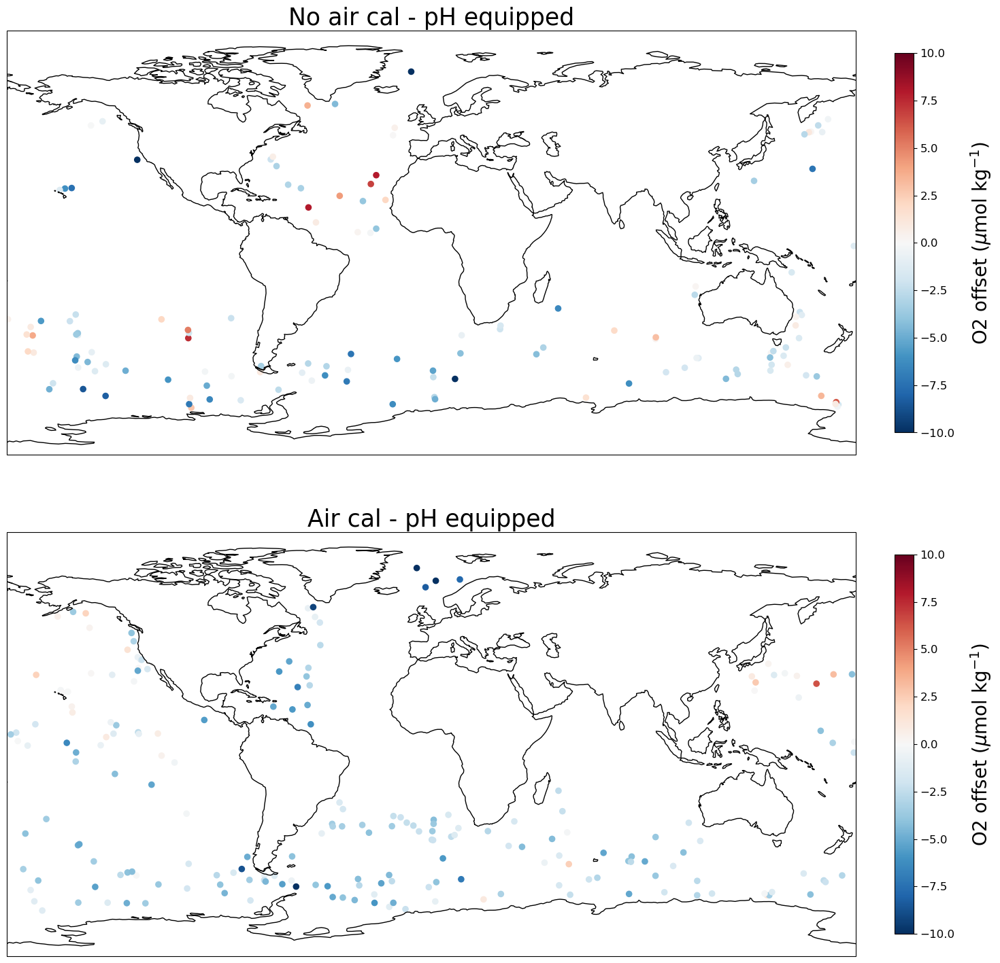

In [ ]:
# pH floats: Air cal and non-air cal only
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(211, projection=ccrs.PlateCarree())
no_air_cal_ph = offsets_pH.get_group(('no air cal', 'pH'))

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(no_air_cal_ph['main_float_longitude'], no_air_cal_ph['main_float_latitude'],
                c=no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('No air cal - pH equipped', fontsize=25)


ax = plt.subplot(212, projection=ccrs.PlateCarree())
air_cal_ph = offsets_pH.get_group(('air cal', 'pH'))

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(air_cal_ph['main_float_longitude'], air_cal_ph['main_float_latitude'],
                c=air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('Air cal - pH equipped', fontsize=25)

plt.tight_layout()

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_pH_equipped_air_vs_non_v3.png', dpi=300)

In [ ]:
np.nanmean(profile_data)

123.25746

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/2474636305.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(111, projection=ccrs.PlateCarree())


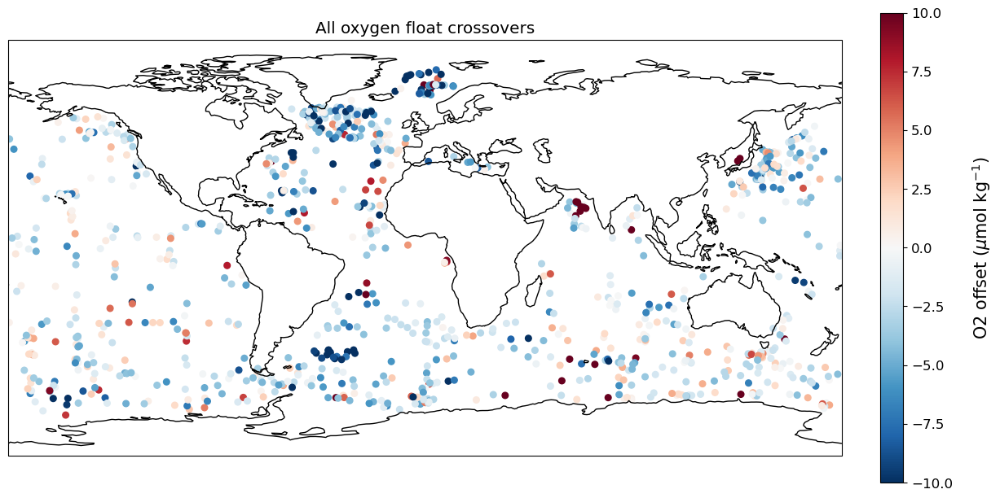

In [ ]:
# all floats
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(111, projection=ccrs.PlateCarree())

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(glodap_offsets_mean['main_float_longitude'], glodap_offsets_mean['main_float_latitude'],
                c=glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=30,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15) 
plt.title('All oxygen float crossovers')

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_all_v3.png', dpi=300)


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:37: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(322, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:51: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(323, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:64: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(326, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/28649

RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

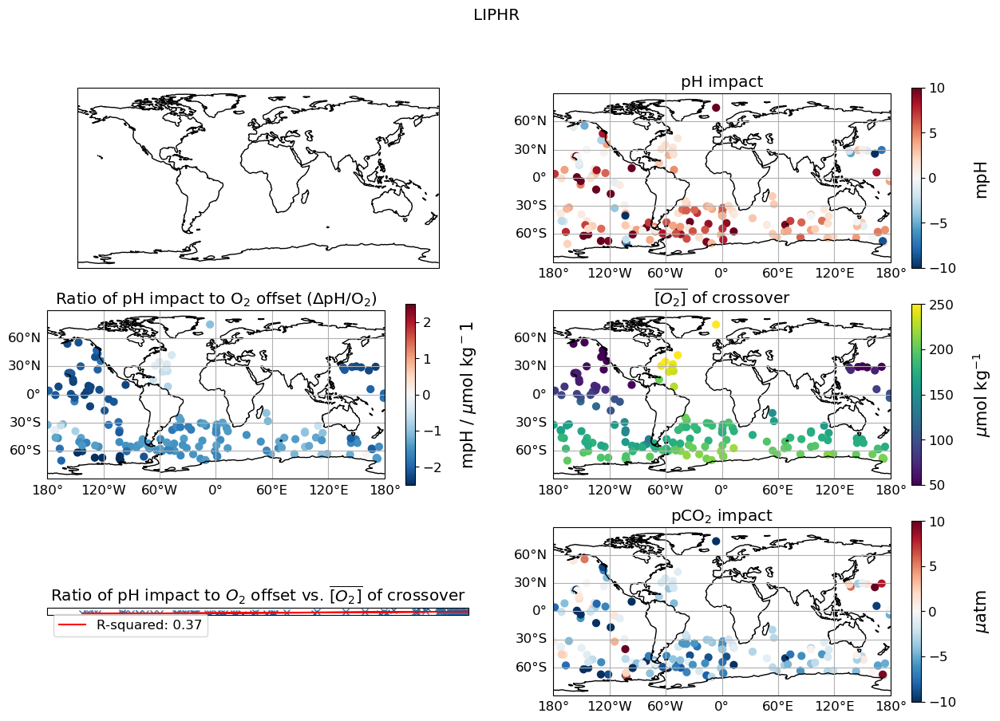

In [ ]:
pH_types = ['LIPHR', 'ESPER']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    

    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    # fig = plt.figure(figsize=(15, 10))

    fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    # O2 Offset
    # ax = plt.subplot(321, projection=ccrs.PlateCarree())
    axs['a.'].coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False

    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    # cbar = plt.colorbar(sct, fraction=c_lab_frac, pad = 0.04, shrink=0.5)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)
    plt.title(r'O$_2$ Offset')

    ax = plt.subplot(322, projection=ccrs.PlateCarree())
    plt.title('pH impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=15, fontsize=15)


    ax = plt.subplot(323, projection=ccrs.PlateCarree())
    plt.title('Ratio of pH impact to O$_2$ offset ($\Delta$pH/O$_2$)')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=15, fontsize=15)

    ax = plt.subplot(326, projection=ccrs.PlateCarree())
    plt.title('pCO$_2$ impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=15, fontsize=15)

    ax = plt.subplot(324, projection=ccrs.PlateCarree())
    plt.title(r'$\overline{[O_2]}$ of crossover')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)

    ax = plt.subplot(325)
    plt.title('Ratio of pH impact to $O_2$ offset vs. $\overline{[O_2]}$ of crossover')
    plt.plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
              linestyle='None', marker='x')

    res = stats.linregress(pH_impact_data['o2_conc'], 
                           (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    plt.plot(pH_impact_data['o2_conc'], 
             res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
    plt.ylabel('mpH / $\mu$mol kg$^-1$')
    plt.xlabel('$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # Get the x-limit values
    x_limits = plt.xlim()
    y_limits = plt.ylim()
    plt.grid('on')
    plt.legend()

    plt.suptitle(ph_alg)

    plt.tight_layout()
    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)


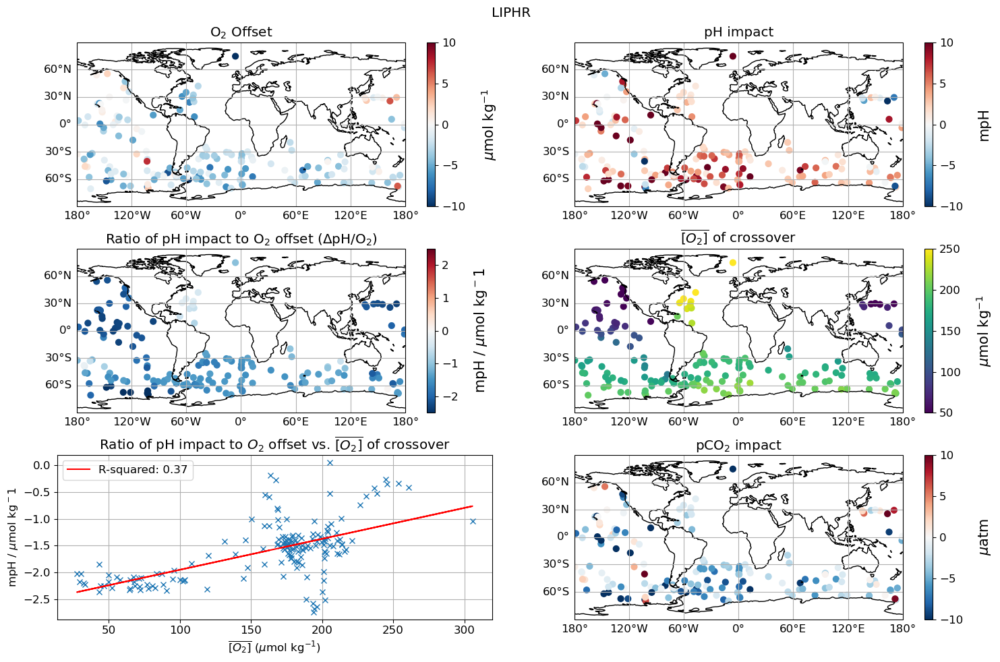

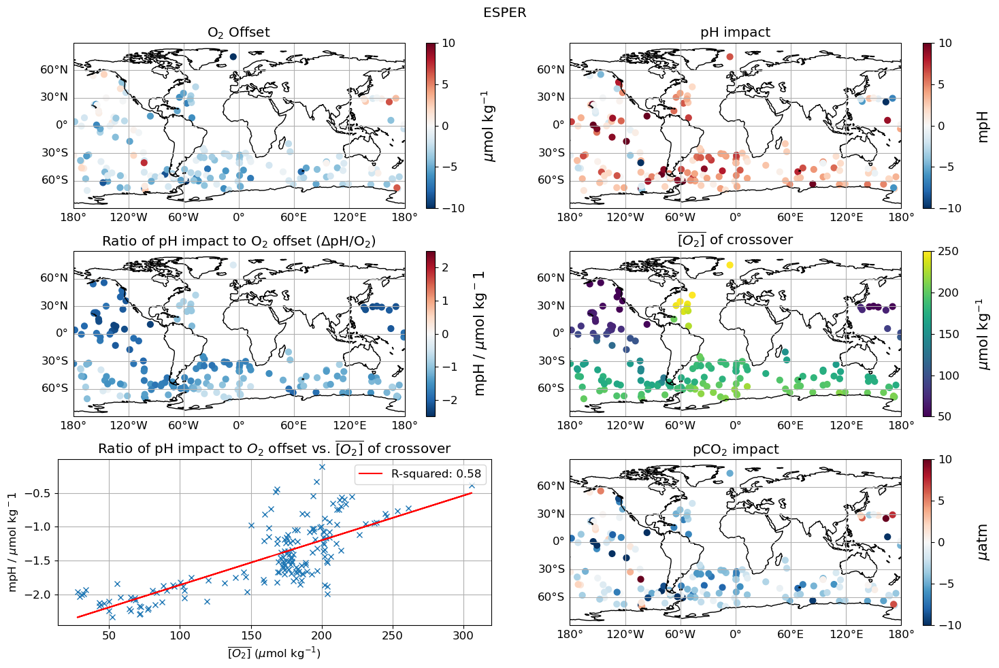

In [ ]:
# c_lab_frac = .1
# c_lab_pad = .02
# c_lab_shrink = 0.5

pH_types = ['LIPHR', 'ESPER']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    

    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    fig = plt.figure(figsize=(15, 10))

    # O2 Offset
    ax = plt.subplot(321, projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False

    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    # cbar = plt.colorbar(sct, fraction=c_lab_frac, pad = 0.04, shrink=0.5)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)
    plt.title(r'O$_2$ Offset')

    ax = plt.subplot(322, projection=ccrs.PlateCarree())
    plt.title('pH impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=15, fontsize=15)


    ax = plt.subplot(323, projection=ccrs.PlateCarree())
    plt.title('Ratio of pH impact to O$_2$ offset ($\Delta$pH/O$_2$)')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=15, fontsize=15)

    ax = plt.subplot(326, projection=ccrs.PlateCarree())
    plt.title('pCO$_2$ impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=15, fontsize=15)

    ax = plt.subplot(324, projection=ccrs.PlateCarree())
    plt.title(r'$\overline{[O_2]}$ of crossover')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)

    ax = plt.subplot(325)
    plt.title('Ratio of pH impact to $O_2$ offset vs. $\overline{[O_2]}$ of crossover')
    plt.plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
              linestyle='None', marker='x')

    res = stats.linregress(pH_impact_data['o2_conc'], 
                           (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    plt.plot(pH_impact_data['o2_conc'], 
             res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
    plt.ylabel('mpH / $\mu$mol kg$^-1$')
    plt.xlabel('$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # Get the x-limit values
    x_limits = plt.xlim()
    y_limits = plt.ylim()
    plt.grid('on')
    plt.legend()

    plt.suptitle(ph_alg)

    plt.tight_layout()
    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

# Show the plot
# plt.show()

Text(0, 0.5, 'Pressure (dbar)')

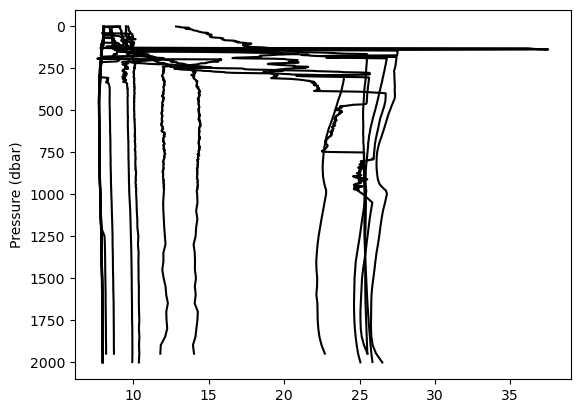

In [ ]:
plt.figure()

for p in range(0, len(argo_n['N_PROF'])):
    profile_pressure = argo_n['PRES_ADJUSTED'].isel(N_PROF=p).values
    profile_data = argo_n['PH_IN_SITU_TOTAL_ADJUSTED'].isel(N_PROF=p).values
    plt.plot(profile_data[~np.isnan(profile_data)]+(p-1)*np.nanmean(profile_data)/10, 
         profile_pressure[~np.isnan(profile_data)], c='black')


plt.gca().invert_yaxis()
#plt.xlabel('Nitrate (µmol/kg)')
plt.ylabel('Pressure (dbar)')

In [ ]:
# check original sprof file
argo_sprof_n = xr.load_dataset(argo_path+'1902382_Sprof.nc')


In [ ]:
argo_sprof_n

<xarray.Dataset>
Dimensions:                          (N_PROF: 23, N_PARAM: 9, N_CALIB: 1,
                                      N_LEVELS: 527)
Dimensions without coordinates: N_PROF, N_PARAM, N_CALIB, N_LEVELS
Data variables: (12/93)
    DATA_TYPE                        object b'Argo synthetic profile          '
    FORMAT_VERSION                   object b'1.0 '
    HANDBOOK_VERSION                 object b'1.2 '
    REFERENCE_DATE_TIME              object b'19500101000000'
    DATE_CREATION                    object b'20220825072049'
    DATE_UPDATE                      object b'20220825072049'
    ...                               ...
    NITRATE                          (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_QC                       (N_PROF, N_LEVELS) object nan nan ... nan
    NITRATE_dPRES                    (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_ADJUSTED                 (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_ADJUSTED_QC              (N_PROF, N_LEVELS) object nan nan ... nan
    NITRATE_ADJUSTED_ERROR           (N_PROF, N_LEVELS) float32 nan nan ... nan
Attributes:
    title:                Argo float vertical profile
    institution:          AOML
    source:               Argo float
    history:              2022-08-25T07:20:49Z creation (software version 1.1...
    references:           http://www.argodatamgt.org/Documentation
    user_manual_version:  1.0
    Conventions:          Argo-3.1 CF-1.6
    featureType:          trajectoryProfile
    software_version:     1.13 (version 09.06.2022 for ARGO_simplified_profile)

In [ ]:
# Function to convert an array from NumPy datetime64 to Python float format
def datetime_to_float(dt):
  return (dt - np.datetime64('1900-01-01')) / np.timedelta64(1,'D')

# Function to convert an array from Python float to NumPy datetime64 format
def float_to_datetime(nums):
  return (nums * np.timedelta64(1,'D')) + np.datetime64('1900-01-01')

# Function to interpolate data from a specified float parameter to a uniform time and pressure grid
def interpolate_depth_section(param_name,specify_qc_flags=None,pres_interval=1.0):
  """
  Arguments:
      param_name: string with netCDF file parameter name (e.g., 'TEMP_ADJUSTED') to interpolate
      specify_qc_flags: None to ignore QC flags
                        or a list of QC flags (e.g., [1,2,3]) indicating which data to retain before interpolation
      pres_interval: vertical resolution for interpolating pressure (z) axis (default: 1.0 dbar)
  
  Returns:
      time_coord: 1-D NumPy array with original profile timestamps in np.datetime64 format
      pres_coord: 1-D NumPy array with a uniform pressure (z) coordinate from 0 dbar to the deepest recorded
                  pressure value, at a resolution of  dbar
      time_grid: 2-D NumPy array with the meshed grid of time_coord
      pres_grid: 2-D NumPy array with the meshed grid of pres_coord
      param_gridded: 2-D NumPy array with the interpolated parameter values at the locations of time_grid and pres_grid

  """

  # New grid points
  time_coord = data['JULD'].values
  pres_coord = np.arange(0,data['PRES'].max(),pres_interval)
  time_grid, pres_grid = np.meshgrid(time_coord,pres_coord)
  time_grid = datetime_to_float(time_grid)     # Convert from np.datetime64 to float

  # 1-D (flattened) versions of old grids and parameter values
  time_1D = np.tile(data['JULD'].values,(len(data['N_LEVELS']),1)).T.flatten()
  pres_1D = data['PRES'].values.flatten()
  param_1D = data[param_name].values.flatten()
  if param_1D.dtype == object:         # If parameter is an array of QC flag data
    param_1D = param_1D.astype(float)  # Convert QC flags from dtype 'object' to float
    interp_method = 'nearest'          # Use nearest-neighbor interpolation for QC flags to avoid unwanted averaging
  else:
    interp_method = 'linear'           # Use bilinear interpolation for normal data fields

  # Extract only values matching specified QC flags
  if specify_qc_flags is not None:
    qc_1D = data[param_name + '_QC'].values.astype(float).flatten()
    qc_mask = np.tile(False,len(qc_1D))
    for qc_flag in specify_qc_flags:
      qc_mask = np.logical_or(qc_mask,qc_1D == qc_flag)
    time_1D = time_1D[qc_mask]
    pres_1D = pres_1D[qc_mask]
    param_1D = param_1D[qc_mask]

  # Remove NaN values before interpolation
  time_1D = datetime_to_float(time_1D[~np.isnan(param_1D)])       # Convert from np.datetime64 to float
  pres_1D = pres_1D[~np.isnan(param_1D)]
  param_1D = param_1D[~np.isnan(param_1D)]

  # Interpolate from irregular points to grid
  param_gridded = interpolate.griddata((time_1D,pres_1D),param_1D,(time_grid,pres_grid),method=interp_method)

  # Return coordinates, grid, and gridded data
  return time_coord, pres_coord, float_to_datetime(time_grid), pres_grid, param_gridded

In [ ]:
# calculate pCO2 impacts and save out 

derived_functions.calc_derived_3_pCO2_impacts(argo_path_derived, file)
for n in range(0, len(derivedlist)):
        
        print(f' {n+1}' + ' out of: ' + str(len(derivedlist)) + ' File: ' + derivedlist[n]) 
        argo_n = xr.load_dataset(argo_path_derived + derivedlist[n])
        var_list = list(argo_n.data_vars)
        wmo_n = argo_n['wmo']

        if "PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST" not in var_list:
                print('Skipping')
                continue

       # mean_pH_impact_n = np.nanmean(argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'])
        #pH_impact.append(mean_pH_impact_n)

        #o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n.values].values
        #o2_offset.append(o2_offset_n)

        # find 1500m data and save out to explore sensitivity of pH to O2
        #first_filt = argo_n.where(argo_n.PRES_ADJUSTED>1450, drop=True)
        #second_filt = first_filt.where(first_filt.PRES_ADJUSTED<1550, drop=True)
        
        #o2_1500.append(np.nanmean(second_filt.DOXY_ADJUSTED))
        #temp_1500.append(np.nanmean(second_filt.TEMP_ADJUSTED))
        #sal_1500.append(np.nanmean(second_filt.PSAL_ADJUSTED))

        if 'TALK_LIAR' not in argo_n.keys():
                continue

        if 'NITRATE_ADJUSTED' in argo_n.keys():
                SI = argo_n.NITRATE_ADJUSTED*2.5
                SI = SI.where(~np.isnan(SI), 0)
                PO4 = argo_n.NITRATE_ADJUSTED/16
                PO4 = PO4.where(~np.isnan(PO4),0)
        else:
                SI = np.zeros((argo_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
                PO4 = np.zeros((argo_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
        # Calculate pCO2 with all original values
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_orig_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_orig_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  

        # Calculate pCO2 including only the impact of adjusting oxygen on pH MLR
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_O2_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_O2_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  

       # ESPER Version: Calculate pCO2 including only the impact of adjusting oxygen on pH MLR
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_O2_ESPER_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_O2_ESPER_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  


        # if 'PH_w_NO3_ADJUST' in argo_n.keys():
        #         # Calculate pCO2 including only the impact of adjusting nitrate on pH MLR
        #         # replace any negative pH values with nans:
        #         argo_n['PH_w_NO3_ADJUST'] = \
        #                 argo_n.PH_w_NO3_ADJUST.where(argo_n.PH_w_NO3_ADJUST>0)

        #         results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_w_NO3_ADJUST,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        #         )
        #         argo_n['pCO2_pH_NO3_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        # if 'TALK_w_NO3_ADJUST' in argo_n.keys():
                ## Calculate pCO2 with ONLY TALK change due to Nitrate  
                #results = pyco2.sys(
                #        par1=argo_n.TALK_w_NO3_ADJUST, 
                #        par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED,
                #         par1_type=1,
                #         par2_type=3,
                #         temperature=argo_n.TEMP_ADJUSTED, 
                #         pressure=argo_n.PRES_ADJUSTED, 
                #         salinity=argo_n.PSAL_ADJUSTED, 
                #         temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #         pressure_out=argo_n.PRES_ADJUSTED,
                #         total_silicate=SI,
                #         total_phosphate=PO4,
                #         opt_pH_scale = 1, #total
                #         opt_k_carbonic=10, #Lueker et al. 2000
                #         opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #         opt_total_borate=2, # Lee et al. 2010
                #         opt_k_fluoride=2, # Perez and Fraga 1987
                #         opt_buffers_mode=1,
                # )
                # argo_n['pCO2_pH_orig_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

                # # Calculate pCO2 with BOTH pH change due to NO3 and TALK change due to Nitrate  
                # results = pyco2.sys(
                #         par1=argo_n.TALK_w_NO3_ADJUST, 
                #         par2=argo_n.PH_w_NO3_ADJUST,
                #         par1_type=1,
                #         par2_type=3,
                #         temperature=argo_n.TEMP_ADJUSTED, 
                #         pressure=argo_n.PRES_ADJUSTED, 
                #         salinity=argo_n.PSAL_ADJUSTED, 
                #         temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #         pressure_out=argo_n.PRES_ADJUSTED,
                #         total_silicate=SI,
                #         total_phosphate=PO4,
                #         opt_pH_scale = 1, #total
                #         opt_k_carbonic=10, #Lueker et al. 2000
                #         opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #         opt_total_borate=2, # Lee et al. 2010
                #         opt_k_fluoride=2, # Perez and Fraga 1987
                #         opt_buffers_mode=1,
                # )
                # argo_n['pCO2_pH_NO3_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2']) 

                                
        # if 'PH_w_O2_NO3_ADJUST' in argo_n.keys():
        #         # pCO2 including pH adjusted for O2 and NO3
        #         # replace any negative pH values with nans:
        #         argo_n['PH_w_O2_NO3_ADJUST'] = \
        #                 argo_n.PH_w_O2_NO3_ADJUST.where(argo_n.PH_w_O2_NO3_ADJUST>0)

        #         results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_w_O2_NO3_ADJUST,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        #         )
        #         argo_n['pCO2_pH_O2_NO3_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

                # if 'TALK_w_NO3_ADJUST' in argo_n.keys():
                #         # pCO2 including pH adjusted for O2 and NO3 and TALK adjusted for NO3
                #         results = pyco2.sys(
                #                 par1=argo_n.TALK_w_NO3_ADJUST, 
                #                 par2=argo_n.PH_w_O2_NO3_ADJUST,
                #                 par1_type=1,
                #                 par2_type=3,
                #                 temperature=argo_n.TEMP_ADJUSTED, 
                #                 pressure=argo_n.PRES_ADJUSTED, 
                #                 salinity=argo_n.PSAL_ADJUSTED, 
                #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #                 pressure_out=argo_n.PRES_ADJUSTED,
                #                 total_silicate=SI,
                #                 total_phosphate=PO4,
                #                 opt_pH_scale = 1, #total
                #                 opt_k_carbonic=10, #Lueker et al. 2000
                #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #                 opt_total_borate=2, # Lee et al. 2010
                #                 opt_k_fluoride=2, # Perez and Fraga 1987
                #                 opt_buffers_mode=1,
                #         )
                #         argo_n['pCO2_pH_O2_NO3_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        # currently commented out, will add back in once pH_in_situ_corr is calculated / saved
        # argo_n['PH_IN_SITU_CORR_w_O2_ADJUST_OFFSET'] = \
        #         argo_n.pH_insitu_corr + np.nanmean(argo_n['pH_O2_ADJUST_LIPHR'] - argo_n['pH_orig_LIPHR'])

        # results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_IN_SITU_CORR_w_O2_ADJUST_OFFSET,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        # )
        # argo_n['pCO2_pH_CORR_O2_IMPACT'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        argo_n.to_netcdf(argo_path_derived+ str(wmo_n.values) + '_derived_3.nc')

 1 out of: 217 File: 5906571_derived_2.nc
 2 out of: 217 File: 5906524_derived_2.nc
 3 out of: 217 File: 4903462_derived_2.nc
 4 out of: 217 File: 5905075_derived_2.nc
 5 out of: 217 File: 5904186_derived_2.nc
 6 out of: 217 File: 5903893_derived_2.nc
 7 out of: 217 File: 5906247_derived_2.nc
 8 out of: 217 File: 5906536_derived_2.nc
 9 out of: 217 File: 5906488_derived_2.nc
 10 out of: 217 File: 5904693_derived_2.nc
 11 out of: 217 File: 5906224_derived_2.nc
 12 out of: 217 File: 5906301_derived_2.nc
 13 out of: 217 File: 5906507_derived_2.nc
 14 out of: 217 File: 6903551_derived_2.nc
 15 out of: 217 File: 4903365_derived_2.nc
 16 out of: 217 File: 5904474_derived_2.nc
 17 out of: 217 File: 5906236_derived_2.nc
 18 out of: 217 File: 5905973_derived_2.nc
 19 out of: 217 File: 5906512_derived_2.nc
 20 out of: 217 File: 5906515_derived_2.nc
 21 out of: 217 File: 5906437_derived_2.nc
 22 out of: 217 File: 5904679_derived_2.nc
 23 out of: 217 File: 5904686_derived_2.nc
 24 out of: 217 File

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/4216530959.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(211, projection=ccrs.PlateCarree())


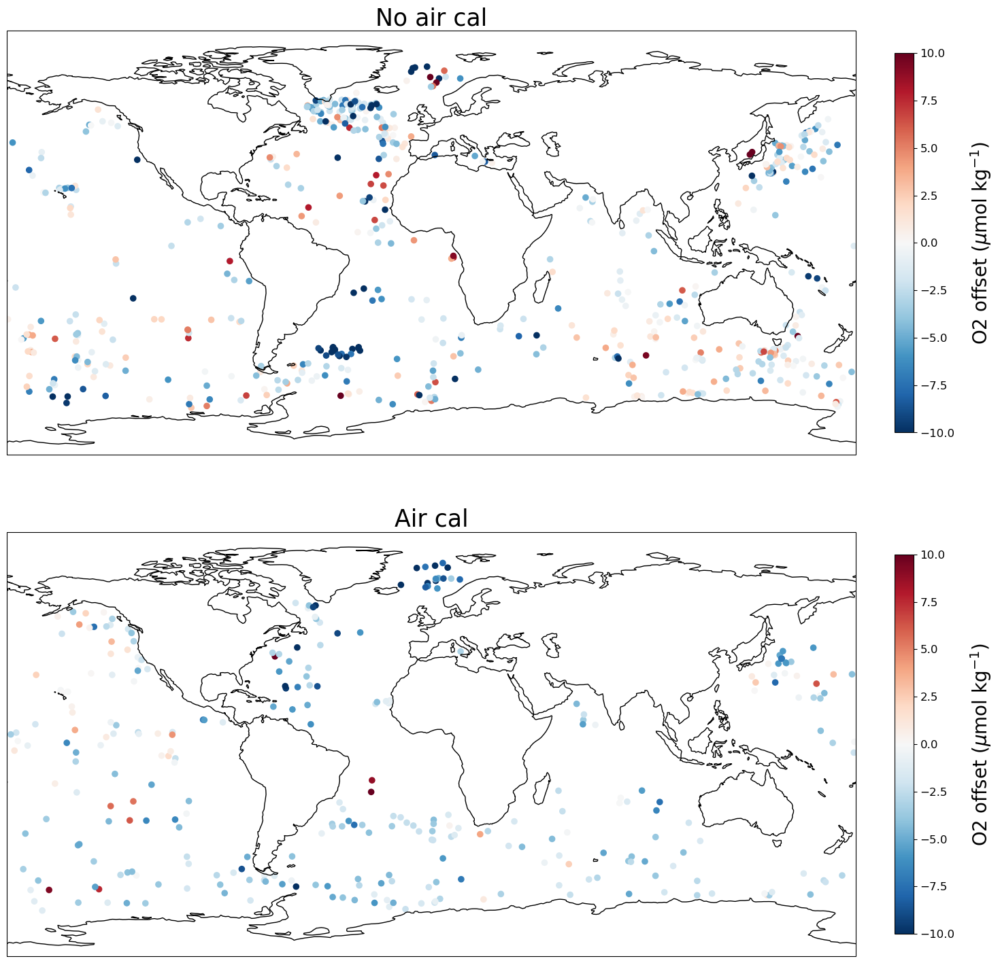

In [ ]:
# Air cal and non-air cal only
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(211, projection=ccrs.PlateCarree())
No_air_cal_all = offsets_g.get_group('no air cal')

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(No_air_cal_all['main_float_longitude'], No_air_cal_all['main_float_latitude'],
                c=No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('No air cal', fontsize=25)


ax = plt.subplot(212, projection=ccrs.PlateCarree())
air_cal_all = offsets_g.get_group('air cal')

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(air_cal_all['main_float_longitude'], air_cal_all['main_float_latitude'],
                c=air_cal_all['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('Air cal', fontsize=25)

plt.tight_layout()

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_air_vs_non_v3.png', dpi=300)


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_12531/3564392731.py:32: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


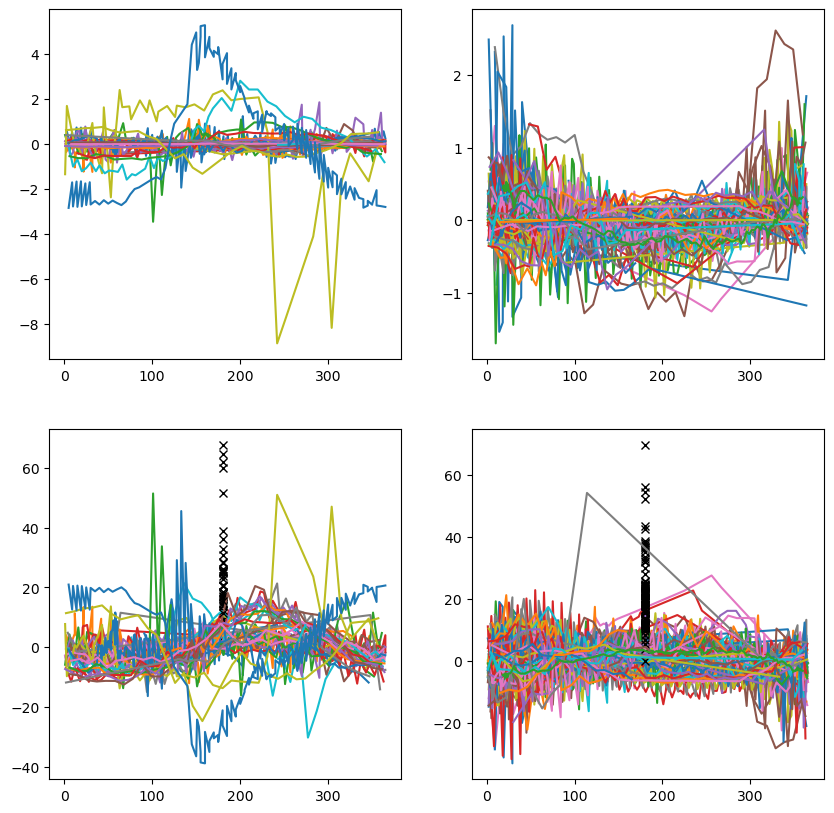

In [ ]:
wmo_seas = np.unique(o2_impact_seasonal['wmo'])
pCO2_anom_ampl_per_all = []
fig = plt.subplots(figsize=(10,10))
# idx = 0
for idx in range(0, len(wmo_seas)):
    wmo_seas[idx]

    pCO2_diff_anom = o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]] - \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])

    pCO2_diff_anom_per = (o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]] - \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]]))/ \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])*100
    
    pCO2_ampl_percent = ((np.max(pCO2_diff_anom) - np.min(pCO2_diff_anom)) / \
        np.abs(np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])))*100

    pCO2_anom_ampl_per_all.append(pCO2_ampl_percent)
    dates = o2_impact_seasonal['day_of_year'][o2_impact_seasonal['wmo']==wmo_seas[idx]]

    dates_list = dates.values
    pCO2_anom_list = pCO2_diff_anom.values
    pCO2_anom__per_list = pCO2_diff_anom_per.values

    sorted_indices = np.argsort(dates_list)

    sorted_dates = [dates_list[i] for i in sorted_indices]
    sorted_pCO2_anom = [pCO2_anom_list[i] for i in sorted_indices]
    sorted_pCO2_per_anom = [pCO2_anom__per_list[i] for i in sorted_indices]

    if np.mean(o2_impact_seasonal['lat'][o2_impact_seasonal['wmo']==wmo_seas[idx]])>0:
        plt.subplot(2,2,1) 

        plt.plot(sorted_dates, sorted_pCO2_anom, '-')
 
        plt.subplot(2,2,3) 
        plt.plot(sorted_dates, sorted_pCO2_per_anom, '-')
        plt.plot(180, pCO2_ampl_percent, 'kx')

    else:
        plt.subplot(2,2,2)
        plt.plot(sorted_dates, sorted_pCO2_anom, '-')
 
        plt.subplot(2,2,4) 
        plt.plot(sorted_dates, sorted_pCO2_per_anom, '-')
        plt.plot(180, pCO2_ampl_percent, 'kx')


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_48952/2076323682.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221)


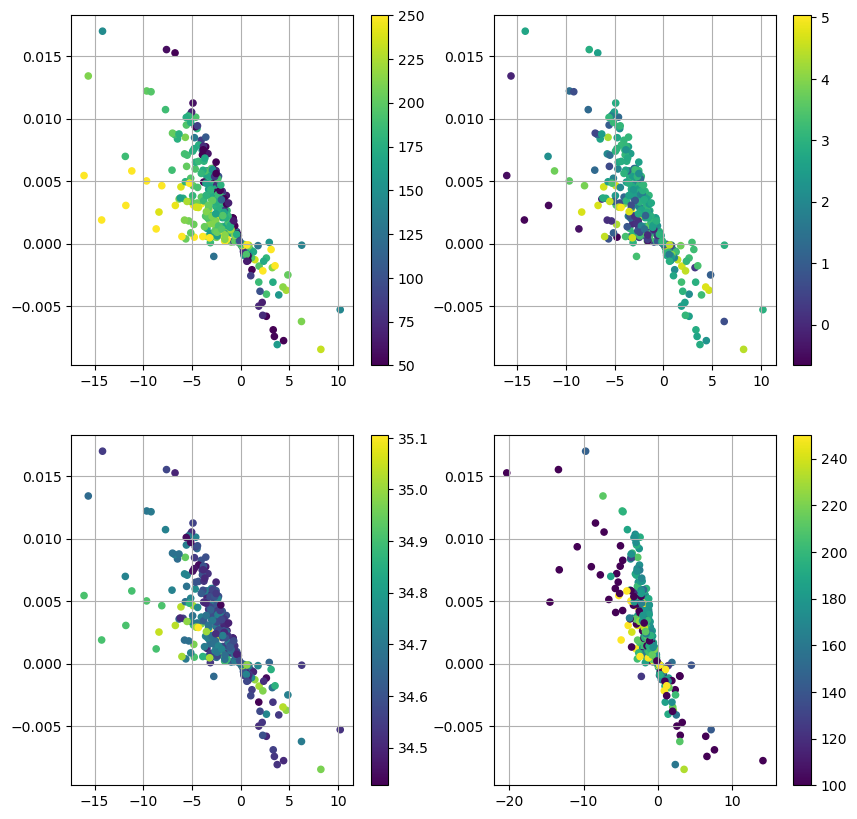

In [ ]:
#fig,(ax1, ax2, ax3, ax4) = plt.subplots(figsize=(10,10), ncols=2, nrows=2)
fig = plt.subplots(figsize=(10,10))
plt.subplot(221)
pos = plt.hist(o2_offset, pH_impact, 20, o2_1500, vmin=50, vmax=250)
plt.colorbar(pos)
plt.grid()

plt.subplot(222)
pos2 = plt.hist(o2_offset, pH_impact, 20, temp_1500)
plt.colorbar(pos2)
plt.grid()

plt.subplot(223)
pos2 = plt.hist(o2_offset, pH_impact, 20, sal_1500)
plt.colorbar(pos2)
plt.grid()

o2_array = np.array(o2_offset).reshape(1,-1)
o2_1500_array = np.array(o2_1500)
pH_impact_array = np.array(pH_impact)

percent_o2 = o2_array/o2_1500_array*100

plt.subplot(224)
pos = plt.hist(percent_o2, pH_impact_array, 20, o2_1500_array, vmin=100, vmax=250)
plt.colorbar(pos)
plt.grid()

plt.savefig(output_dir_figs+ 'pH_impact vs_O2_Offset.png')


[5, 9, 10, 14, 15, 19, 20, 24, 25, 29, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 100, 105, 110, 115, 120, 125, 140, 145, 150, 151, 153, 155, 155, 160, 160, 165, 165, 170, 170, 175, 175, 180, 180, 185, 185, 190, 190, 195, 195, 200, 200, 205, 205, 210, 210, 215, 215, 220, 220, 225, 225, 230, 230, 235, 235, 240, 240, 245, 245, 250, 250, 255, 255, 260, 260, 265, 265, 270, 270, 275, 275, 280, 280, 285, 285, 290, 290, 295, 295, 300, 300, 305, 305, 310, 310, 315, 315, 320, 320, 325, 330, 330, 335, 335, 340, 340, 345, 345, 350, 350, 355, 355, 360, 365]
[-2.8461166082143343, -1.7101026877315242, -2.7829400946190397, -1.6741596249203674, -2.7997005911750428, -1.6645578435636033, -2.779870967987325, -1.7563762839335944, -2.7174797859632243, -1.7048288965377658, -2.696340924612276, -2.539972331712864, -2.697608969791009, -2.5035580382581664, -2.6570435893659585, -2.5198394964760276, -2.6285158314291728, -2.7219793384068574, -2.5638556324872077, -2.2469398709995296, -2.007155198576516, -1.934

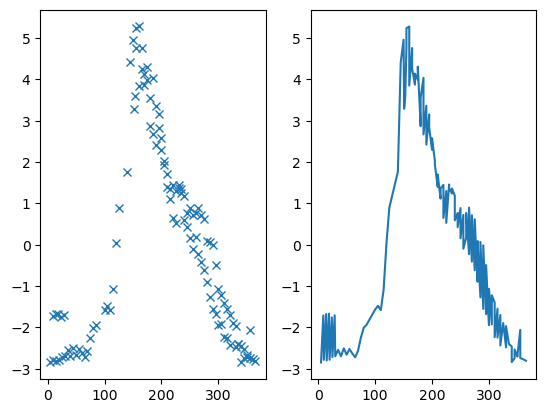

In [ ]:
dates_list = dates.values
pCO2_anom_list = pCO2_diff_anom.values

sorted_indices = np.argsort(dates_list)

sorted_dates = [dates_list[i] for i in sorted_indices]
sorted_pCO2_anom = [pCO2_anom_list[i] for i in sorted_indices]

print(sorted_dates)
print(sorted_pCO2_anom)
plt.subplot(1,2,1)
plt.plot(dates_list, pCO2_anom_list, 'x')
plt.subplot(1,2,2)
plt.plot(sorted_dates, sorted_pCO2_anom, '-')


In [ ]:
new_data_o2_impact_seasonal = pd.DataFrame({
    'long': argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
    'lat': argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
    'pCO2_diff_surface_pH_o2_TALK_orig': pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist()
})

# Concatenate the new DataFrame to o2_impact_seasonal
o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_data_o2_impact_seasonal], ignore_index=True)

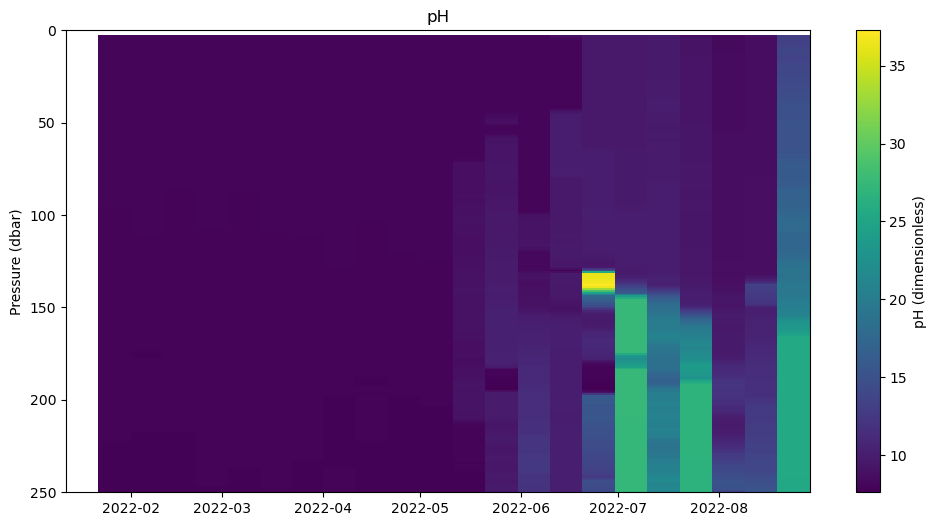

In [ ]:
data = argo_sprof_n
# Interpolate data
param_name = 'PH_IN_SITU_TOTAL_ADJUSTED'
time_coord, pres_coord, time_grid, pres_grid, param_gridded = interpolate_depth_section(param_name)

# Plot depth section of upper ocean only
plt.figure(figsize=(12,6))
plt.pcolormesh(time_grid,pres_grid,param_gridded)
plt.ylim([0,250])
plt.gca().invert_yaxis()
plt.ylabel('Pressure (dbar)')
plt.colorbar(label='{0} ({1})'.format(data[param_name].long_name,data[param_name].units))
plt.title(data[param_name].long_name);

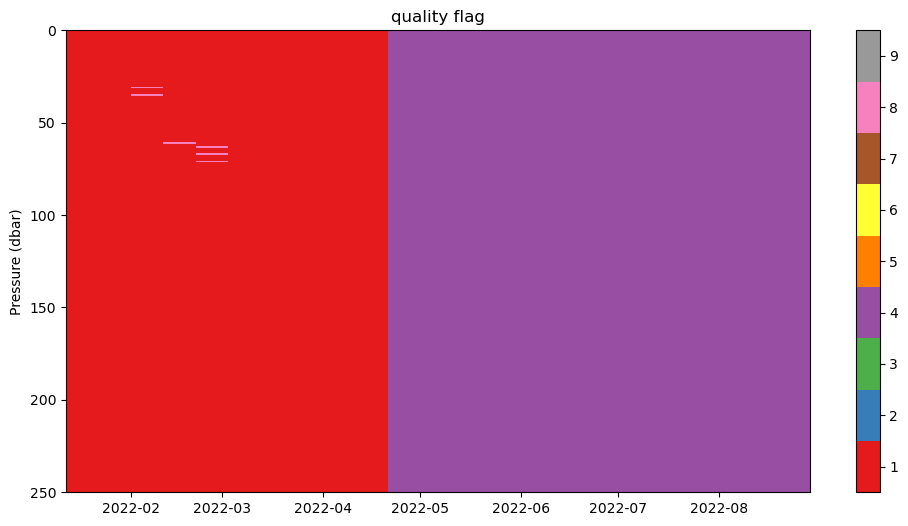

In [ ]:


# Interpolate data
param_name = 'PH_IN_SITU_TOTAL_ADJUSTED_QC'
time_coord, pres_coord, time_grid, pres_grid, param_gridded = interpolate_depth_section(param_name)

# Plot depth section of upper ocean only
plt.figure(figsize=(12,6))
plt.pcolormesh(time_grid,pres_grid,param_gridded,cmap='Set1',vmin=0.5,vmax=9.5)
plt.ylim([0,250])
plt.gca().invert_yaxis()
plt.ylabel('Pressure (dbar)')
plt.colorbar()
plt.title(data[param_name].long_name);
     


In [ ]:
# plotting pCO2 impacts for floats:
derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        derivedlist.append(file)

In [ ]:
pCO2_impact_np = np.array(pCO2_impact)
o2_offset_3 = np.array(o2_offset_3)

print(np.nanmin(pCO2_impact_np))
print(np.nanmax(pCO2_impact_np))

1.870103557566527
1.870103557566527


In [ ]:
pCO2

In [ ]:

msk = (pCO2_impact_np>-300) & (pCO2_impact_np<300)
pCO2_impact_np[msk]

array([], dtype=float64)

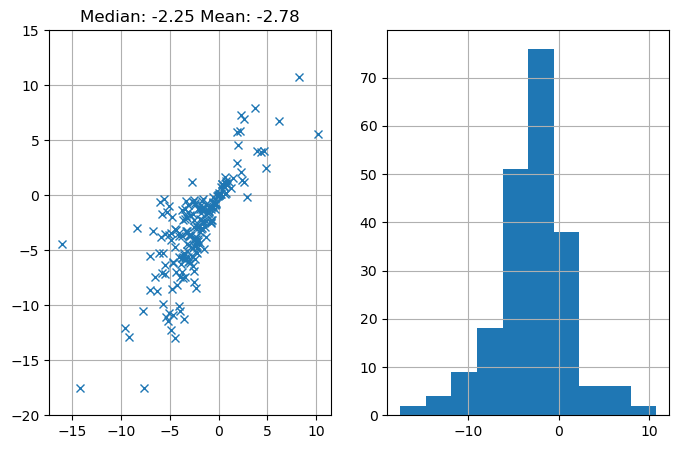

In [ ]:
plt.figure(figsize=(8,5))

plt.subplot(121)
plt.plot(o2_offset_3, pCO2_impact_np, marker = 'x', linestyle='None')
plt.ylim(-20,15)
plt.title('Median: ' + "%.2f" % np.nanmedian(pCO2_impact_np) + ' Mean: ' "%.2f" % np.nanmean(pCO2_impact_np))
plt.grid()
plt.subplot(122)
plt.hist(pCO2_impact_np)
plt.grid()

plt.savefig(output_dir_figs + 'float_pCO2_impact_no_mask.png')


In [ ]:
print(np.mean(glodap_offsets.DOXY_ADJUSTED_offset_trimmed))
print(np.nanmedian(glodap_offsets.DOXY_ADJUSTED_offset_trimmed))

plt.figure(figsize=(20,12))
plt.hist(glodap_offsets.DOXY_ADJUSTED_offset_trimmed, bins=np.linspace(-400, 400, 401))

plt.xlabel('DOXY Offset')
plt.savefig(output_dir_figs + 'Glodap_offsets_doxy_plus_minus_400.png')


NameError: name 'glodap_offsets' is not defined

Looking at impact of oxygen offsets on pH / pCO2 / Nitrate / DIC

In [ ]:
# load glodap_offsets with cal info:

glodap_offsets = xr.load_dataset(output_dir+'glodap_offsets_withcalibration.nc')

In [ ]:
#create meta groups based on calibration groups (air cal, no air cal, no cal)
g = glodap_offsets.o2_calib_group.copy(deep=True)
g = g.where(glodap_offsets.o2_calib_group == 'air cal','not air')
glodap_offsets['o2_calib_air'] = xr.where(glodap_offsets.o2_calib_group=='bad','no cal',g)

glodap_offsets['o2_calib_air_key'] = xr.where(glodap_offsets.o2_calib_air=='air cal',1,0)

glodap_offsets['o2_not_air_key'] = xr.where(glodap_offsets.o2_calib_air=='not air',-1,0)
glodap_offsets['o2_cal_key'] = glodap_offsets['o2_calib_air_key'] + glodap_offsets['o2_not_air_key']

wmo_means = glodap_offsets.groupby('main_float_wmo').mean(...)

In [ ]:
# new dataset of air_cal floats only
a = wmo_means.where(wmo_means.o2_cal_key>0.6, drop=True)

In [ ]:
# checking for inconsistencies in interpolated vs. derived lengths

pH_count = 0;
# load float files, use offset information to calculate impact 
for n in range(2,3): #range(0, len(a.main_float_wmo)):
    wmo_n = int(a.main_float_wmo[n].values)
    
    argo_derived_n = xr.load_dataset(argo_path+ 'derived/' + str(wmo_n) + '_derived.nc')

    print(str(n) + ': ' + str(a.main_float_wmo[n].values))

    print(argo_wmo[wmo_n].PRES_ADJUSTED.shape)
    print(argo_derived_n.PRES_ADJUSTED.shape)
    print(' ')
    

2: 1901362
(36, 951)
(18, 78)
 


In [ ]:
argo_derived_n.PRES_ADJUSTED[0,:]

<xarray.DataArray 'PRES_ADJUSTED' (N_LEVELS: 78)>
array([   6.7     ,   10.9     ,   15.9     ,   21.1     ,   25.900002,
         30.900002,   35.3     ,   40.7     ,   45.4     ,   50.4     ,
         60.3     ,   70.2     ,   80.2     ,   90.299995,  100.7     ,
        110.6     ,  120.2     ,  129.9     ,  140.      ,  150.5     ,
        189.59999 ,  200.8     ,  210.3     ,  220.5     ,  230.4     ,
        240.8     ,  250.09999 ,  260.      ,  270.      ,  280.6     ,
        290.7     ,  300.2     ,  310.6     ,  320.2     ,  330.      ,
        340.      ,  350.40002 ,  374.90002 ,  400.7     ,  425.30002 ,
        450.5     ,  475.      ,  500.6     ,  524.9     ,  550.      ,
        575.2     ,  600.5     ,  625.3     ,  650.3     ,  674.9     ,
        700.3     ,  750.8     ,  800.60004 ,  849.8     ,  900.10004 ,
        950.2     , 1000.60004 , 1049.7     , 1099.5     , 1150.      ,
       1200.      , 1250.7999  , 1300.      , 1349.8999  , 1400.      ,
       1450.2999  , 1500.2999  , 1549.8999  , 1600.1     , 1650.2     ,
       1700.2999  , 1750.3999  , 1800.3999  , 1850.2     , 1900.3999  ,
       1950.1     ,         nan,         nan], dtype=float32)
Dimensions without coordinates: N_LEVELS

In [ ]:
argo_wmo[wmo_n].TEMP_ADJUSTED[:,0]

<xarray.DataArray 'TEMP_ADJUSTED' (N_PROF: 36)>
array([5.958705, 6.061573, 5.986551, 6.152714, 5.939236, 6.016245, 6.049644,
       6.164514, 6.204602, 6.236   , 6.153162, 6.296157, 6.23022 , 6.24085 ,
       6.243927, 6.233834, 6.328376, 6.32239 , 5.958705, 6.061573, 5.986551,
       6.152714, 5.939236, 6.016245, 6.049644, 6.164514, 6.204602, 6.236   ,
       6.153162, 6.296157, 6.23022 , 6.24085 , 6.243927, 6.233834, 6.328376,
       6.32239 ])
Dimensions without coordinates: N_PROF

In [ ]:
LIPHR_path = liar_dir

pH_count = 0;
# load float files, use offset information to calculate impact 
for n in range(37,38): #range(0, len(a.main_float_wmo)):
    wmo_n = int(a.main_float_wmo[n].values)
    
    argo_derived_n = xr.load_dataset(argo_path+ 'derived/' + str(wmo_n) + '_derived.nc')

    # check if the float also has pH
    if 'PH_IN_SITU_TOTAL_ADJUSTED' in argo_derived_n.keys() and np.any(~np.isnan(argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED)):
        pH_count = pH_count+1
        print(str(n) + ': ' + str(a.main_float_wmo[n].values))

    else:
        continue
    
    nprof = argo_derived_n.LATITUDE.shape[0]

    #test_pH = np.empty(nprof, dtype=float)
    
    # initialize coordinate and measurement arrays
    Coordinates_all = np.empty([nprof, 3],dtype=float)
    Coordinates_all[:] = np.nan
       
    Measurements_all = np.empty([nprof, 4],dtype=float)
    Measurements_all[:] = np.nan
    
    MeasIDVec = [1, 7, 3, 6]
    for p in range(nprof):
        index_1500 = argo_wmo[wmo_n].PRES_ADJUSTED[p,:]==1500

        #argo_wmo[5904659].PSAL_ADJUSTED[0,index_1500]
        Coordinates_all[p,:] = np.stack((argo_wmo[wmo_n].LONGITUDE[p].values.flatten(), 
                            argo_wmo[wmo_n].LATITUDE[p].values.flatten(), 
                            argo_wmo[wmo_n].PRES_ADJUSTED[p,index_1500].values.flatten()),
                            axis=1)
        Measurements_all[p,:] = np.stack((argo_wmo[wmo_n].PSAL_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].TEMP_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].NITRATE_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].DOXY_ADJUSTED[p,index_1500].values.flatten()),
                             axis=1)
    
    
    # calculate LIPHR pH for all profiles
    test_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all.tolist(),
                                    MeasIDVec, 
                                    OAAdjustTF = False)  
       
    Measurements_o2_offset = np.concatenate(([Measurements_all[:,0]], 
                                  [Measurements_all[:,1]],
                                  [Measurements_all[:,2]],
                                  [Measurements_all[:,3]] + a.DOXY_ADJUSTED_offset_trimmed[n].values))
    Measurements_o2_offset = np.transpose(Measurements_o2_offset)
    # calculate LIPHR pH for all profiles
    new_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_o2_offset.tolist(),
                                    MeasIDVec, 
                                    OAAdjustTF = False)  
    argo_derived_n['pH_orig_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_orig_LIPHR[:] = test_pH[:,0]

    argo_derived_n['pH_O2_ADJUST_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_O2_ADJUST_LIPHR[:] = new_pH[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_OFFSET'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.mean(new_pH - test_pH)
    
    argo_derived_n.to_netcdf(argo_path+ 'derived/' + str(wmo_n) + '_derived_2.nc')


37: 5904659


In [ ]:
argo_wmo[5904659]

<xarray.Dataset>
Dimensions:                    (N_PROF: 153, N_LEVELS: 951)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/20)
    wmo                        (N_PROF) int64 5904659 5904659 ... 5904659
    profile                    (N_PROF) float64 ...
    juld                       (N_PROF) datetime64[ns] ...
    LATITUDE                   (N_PROF) float64 ...
    LONGITUDE                  (N_PROF) float64 ...
    num_var                    (N_PROF) float64 ...
    ...                         ...
    spice                      (N_PROF, N_LEVELS) float64 ...
    PRES_ADJUSTED              (N_PROF, N_LEVELS) float64 ...
    DIC                        (N_PROF, N_LEVELS) float64 ...
    TALK_LIAR                  (N_PROF, N_LEVELS) float64 ...
    pCO2                       (N_PROF, N_LEVELS) float64 ...
    pCO2_pH_corr               (N_PROF, N_LEVELS) float64 ...

In [ ]:
argo_derived_n

        #call CO2sys to calculate pCO2 with bias correction and no O2 correction (check against original)
        results = pyco2.sys(
                par1=argo_derived_n.TALK_LIAR, 
                par2=argo_derived_n.pH_insitu_corr,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=25.* np.ones(argo_n.PRES_ADJUSTED.shape), #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
                )

<xarray.Dataset>
Dimensions:                                       (N_PROF: 153, N_LEVELS: 558)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/22)
    wmo                                           int64 5904659
    CYCLE_NUMBER                                  (N_PROF) float64 1.0 ... 153.0
    LONGITUDE                                     (N_PROF) float64 -55.38 ......
    LATITUDE                                      (N_PROF) float64 -59.64 ......
    JULD_LOCATION                                 (N_PROF) datetime64[ns] 201...
    TEMP_ADJUSTED                                 (N_PROF, N_LEVELS) float32 ...
    ...                                            ...
    TALK_LIAR                                     (N_PROF, N_LEVELS) float64 ...
    pCO2                                          (N_PROF, N_LEVELS) float64 ...
    pCO2_pH_corr                                  (N_PROF, N_LEVELS) float64 ...
    pH_orig_LIPHR                                 (N_PROF) float64 7.88 ... 7...
    pH_O2_ADJUST_LIPHR                            (N_PROF) float64 7.875 ... ...
    PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_OFFSET  (N_PROF, N_LEVELS) float32 ...

-0.0036396733963356244

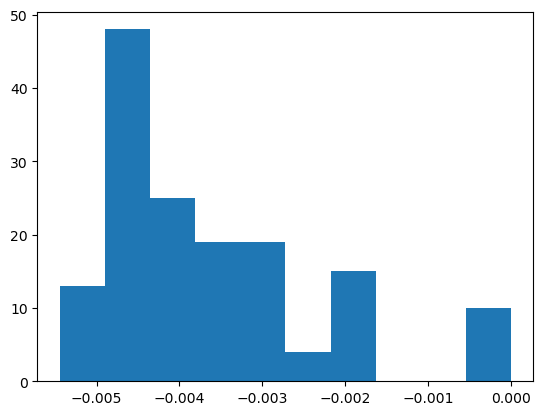

In [ ]:
test_pH - new_pH
plt.hist(new_pH - test_pH)
np.mean(new_pH - test_pH)

<xarray.DataArray 'PH_IN_SITU_TOTAL_ADJUSTED' ()>
array(0.00315701)

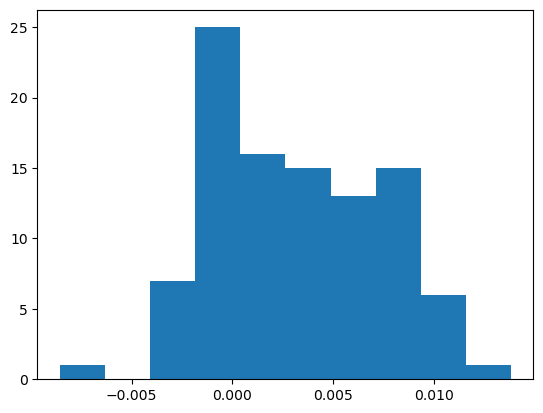

In [ ]:
plt.hist(argo_wmo[wmo_n].PH_IN_SITU_TOTAL_ADJUSTED[:,index_1500] - test_pH)
np.mean(argo_wmo[wmo_n].PH_IN_SITU_TOTAL_ADJUSTED[:,index_1500] - test_pH)